In [ ]:
import pandas as pd
import numpy as np
import datetime
import networkx as nx
import matplotlib.pyplot as plt




In [ ]:
pip install plotly

In [ ]:
pip install python-louvain

In [ ]:
# mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:

# Read the file using pandas
df = pd.read_csv('gdrive/My Drive/soc-sign-bitcoinotc.csv')

In [ ]:
df.head(10)

,Source,Target,Rating,Time
0,6,2,4,1289241912
1,6,5,2,1289241942
2,1,15,1,1289243140
3,4,3,7,1289245277
4,13,16,8,1289254254
5,13,10,8,1289254301
6,7,5,1,1289362700
7,2,21,5,1289370557
8,2,20,5,1289370622
9,21,2,5,1289380982


In [ ]:
#Converting time
df['Time'] = pd.to_datetime(df['Time'], unit='s')


In [ ]:
df.head(10)

,Source,Target,Rating,Time
0,6,2,4,2010-11-08 18:45:12
1,6,5,2,2010-11-08 18:45:42
2,1,15,1,2010-11-08 19:05:40
3,4,3,7,2010-11-08 19:41:17
4,13,16,8,2010-11-08 22:10:54
5,13,10,8,2010-11-08 22:11:41
6,7,5,1,2010-11-10 04:18:20
7,2,21,5,2010-11-10 06:29:17
8,2,20,5,2010-11-10 06:30:22
9,21,2,5,2010-11-10 09:23:02


In [ ]:
df.describe()

,Source,Target,Rating
count,35592.000000,35592.000000,35592.000000
mean,2353.847269,2417.478254,1.012025
std,1605.771178,1658.232170,3.562094
min,1.000000,1.000000,-10.000000
25%,988.000000,978.000000,1.000000
50%,2125.000000,2178.000000,1.000000
75%,3722.000000,3804.000000,2.000000
max,6000.000000,6005.000000,10.000000


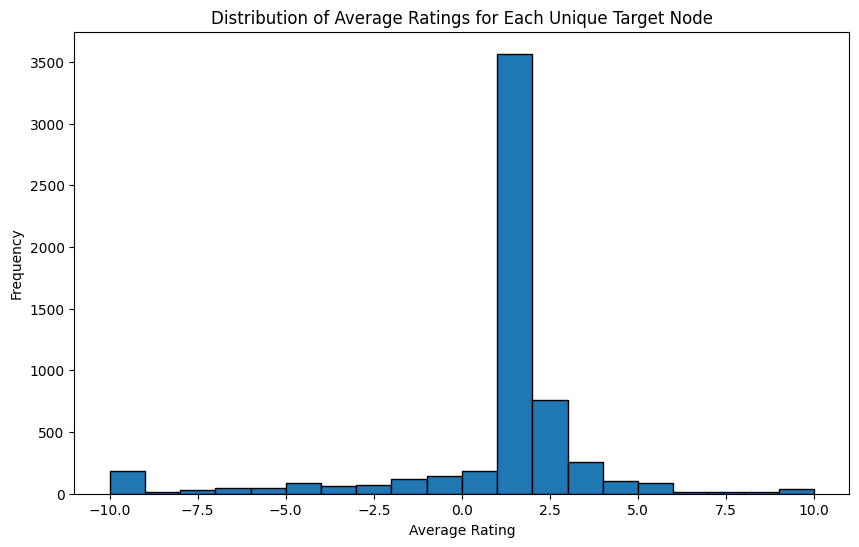

,Target,Avg_Rating,Max_Rating,Min_Rating
0,1,3.544248,10,1
1,2,3.000000,8,-2
2,3,-0.285714,8,-10
3,4,3.111111,10,1
4,5,2.333333,4,1


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mode

# Assuming that the DataFrame `df` is already loaded with the columns 'Source', 'Target', 'Rating', 'Time'

# Calculate average rating for each unique target node
avg_rating_per_target = df.groupby('Target')['Rating'].mean()

# Calculate mode of rating for each target node
#mode_rating_per_target = df.groupby('Target')['Rating'].agg(lambda x: mode(x).mode[0])

# Calculate max rating for each target node
max_rating_per_target = df.groupby('Target')['Rating'].max()

# Calculate min rating for each target node
min_rating_per_target = df.groupby('Target')['Rating'].min()

# Combine all the statistics into one DataFrame
target_rating_stats = pd.DataFrame({
    'Avg_Rating': avg_rating_per_target,
    #'Mode_Rating': mode_rating_per_target,
    'Max_Rating': max_rating_per_target,
    'Min_Rating': min_rating_per_target
}).reset_index()

# Plot the distribution of average ratings
plt.figure(figsize=(10, 6))
avg_rating_per_target.hist(bins=20, edgecolor='black')
plt.title('Distribution of Average Ratings for Each Unique Target Node')
plt.xlabel('Average Rating')
plt.ylabel('Frequency')
plt.grid(False)
plt.show()

# Show the first few rows of the rating statistics for each target node
target_rating_stats.head()


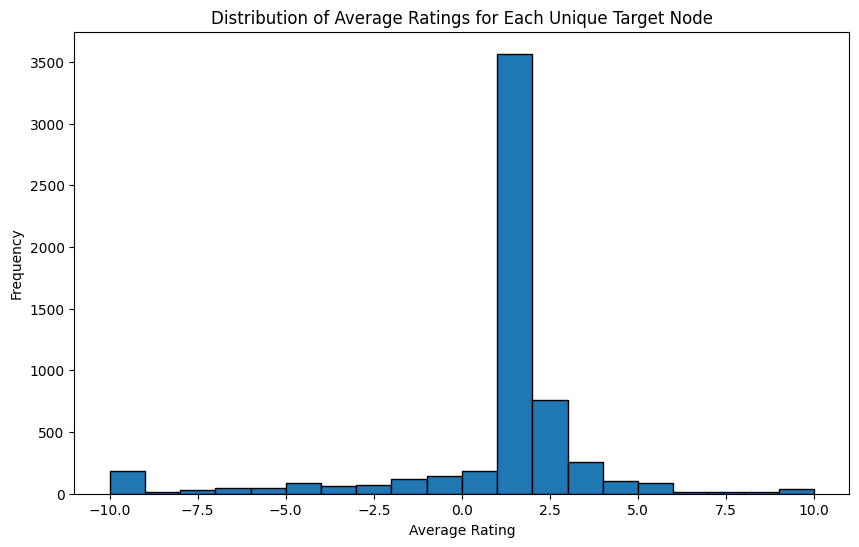

Targets with ratings separated by 10:
      Target  Avg_Rating  Mode_Rating  Max_Rating  Min_Rating
1          2    3.000000            1           8          -2
86       115    1.750000            1           6          -4
461      502    1.416667            1           5          -5
718      760    3.222222            5           5          -5
733      775    1.821429            1           9          -1
1225    1268    2.266667            1           9          -1
1274    1317    2.018182            1           9          -1
1782    1832    1.857143            1           9          -1
1951    2002   -3.250000           -9           1          -9
2021    2072    1.444444            1           5          -5
2142    2194    0.552632            1           5          -5
2772    2835    1.562500            1           9          -1
4748    4858   -3.000000           -8           2          -8
5386    5501   -2.666667            1           1          -9
5390    5505   -4.333333        

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming that the DataFrame `df` is already loaded with the columns 'Source', 'Target', 'Rating', 'Time'

# Define a custom function to calculate mode
def calculate_mode(x):
    mode_result = x.mode()
    if not mode_result.empty:
        return mode_result.iloc[0]
    else:
        return None

# Calculate average rating for each unique target node
avg_rating_per_target = df.groupby('Target')['Rating'].mean()

# Calculate mode of rating for each target node
mode_rating_per_target = df.groupby('Target')['Rating'].agg(calculate_mode)

# Calculate max rating for each target node
max_rating_per_target = df.groupby('Target')['Rating'].max()

# Calculate min rating for each target node
min_rating_per_target = df.groupby('Target')['Rating'].min()

# Combine all the statistics into one DataFrame
target_rating_stats = pd.DataFrame({
    'Avg_Rating': avg_rating_per_target,
    'Mode_Rating': mode_rating_per_target,
    'Max_Rating': max_rating_per_target,
    'Min_Rating': min_rating_per_target
}).reset_index()

# Plot the distribution of average ratings
plt.figure(figsize=(10, 6))
avg_rating_per_target.hist(bins=20, edgecolor='black')
plt.title('Distribution of Average Ratings for Each Unique Target Node')
plt.xlabel('Average Rating')
plt.ylabel('Frequency')
plt.grid(False)
plt.show()

# Show the first few rows of the rating statistics for each target node
target_rating_stats.head()

# Filter targets with ratings separated by 10
targets_with_10_ratings_difference = target_rating_stats[target_rating_stats['Max_Rating'] - target_rating_stats['Min_Rating'] == 10]
print("Targets with ratings separated by 10:")
print(targets_with_10_ratings_difference)



In [ ]:
target_rating_stats.head()

,Target,Avg_Rating,Mode_Rating,Max_Rating,Min_Rating
0,1,3.544248,1,10,1
1,2,3.000000,1,8,-2
2,3,-0.285714,-10,8,-10
3,4,3.111111,1,10,1
4,5,2.333333,1,4,1


In [ ]:
# Filter targets with mode rating of -10 or 10
targets_mode_minus_10_or_10 = target_rating_stats[
    (target_rating_stats['Mode_Rating'] == -10) | (target_rating_stats['Mode_Rating'] == 10)
]

print("Targets with mode rating of -10 or 10:")
print(targets_mode_minus_10_or_10)


Targets with mode rating of -10 or 10:
      Target  Avg_Rating  Mode_Rating  Max_Rating  Min_Rating
2          3   -0.285714          -10           8         -10
18        25    2.610619           10          10         -10
43        61   -0.555556          -10           5         -10
219      260   -1.666667          -10           4         -10
269      310   -5.142857          -10           4         -10
...      ...         ...          ...         ...         ...
5827    5973  -10.000000          -10         -10         -10
5829    5975  -10.000000          -10         -10         -10
5830    5976  -10.000000          -10         -10         -10
5831    5977  -10.000000          -10         -10         -10
5847    5993  -10.000000          -10         -10         -10

[567 rows x 5 columns]


In [ ]:
# Filter targets with mode rating of -10
targets_mode_minus_10 = target_rating_stats[target_rating_stats['Mode_Rating'] == -10]
# Count the number of targets with mode rating of -10
count_mode_minus_10 = len(targets_mode_minus_10)

# Filter targets with mode rating of 10
targets_mode_10 = target_rating_stats[target_rating_stats['Mode_Rating'] == 10]
# Count the number of targets with mode rating of 10
count_mode_10 = len(targets_mode_10)

print("Count of targets with mode rating of -10:", count_mode_minus_10)
print("Count of targets with mode rating of 10:", count_mode_10)


Count of targets with mode rating of -10: 525
Count of targets with mode rating of 10: 42


In [ ]:
# Filter the original DataFrame to get nodes with mode rating of -10 and +10 separately
nodes_mode_minus_10 = target_rating_stats[target_rating_stats['Mode_Rating'] == -10]['Target'].tolist()
nodes_mode_10 = target_rating_stats[target_rating_stats['Mode_Rating'] == 10]['Target'].tolist()

# Print the lists of nodes for mode rating of -10 and +10
print("Nodes with mode rating of -10:", nodes_mode_minus_10)
print("Nodes with mode rating of +10:", nodes_mode_10)


Nodes with mode rating of -10: [3, 61, 260, 310, 315, 410, 472, 574, 672, 713, 733, 766, 787, 805, 824, 870, 906, 957, 958, 984, 1074, 1099, 1116, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1211, 1293, 1308, 1327, 1329, 1363, 1383, 1387, 1393, 1443, 1535, 1543, 1572, 1600, 1609, 1671, 1705, 1719, 1750, 1753, 1756, 1792, 1853, 1862, 1917, 1956, 2017, 2096, 2148, 2209, 2225, 2239, 2245, 2343, 2367, 2434, 2471, 2498, 2503, 2505, 2514, 2516, 2522, 2530, 2532, 2539, 2540, 2541, 2542, 2543, 2544, 2545, 2548, 2549, 2561, 2566, 2567, 2568, 2569, 2570, 2571, 2572, 2573, 2574, 2581, 2585, 2592, 2597, 2598, 2601, 2602, 2603, 2617, 2619, 2621, 2622, 2623, 2628, 2629, 2631, 2632, 2634, 2657, 2660, 2666, 2669, 2670, 2671, 2672, 2673, 2674, 2675, 2676, 2677, 2678, 2680, 2682, 2683, 2684, 2689, 2690, 2694, 2695, 2697, 2698, 2699, 2700, 2701, 2702, 2703, 2704, 2705, 2706, 2707, 2708, 2709, 2712, 2714, 2717, 2718, 2720, 2721, 2722, 2735, 2736, 2737, 2738, 2741, 2743, 2744, 2745, 2747, 2753, 2766, 2778, 2

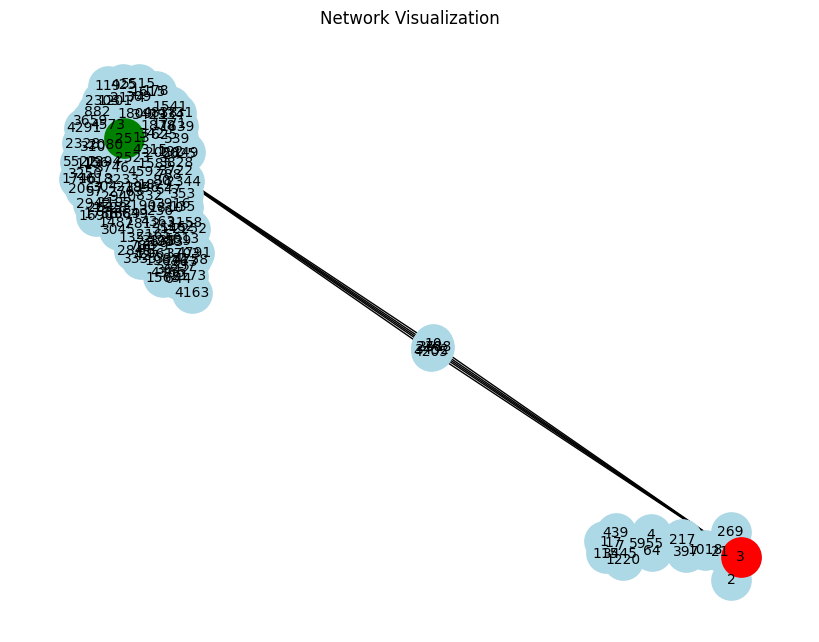

In [ ]:
def plot_network_for_nodes(node_minus_10, node_10):
    # Create a subgraph of the original graph with only the selected nodes
    subgraph_nodes = [node_minus_10, node_10]
    subgraph_df = df[df['Target'].isin(subgraph_nodes)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', create_using=nx.DiGraph())

    # Plot the network
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10)
    nx.draw_networkx_nodes(G, pos, nodelist=[node_minus_10], node_color='red', node_size=800)
    nx.draw_networkx_nodes(G, pos, nodelist=[node_10], node_color='green', node_size=800)
    plt.title('Network Visualization')
    plt.show()

# Example usage:
# Choose one node from each category to plot the network
node_minus_10 = nodes_mode_minus_10[0]
node_10 = nodes_mode_10[0]
plot_network_for_nodes(node_minus_10, node_10)


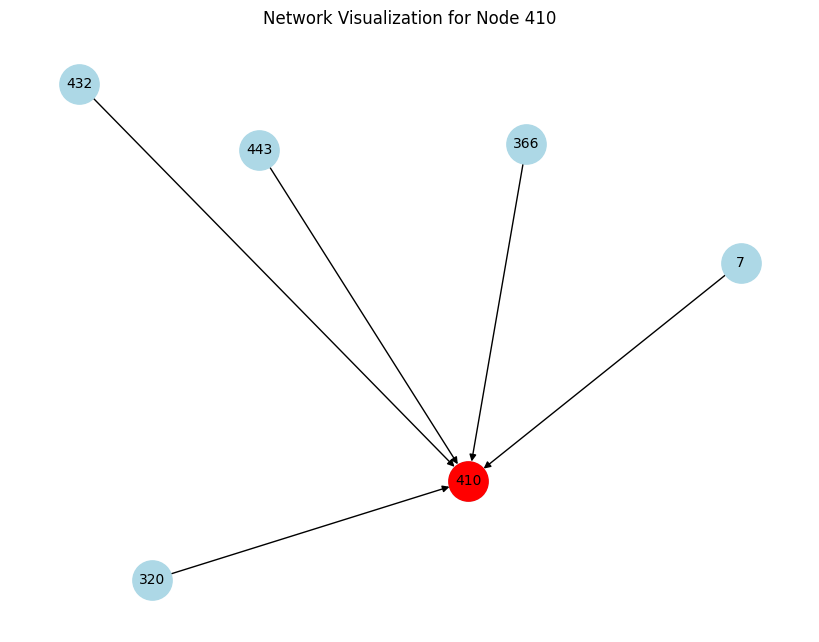

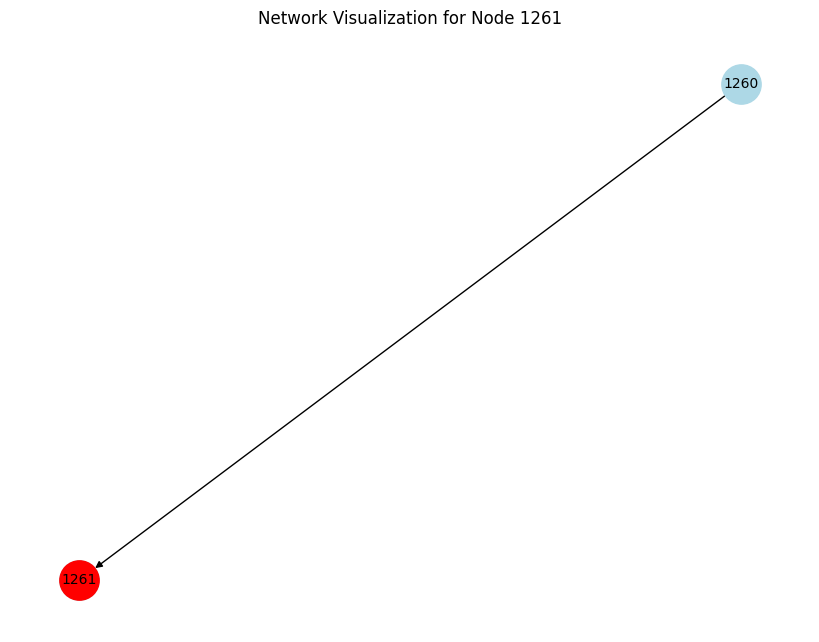

In [ ]:
def plot_network_for_node(node):
    # Create a subgraph of the original graph with only the selected node
    subgraph_df = df[df['Target'] == node]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', create_using=nx.DiGraph())

    # Plot the network
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10)
    nx.draw_networkx_nodes(G, pos, nodelist=[node], node_color='red', node_size=800)
    plt.title(f'Network Visualization for Node {node}')
    plt.show()

# Example usage:
# Choose one node from each category to plot the network
node_minus_10 = nodes_mode_minus_10[5]  # Choose a node with mode rating of -10
node_10 = nodes_mode_10[5]  # Choose a node with mode rating of +10

# Plot the network for the chosen nodes one at a time
plot_network_for_node(node_minus_10)
plot_network_for_node(node_10)


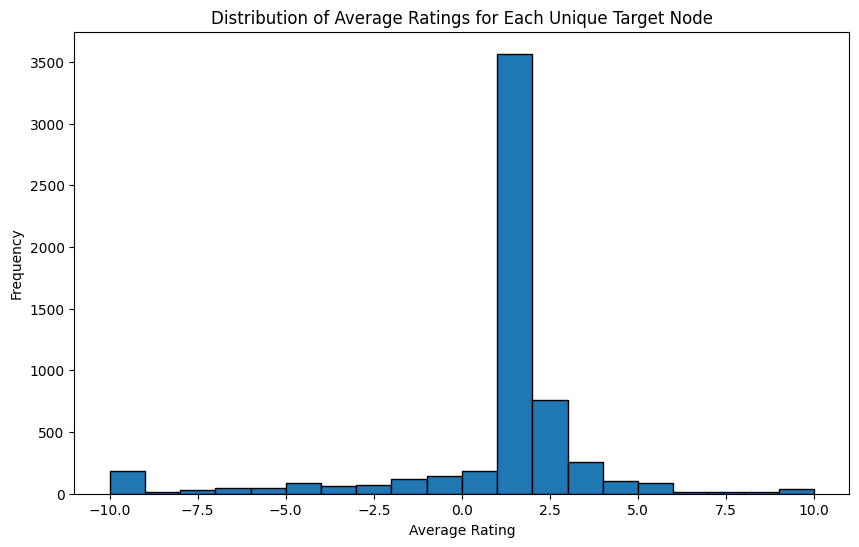

First few rows of rating statistics for each target node:
   Target  Avg_Rating  Mode_Rating  Max_Rating  Min_Rating  Count_Rating_10  \
0       1    3.544248            1          10           1             23.0   
1       2    3.000000            1           8          -2              0.0   
2       3   -0.285714          -10           8         -10              0.0   
3       4    3.111111            1          10           1              1.0   
4       5    2.333333            1           4           1              0.0   

   Count_Rating_minus_10  
0                    0.0  
1                    0.0  
2                    5.0  
3                    0.0  
4                    0.0  

Targets with ratings separated by 10:
      Target  Avg_Rating  Mode_Rating  Max_Rating  Min_Rating  \
1          2    3.000000            1           8          -2   
86       115    1.750000            1           6          -4   
461      502    1.416667            1           5          -5   
718   

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming that the DataFrame `df` is already loaded with the columns 'Source', 'Target', 'Rating', 'Time'

# Define a custom function to calculate mode
def calculate_mode(x):
    mode_result = x.mode()
    if not mode_result.empty:
        return mode_result.iloc[0]
    else:
        return None

# Calculate average rating for each unique target node
avg_rating_per_target = df.groupby('Target')['Rating'].mean()

# Calculate mode of rating for each target node
mode_rating_per_target = df.groupby('Target')['Rating'].agg(calculate_mode)

# Calculate max rating for each target node
max_rating_per_target = df.groupby('Target')['Rating'].max()

# Calculate min rating for each target node
min_rating_per_target = df.groupby('Target')['Rating'].min()

# Combine all the statistics into one DataFrame
target_rating_stats = pd.DataFrame({
    'Avg_Rating': avg_rating_per_target,
    'Mode_Rating': mode_rating_per_target,
    'Max_Rating': max_rating_per_target,
    'Min_Rating': min_rating_per_target
}).reset_index()

# Count of times rating +10 was given to each target
count_rating_10_per_target = df[df['Rating'] == 10].groupby('Target').size()

# Count of times rating -10 was given to each target
count_rating_minus_10_per_target = df[df['Rating'] == -10].groupby('Target').size()

# Merge counts with target_rating_stats DataFrame
target_rating_stats = target_rating_stats.merge(count_rating_10_per_target.rename('Count_Rating_10'),
                                                left_on='Target', right_index=True, how='left')
target_rating_stats = target_rating_stats.merge(count_rating_minus_10_per_target.rename('Count_Rating_minus_10'),
                                                left_on='Target', right_index=True, how='left')

# Fill NaN values with 0
target_rating_stats['Count_Rating_10'].fillna(0, inplace=True)
target_rating_stats['Count_Rating_minus_10'].fillna(0, inplace=True)

# Plot the distribution of average ratings
plt.figure(figsize=(10, 6))
avg_rating_per_target.hist(bins=20, edgecolor='black')
plt.title('Distribution of Average Ratings for Each Unique Target Node')
plt.xlabel('Average Rating')
plt.ylabel('Frequency')
plt.grid(False)
plt.show()

# Show the first few rows of the rating statistics for each target node
print("First few rows of rating statistics for each target node:")
print(target_rating_stats.head())

# Filter targets with ratings separated by 10
targets_with_10_ratings_difference = target_rating_stats[target_rating_stats['Max_Rating'] - target_rating_stats['Min_Rating'] == 10]
print("\nTargets with ratings separated by 10:")
print(targets_with_10_ratings_difference)


In [ ]:
# Filter the original DataFrame to get nodes with mode rating of -10 and +10 separately
nodes_mode_minus_10 = target_rating_stats[target_rating_stats['Mode_Rating'] == -10]['Target'].tolist()
nodes_mode_10 = target_rating_stats[target_rating_stats['Mode_Rating'] == 10]['Target'].tolist()

# Count the number of nodes with mode rating of -10 and +10
count_nodes_mode_minus_10 = len(nodes_mode_minus_10)
count_nodes_mode_10 = len(nodes_mode_10)

# Print the lists of nodes and their counts for mode rating of -10 and +10
print("Nodes with mode rating of -10 (Count:", count_nodes_mode_minus_10, "):", nodes_mode_minus_10)
print("Nodes with mode rating of +10 (Count:", count_nodes_mode_10, "):", nodes_mode_10)


Nodes with mode rating of -10 (Count: 525 ): [3, 61, 260, 310, 315, 410, 472, 574, 672, 713, 733, 766, 787, 805, 824, 870, 906, 957, 958, 984, 1074, 1099, 1116, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1211, 1293, 1308, 1327, 1329, 1363, 1383, 1387, 1393, 1443, 1535, 1543, 1572, 1600, 1609, 1671, 1705, 1719, 1750, 1753, 1756, 1792, 1853, 1862, 1917, 1956, 2017, 2096, 2148, 2209, 2225, 2239, 2245, 2343, 2367, 2434, 2471, 2498, 2503, 2505, 2514, 2516, 2522, 2530, 2532, 2539, 2540, 2541, 2542, 2543, 2544, 2545, 2548, 2549, 2561, 2566, 2567, 2568, 2569, 2570, 2571, 2572, 2573, 2574, 2581, 2585, 2592, 2597, 2598, 2601, 2602, 2603, 2617, 2619, 2621, 2622, 2623, 2628, 2629, 2631, 2632, 2634, 2657, 2660, 2666, 2669, 2670, 2671, 2672, 2673, 2674, 2675, 2676, 2677, 2678, 2680, 2682, 2683, 2684, 2689, 2690, 2694, 2695, 2697, 2698, 2699, 2700, 2701, 2702, 2703, 2704, 2705, 2706, 2707, 2708, 2709, 2712, 2714, 2717, 2718, 2720, 2721, 2722, 2735, 2736, 2737, 2738, 2741, 2743, 2744, 2745, 2747, 2753,

In [ ]:
# Count of times each node in nodes_mode_minus_10 was rated as -10
count_rating_minus_10_per_node_minus_10 = df[(df['Target'].isin(nodes_mode_minus_10)) & (df['Rating'] == -10)].groupby('Target').size()

# Count of times each node in nodes_mode_10 was rated as +10
count_rating_10_per_node_10 = df[(df['Target'].isin(nodes_mode_10)) & (df['Rating'] == 10)].groupby('Target').size()

# Print the counts for nodes in each list
print("Count of times each node in nodes_mode_minus_10 was rated as -10:")
print(count_rating_minus_10_per_node_minus_10)

print("\nCount of times each node in nodes_mode_10 was rated as +10:")
print(count_rating_10_per_node_10)


Count of times each node in nodes_mode_minus_10 was rated as -10:
Target
3       5
61      2
260     1
310     4
315     1
       ..
5973    1
5975    1
5976    1
5977    1
5993    1
Length: 525, dtype: int64

Count of times each node in nodes_mode_10 was rated as +10:
Target
25      35
529      1
814      1
1122     1
1191     2
1261     1
1326     1
1340     1
1501     1
1545     1
1663     1
1669     3
2078     1
2082     1
2305     3
2347     1
2377     3
2685     1
3125     1
3293     2
3484     1
3888     1
3975     1
4257     1
4261     1
4393     2
4639     1
4823     2
4824     1
5032     1
5162     1
5163     1
5284     1
5438     1
5568     1
5618     2
5720     1
5729     4
5761     1
5824     1
5826     1
5960     1
dtype: int64


In [ ]:
# Check if there are any edges connected to node 25 in the DataFrame
edges_connected_to_node_25 = df[(df['Source'] == 25) | (df['Target'] == 25)]
print(edges_connected_to_node_25)


       Source  Target  Rating                Time
20         10      25      10 2010-11-12 09:57:22
201        80      25       2 2011-01-17 16:43:51
253       119      25       1 2011-02-02 01:14:33
542        57      25       2 2011-03-08 04:04:18
846       149      25      10 2011-04-14 14:30:27
...       ...     ...     ...                 ...
33265    1746      25       3 2014-08-02 22:51:57
33628    2194      25       1 2014-08-27 16:44:34
34009    4365      25     -10 2014-10-14 14:29:26
34179    1394      25       2 2014-11-04 18:33:34
34889    4205      25       1 2015-03-28 15:10:38

[113 rows x 4 columns]


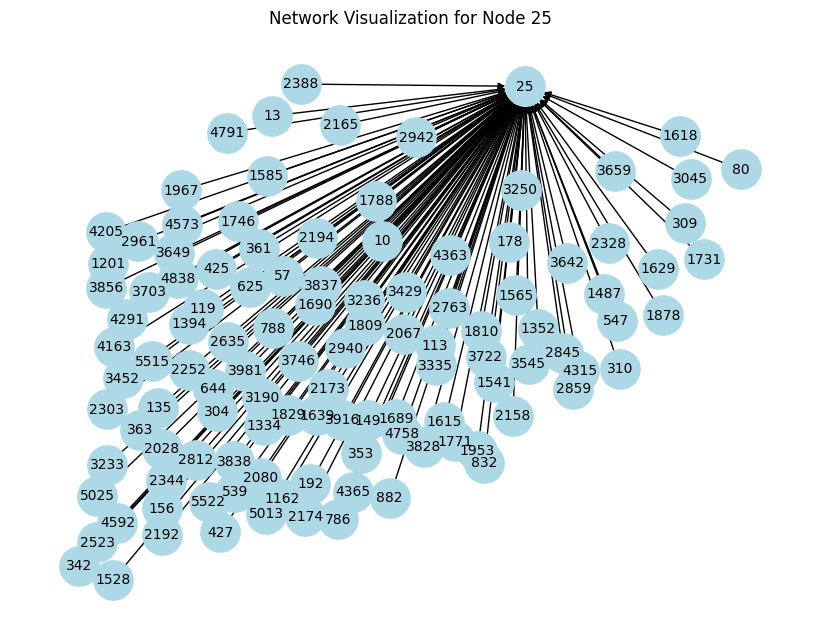

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges connected to node 25
subgraph_df = df[df['Target'] == 25]

# Create a directed graph
G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', create_using=nx.DiGraph())

# Plot the network
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # Layout for the nodes
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10)
plt.title('Network Visualization for Node 25')
plt.show()


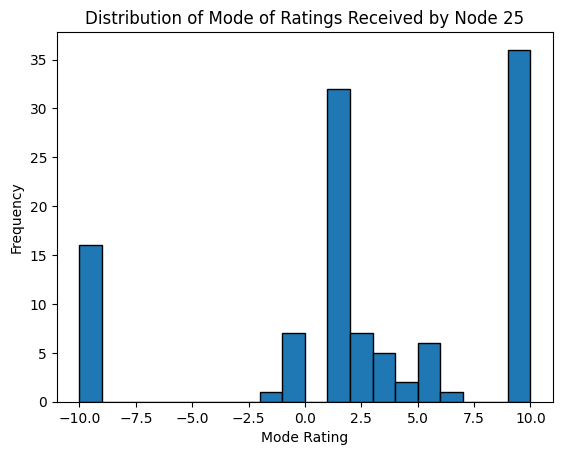

In [ ]:
import matplotlib.pyplot as plt
from scipy.stats import mode

# Filter the DataFrame to include only the rows where node 25 is the target
ratings_received_by_node_25 = df[df['Target'] == 25]['Rating']

# Calculate the mode of ratings received by node 25
mode_ratings_node_25 = ratings_received_by_node_25

# Plot the distribution of the mode of ratings received by node 25
plt.hist(mode_ratings_node_25, bins=20, edgecolor='black')
plt.title('Distribution of Mode of Ratings Received by Node 25')
plt.xlabel('Mode Rating')
plt.ylabel('Frequency')
plt.grid(False)
plt.show()


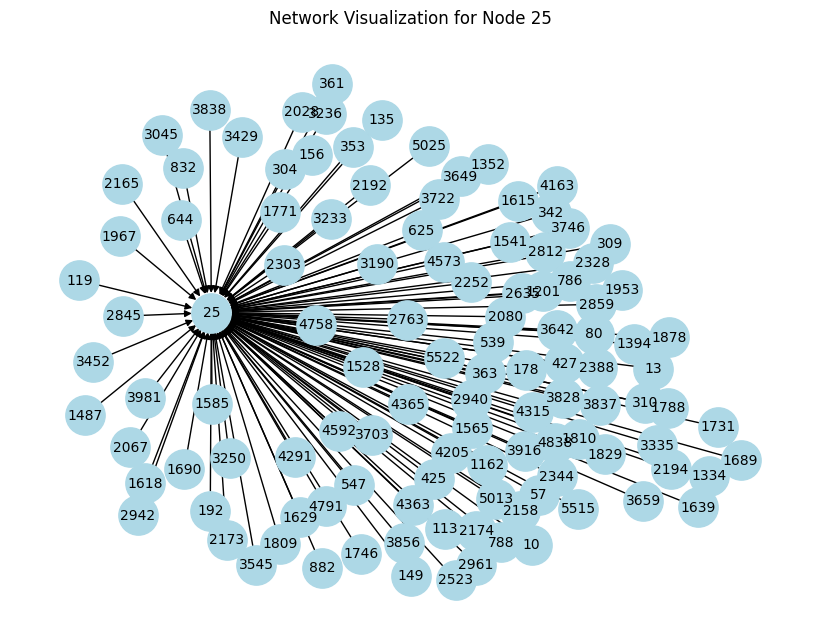

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges connected to node 25
subgraph_df = df[df['Target'] == 25]

# Create a directed graph
G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', create_using=nx.DiGraph())

# Plot the network
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # Layout for the nodes
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10)
plt.title('Network Visualization for Node 25')
plt.show()

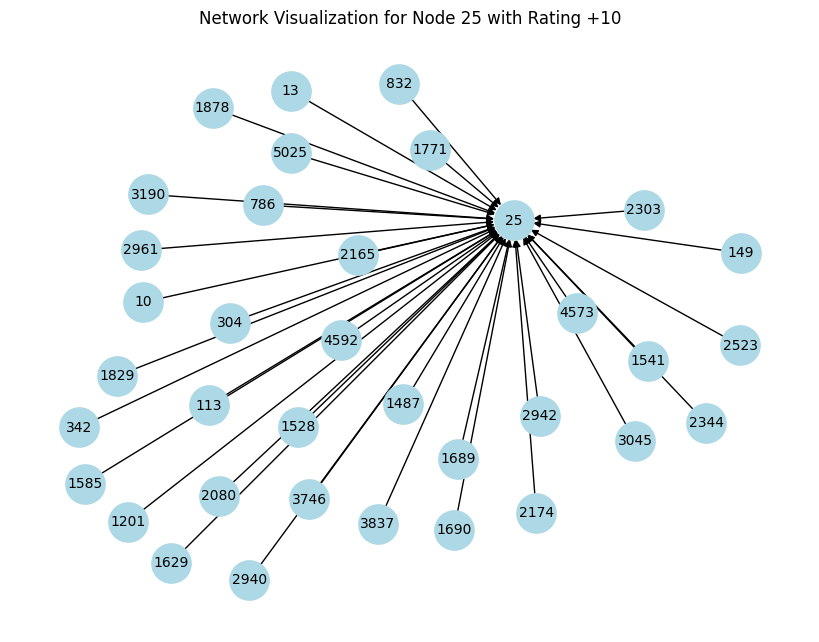

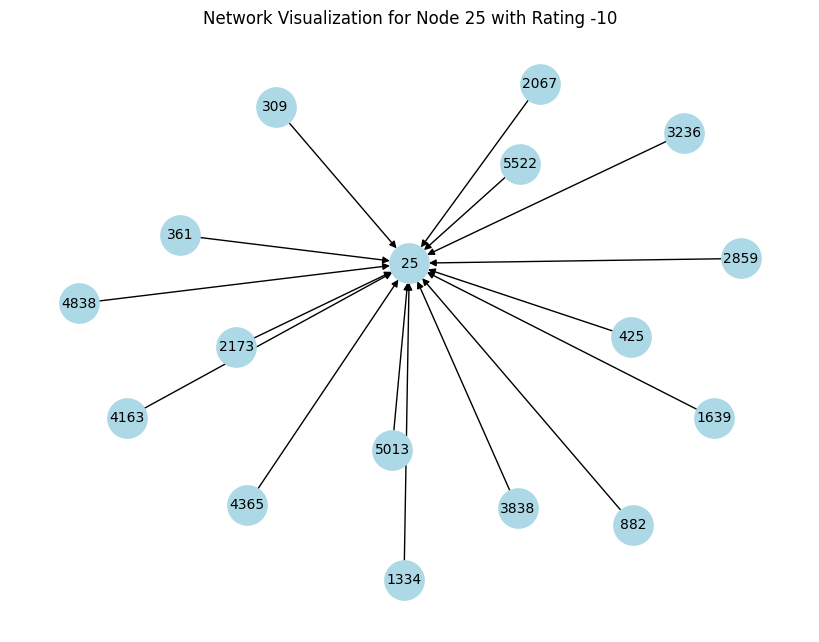

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges with rating +10 and connected to node 25
subgraph_df_rating_10 = df[(df['Target'] == 25) & (df['Rating'] == 10)]

# Create a directed graph for rating +10
G_rating_10 = nx.from_pandas_edgelist(subgraph_df_rating_10, 'Source', 'Target', create_using=nx.DiGraph())

# Plot the network for rating +10
plt.figure(figsize=(8, 6))
pos_rating_10 = nx.spring_layout(G_rating_10)  # Layout for the nodes
nx.draw(G_rating_10, pos_rating_10, with_labels=True, node_color='lightblue', node_size=800, font_size=10)
plt.title('Network Visualization for Node 25 with Rating +10')
plt.show()

# Filter the original DataFrame to include only the edges with rating -10 and connected to node 25
subgraph_df_rating_minus_10 = df[(df['Target'] == 25) & (df['Rating'] == -10)]

# Create a directed graph for rating -10
G_rating_minus_10 = nx.from_pandas_edgelist(subgraph_df_rating_minus_10, 'Source', 'Target', create_using=nx.DiGraph())

# Plot the network for rating -10
plt.figure(figsize=(8, 6))
pos_rating_minus_10 = nx.spring_layout(G_rating_minus_10)  # Layout for the nodes
nx.draw(G_rating_minus_10, pos_rating_minus_10, with_labels=True, node_color='lightblue', node_size=800, font_size=10)
plt.title('Network Visualization for Node 25 with Rating -10')
plt.show()


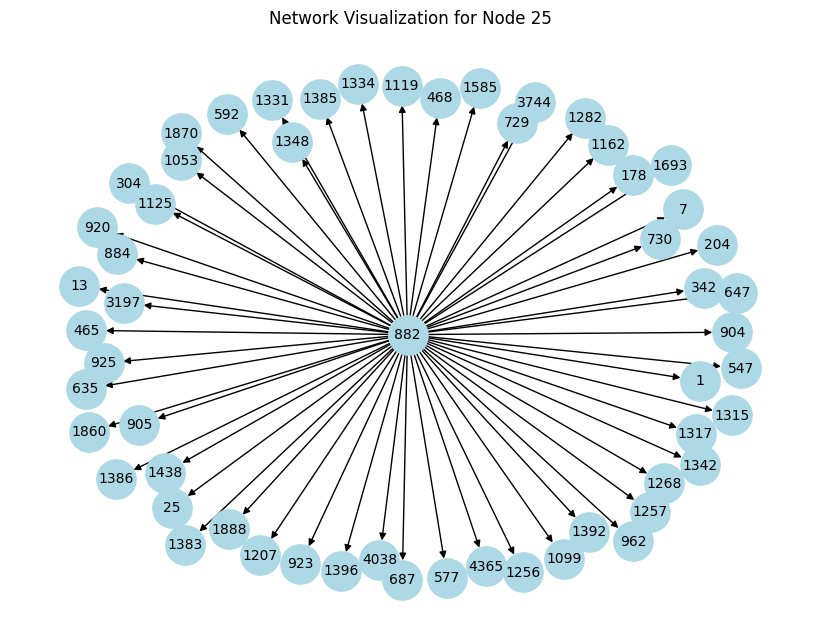

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges connected to node 25
subgraph_df = df[df['Source'] == 882]

# Create a directed graph
G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', create_using=nx.DiGraph())

# Plot the network
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # Layout for the nodes
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10)
plt.title('Network Visualization for Node 25')
plt.show()

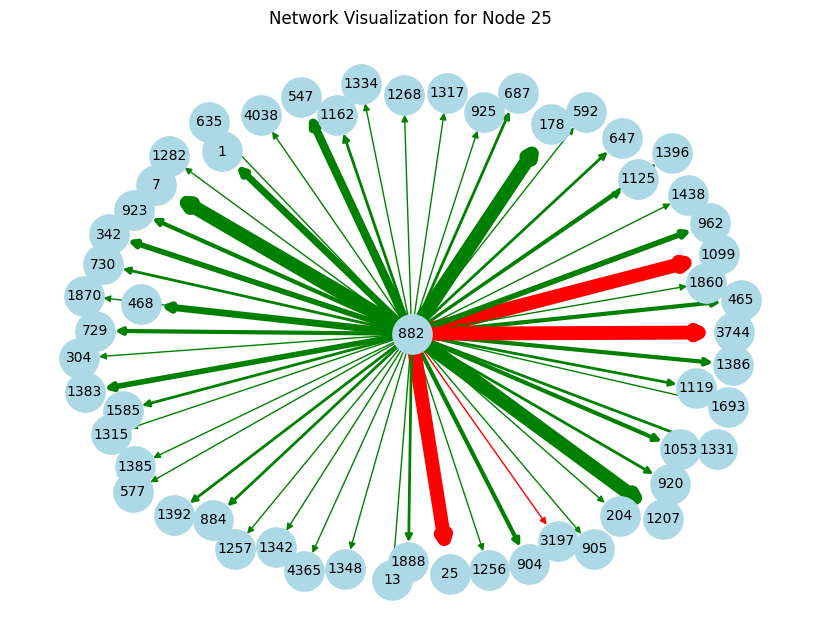

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges connected to node 25
subgraph_df = df[df['Source'] == 882]

# Create a directed graph
G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

# Assign edge colors and thickness based on the sign and magnitude of the rating
edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

# Plot the network
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # Layout for the nodes
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths)
plt.title('Network Visualization for Node 25')
plt.show()


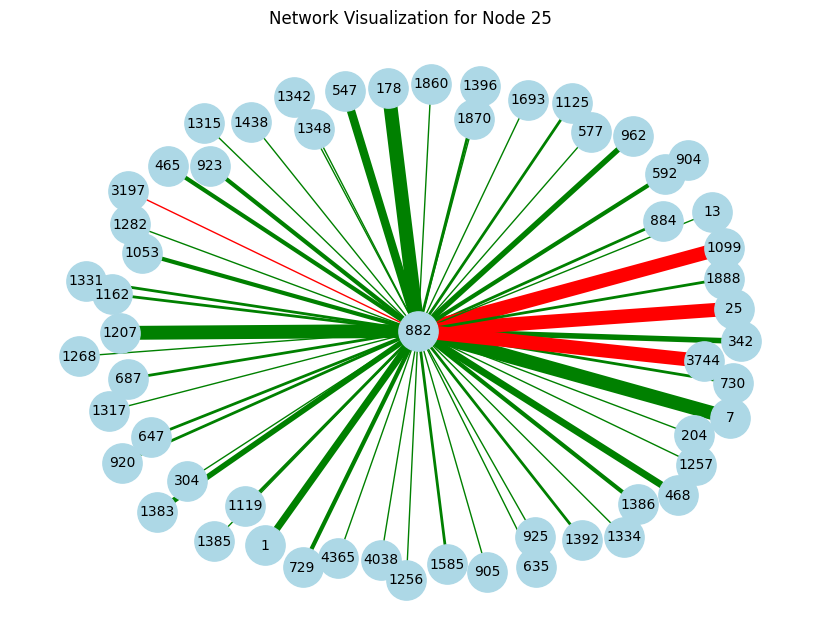

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges connected to node 25
subgraph_df = df[df['Source'] == 882]

# Create a directed graph
G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

# Assign edge colors and thickness based on the sign and magnitude of the rating
edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

# Plot the network
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # Layout for the nodes
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)
plt.title('Network Visualization for Node 25')
plt.show()


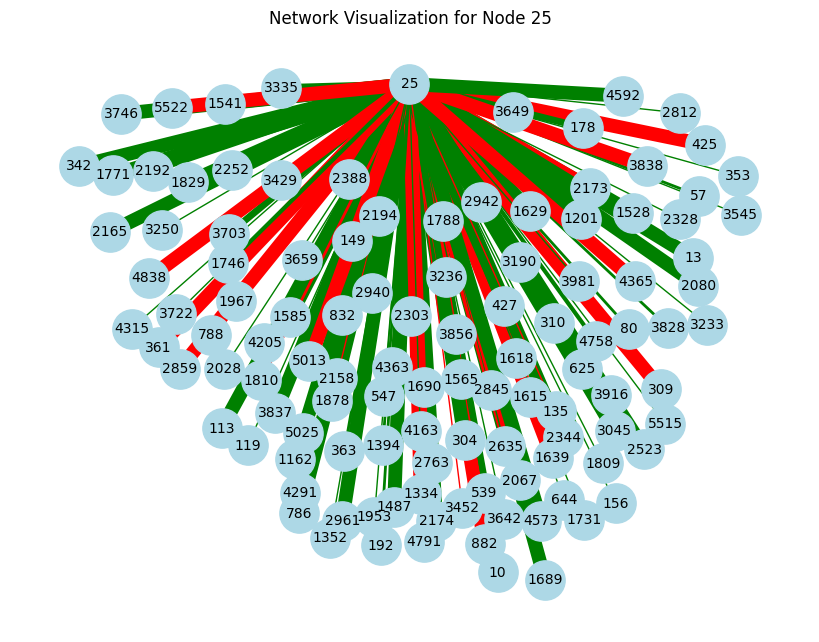

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges connected to node 25
subgraph_df = df[df['Target'] == 25]

# Create a directed graph
G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

# Assign edge colors and thickness based on the sign and magnitude of the rating
edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

# Plot the network
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # Layout for the nodes
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)
plt.title('Network Visualization for Node 25')
plt.show()

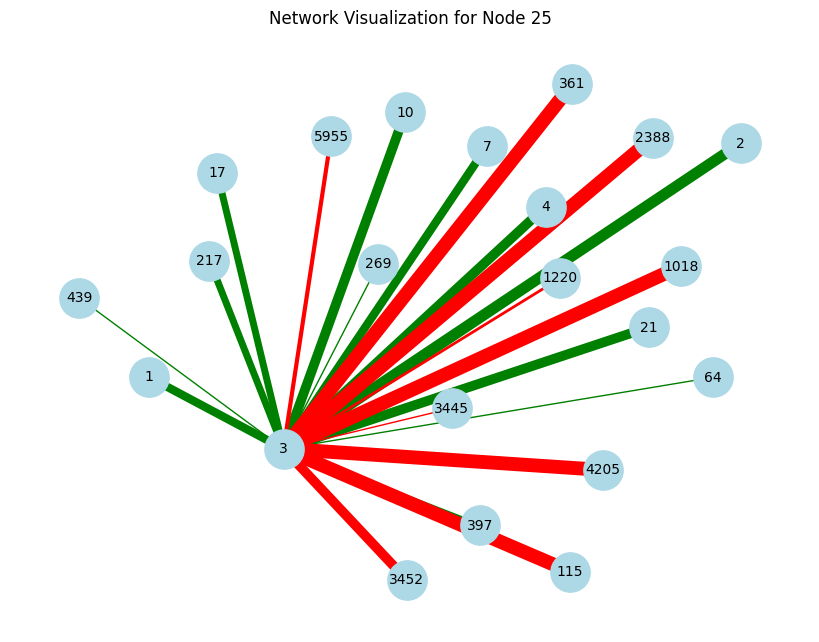

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges connected to node 25
subgraph_df = df[df['Target'] == 3]

# Create a directed graph
G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

# Assign edge colors and thickness based on the sign and magnitude of the rating
edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

# Plot the network
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # Layout for the nodes
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)
plt.title('Network Visualization for Node 25')
plt.show()

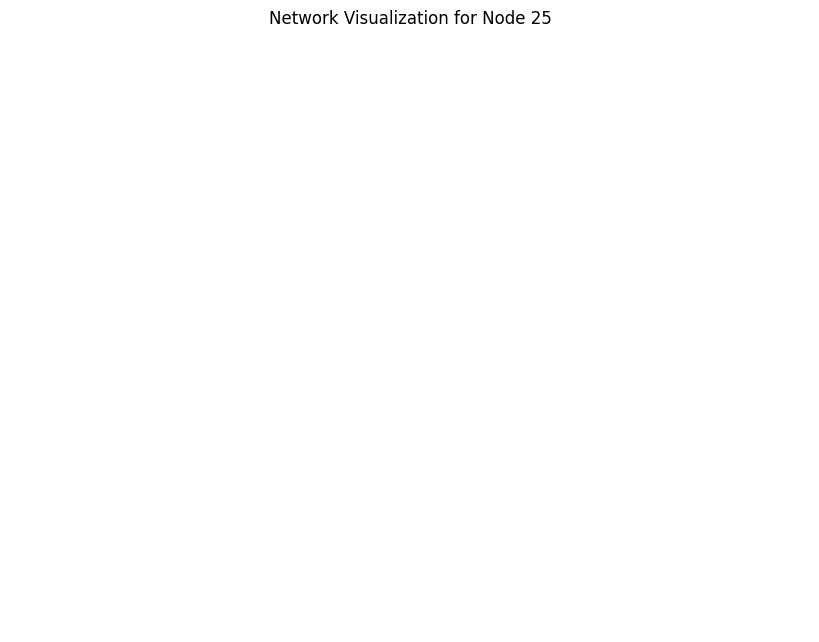

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Filter the original DataFrame to include only the edges connected to node 25
subgraph_df = df[df['Source'] == 3]

# Create a directed graph
G = nx.from_pandas_edgelist(subgraph_df, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

# Assign edge colors and thickness based on the sign and magnitude of the rating
edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

# Plot the network
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # Layout for the nodes
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)
plt.title('Network Visualization for Node 25')
plt.show()

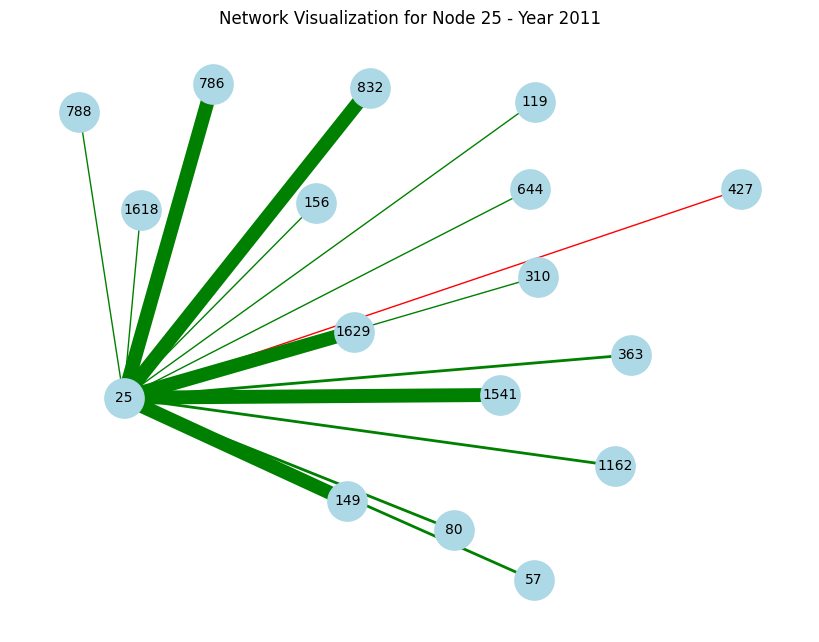

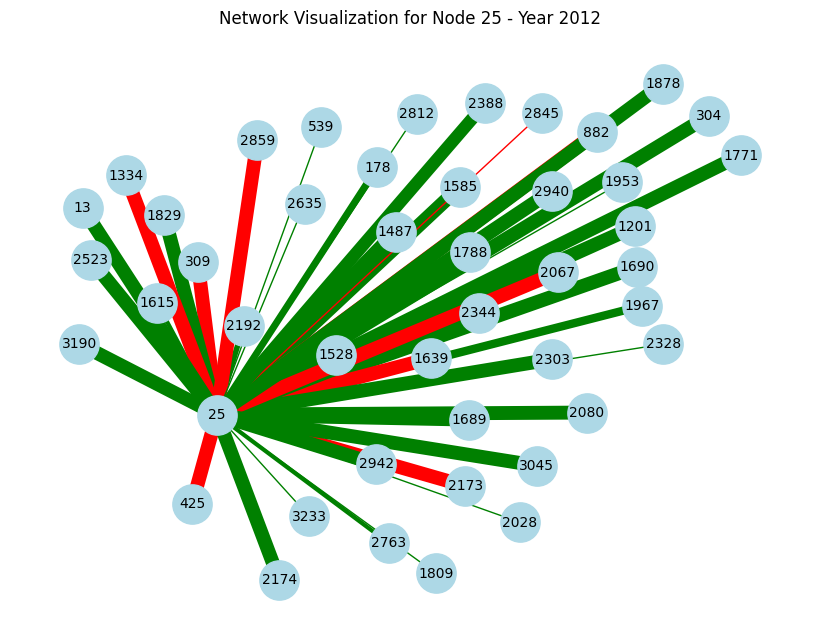

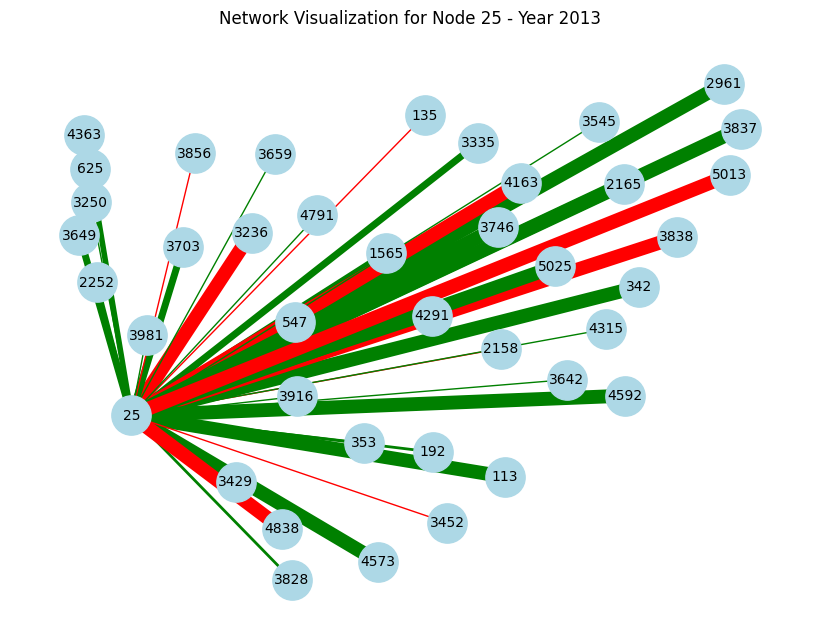

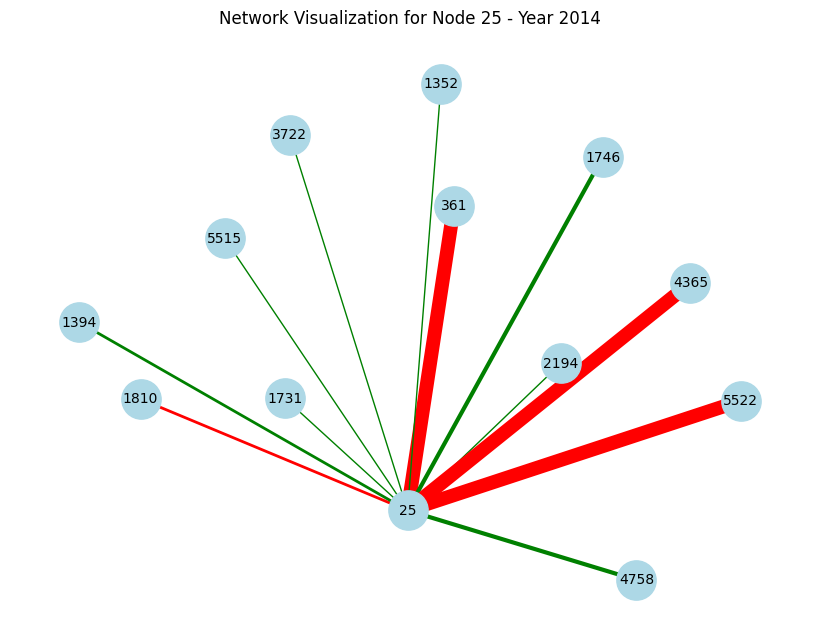

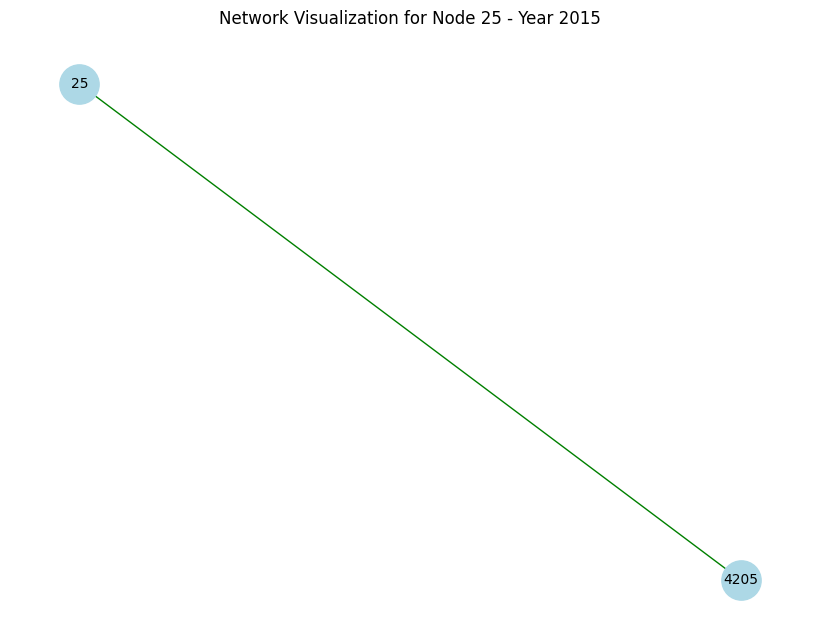

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 25) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)
    plt.title(f'Network Visualization for Node 25 - Year {year}')
    plt.show()


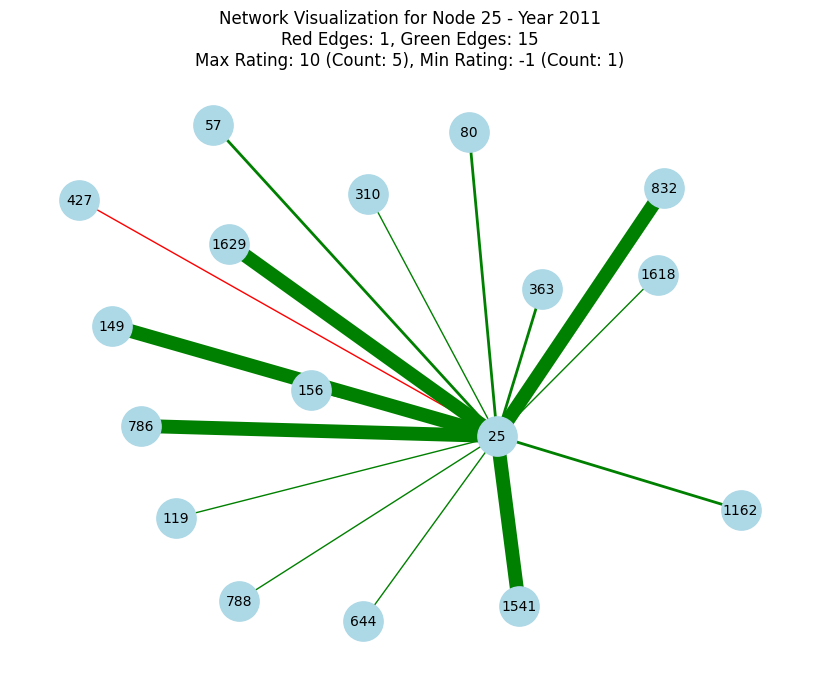

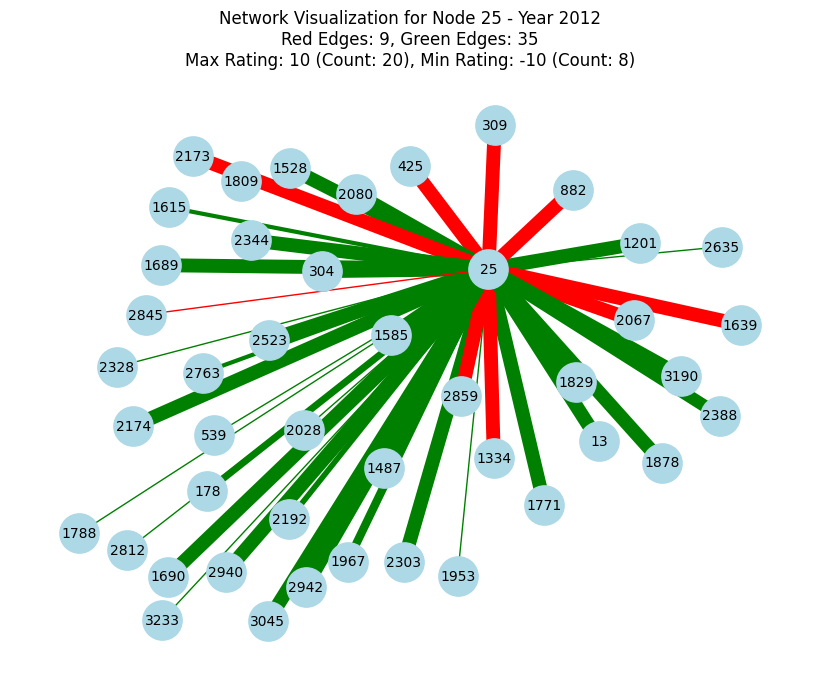

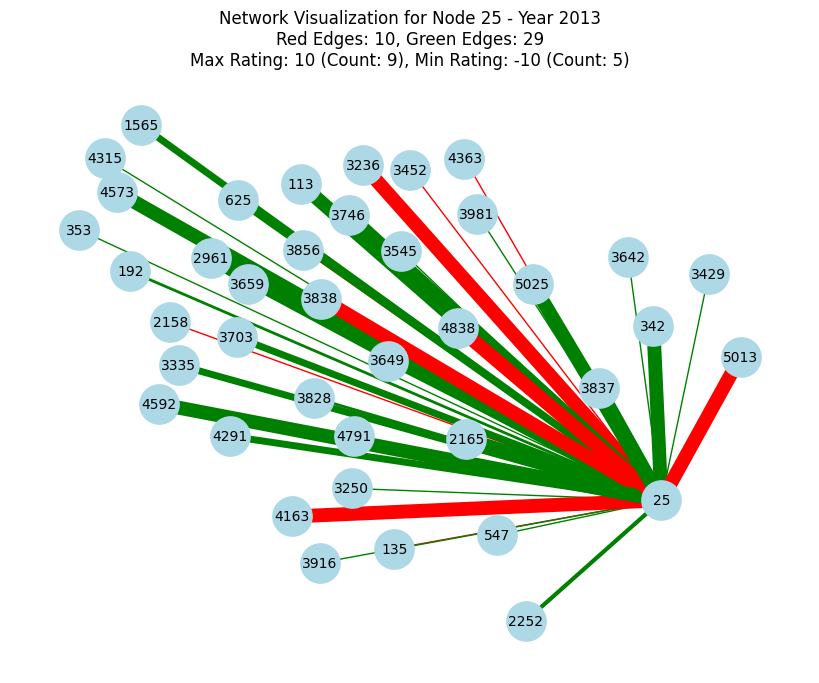

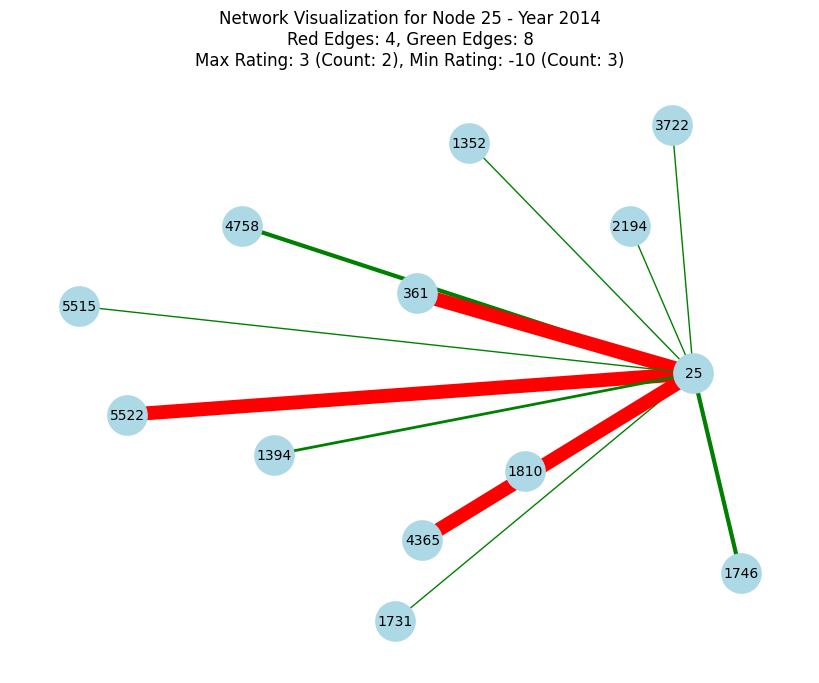

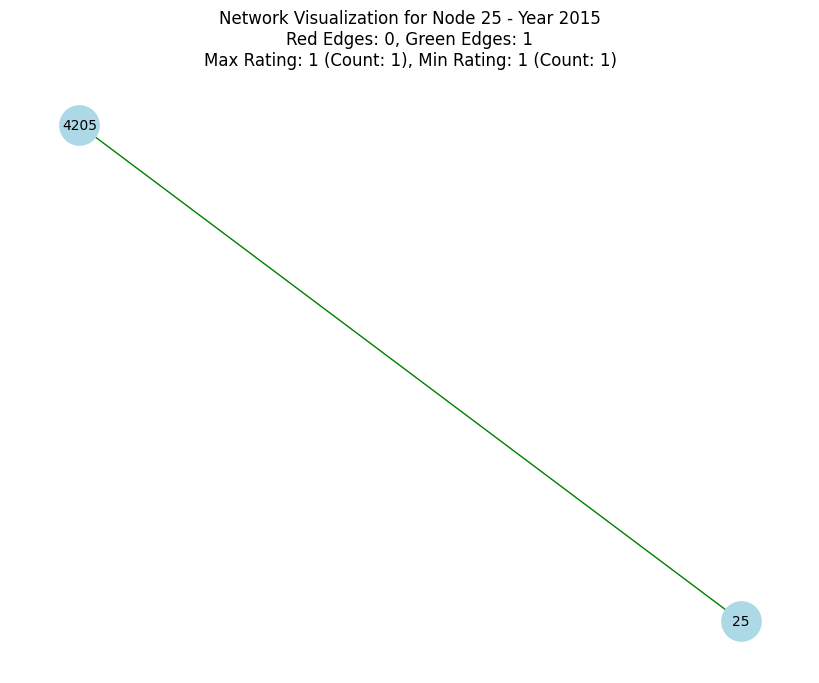

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 25) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Count red and green edges
    count_red_edges = edge_colors.count('red')
    count_green_edges = edge_colors.count('green')

    # Calculate the maximum and minimum ratings and their counts
    max_rating = subgraph_df_year['Rating'].max()
    min_rating = subgraph_df_year['Rating'].min()
    count_max_rating = (subgraph_df_year['Rating'] == max_rating).sum()
    count_min_rating = (subgraph_df_year['Rating'] == min_rating).sum()

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)

    # Add count of red and green edges, max and min ratings, and their counts to the title
    plt.title(f'Network Visualization for Node 25 - Year {year}\nRed Edges: {count_red_edges}, Green Edges: {count_green_edges}\nMax Rating: {max_rating} (Count: {count_max_rating}), Min Rating: {min_rating} (Count: {count_min_rating})')

    plt.show()


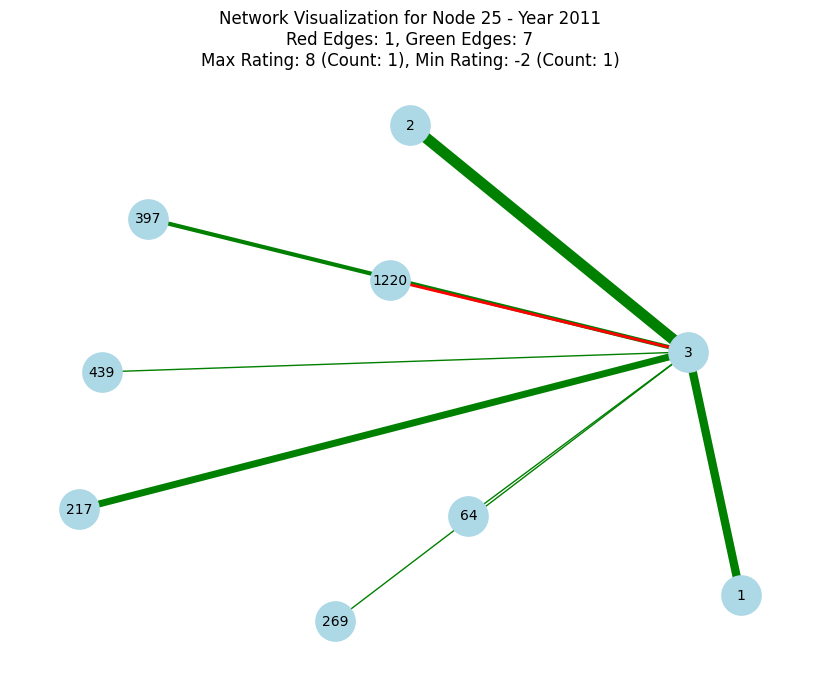

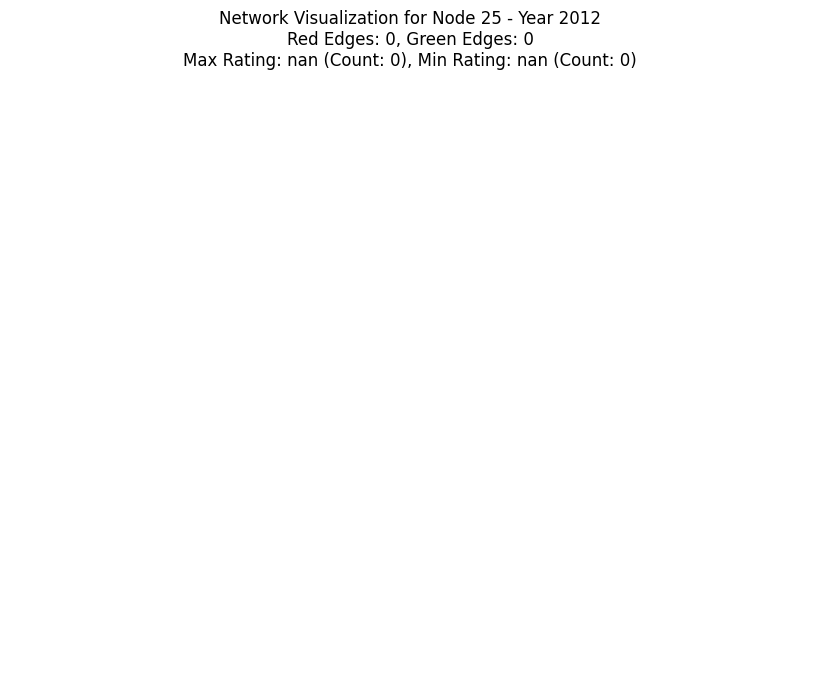

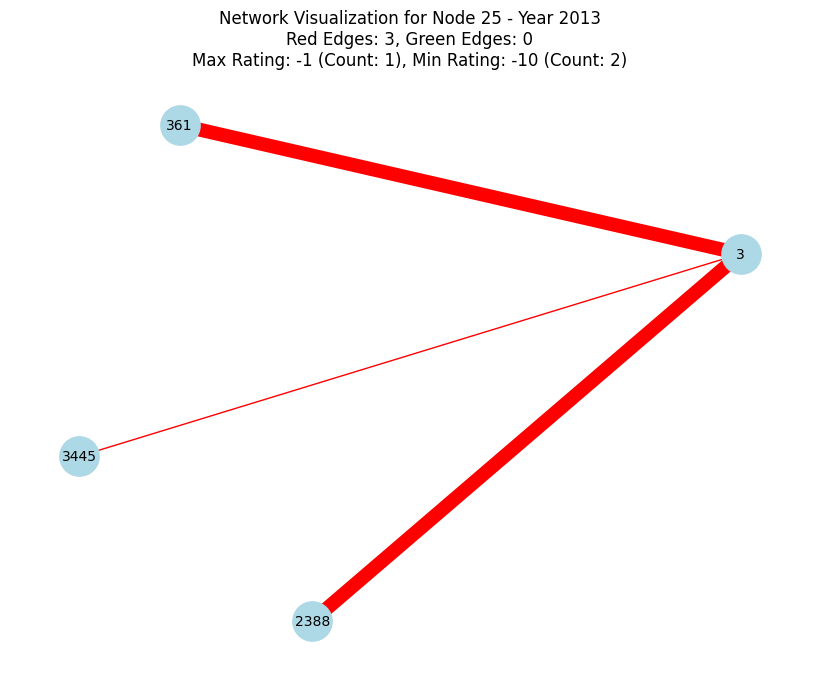

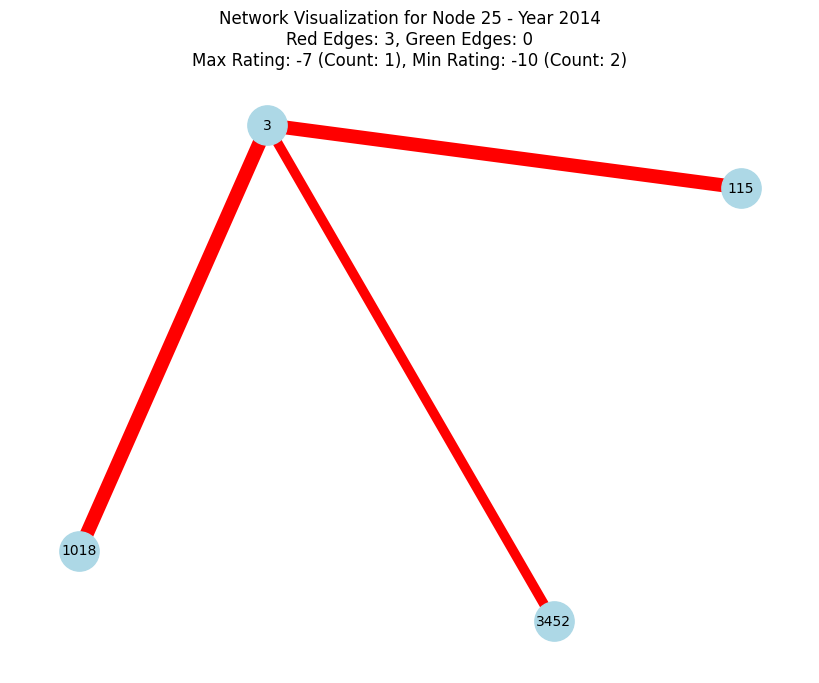

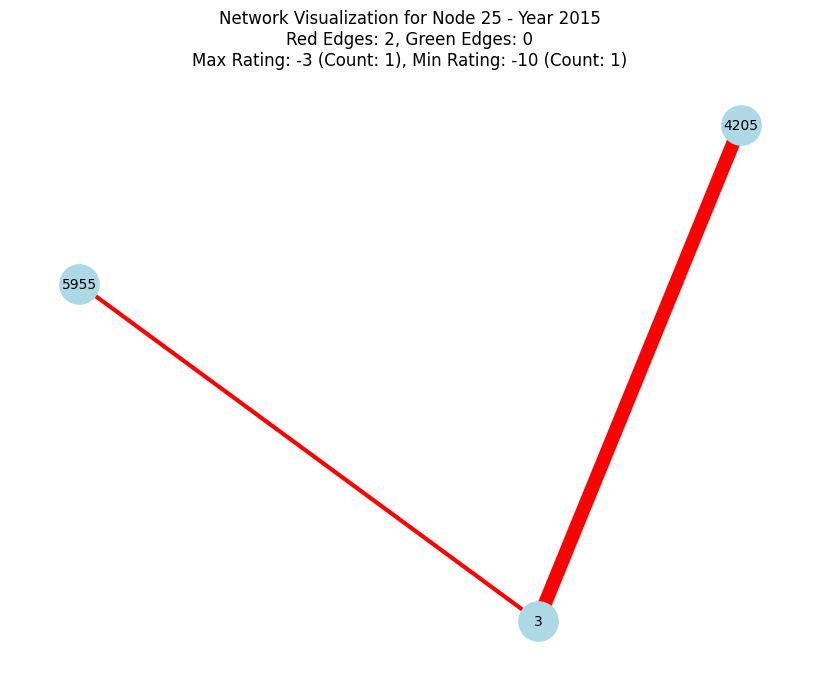

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 3) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Count red and green edges
    count_red_edges = edge_colors.count('red')
    count_green_edges = edge_colors.count('green')

    # Calculate the maximum and minimum ratings and their counts
    max_rating = subgraph_df_year['Rating'].max()
    min_rating = subgraph_df_year['Rating'].min()
    count_max_rating = (subgraph_df_year['Rating'] == max_rating).sum()
    count_min_rating = (subgraph_df_year['Rating'] == min_rating).sum()

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)

    # Add count of red and green edges, max and min ratings, and their counts to the title
    plt.title(f'Network Visualization for Node 25 - Year {year}\nRed Edges: {count_red_edges}, Green Edges: {count_green_edges}\nMax Rating: {max_rating} (Count: {count_max_rating}), Min Rating: {min_rating} (Count: {count_min_rating})')

    plt.show()


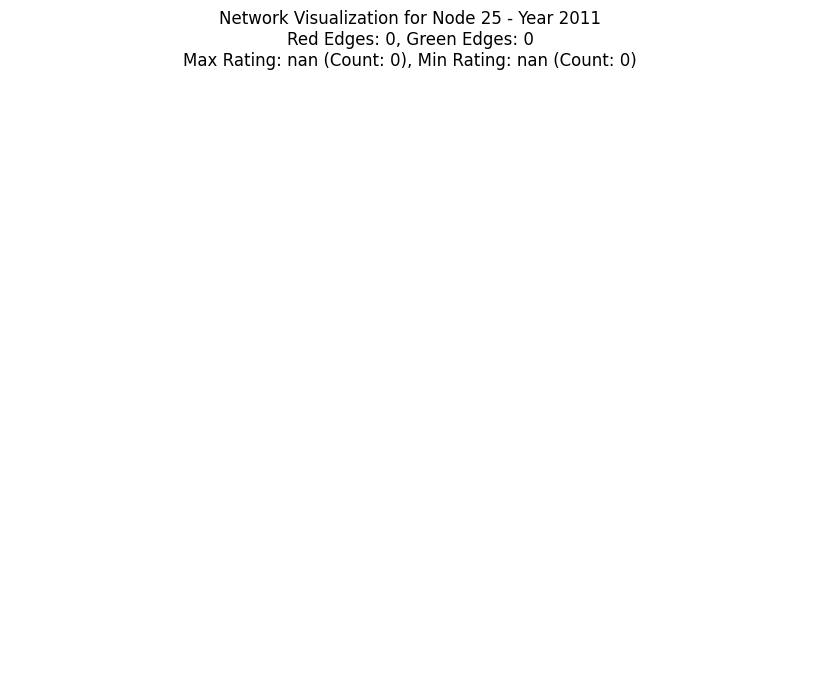

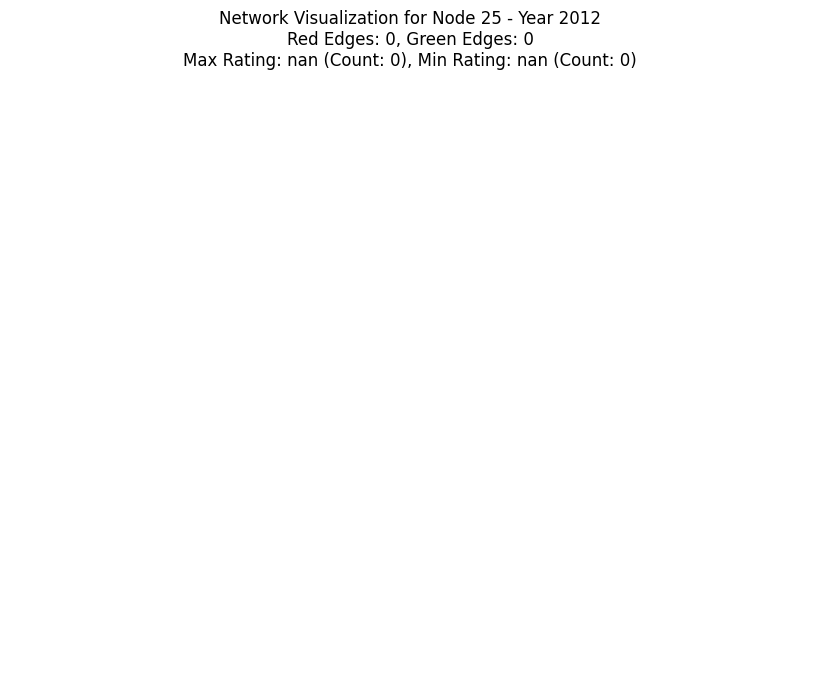

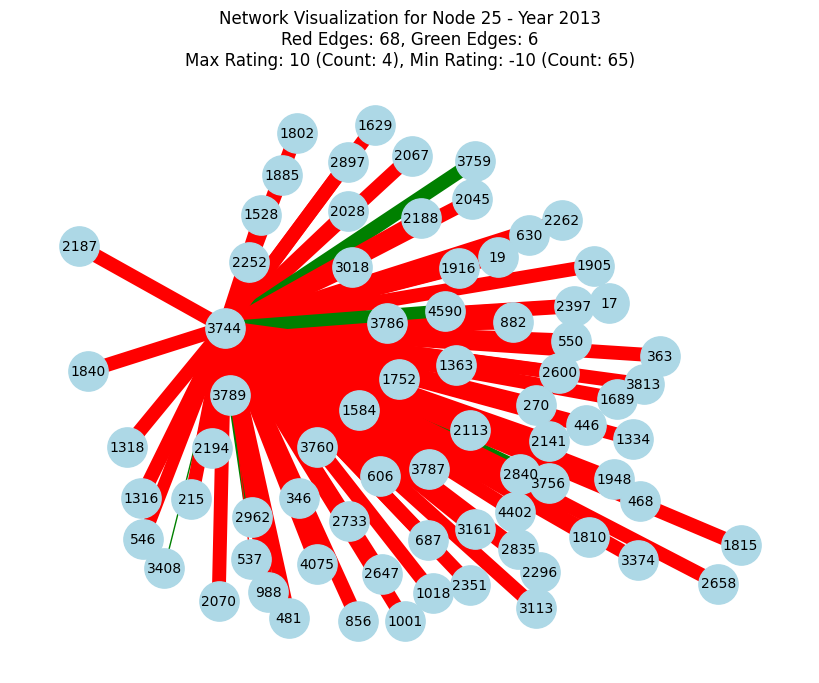

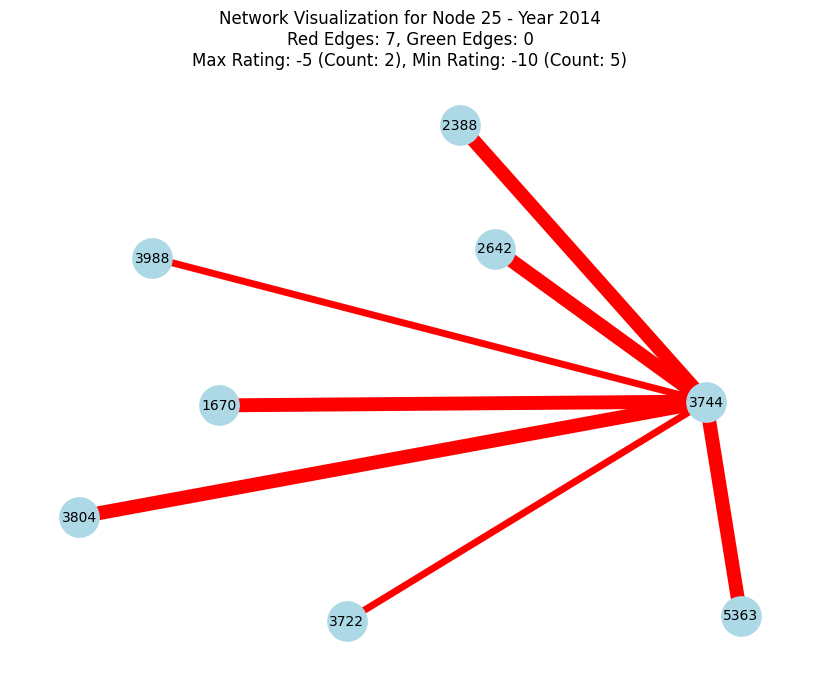

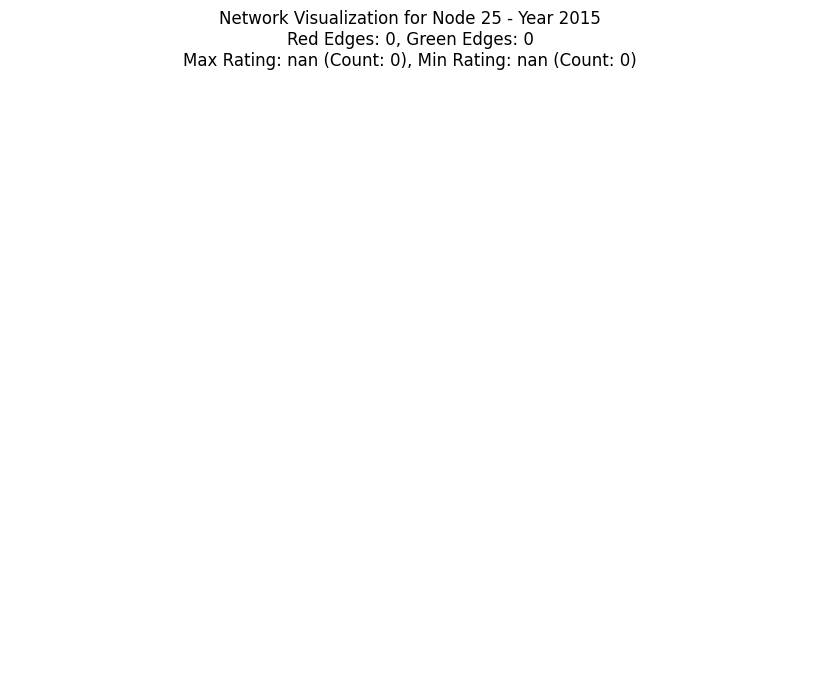

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 3744) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Count red and green edges
    count_red_edges = edge_colors.count('red')
    count_green_edges = edge_colors.count('green')

    # Calculate the maximum and minimum ratings and their counts
    max_rating = subgraph_df_year['Rating'].max()
    min_rating = subgraph_df_year['Rating'].min()
    count_max_rating = (subgraph_df_year['Rating'] == max_rating).sum()
    count_min_rating = (subgraph_df_year['Rating'] == min_rating).sum()

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)

    # Add count of red and green edges, max and min ratings, and their counts to the title
    plt.title(f'Network Visualization for Node 25 - Year {year}\nRed Edges: {count_red_edges}, Green Edges: {count_green_edges}\nMax Rating: {max_rating} (Count: {count_max_rating}), Min Rating: {min_rating} (Count: {count_min_rating})')

    plt.show()


In [ ]:
# Find the node with the maximum number of negative ratings
node_max_negative_ratings = count_rating_minus_10_per_node_minus_10.idxmax()
max_negative_ratings_count = count_rating_minus_10_per_node_minus_10.max()

# Find the node with the maximum number of positive ratings
node_max_positive_ratings = count_rating_10_per_node_10.idxmax()
max_positive_ratings_count = count_rating_10_per_node_10.max()

print("Node with maximum negative ratings (-10):", node_max_negative_ratings)
print("Maximum negative ratings count:", max_negative_ratings_count)

print("\nNode with maximum positive ratings (+10):", node_max_positive_ratings)
print("Maximum positive ratings count:", max_positive_ratings_count)


Node with maximum negative ratings (-10): 3744
Maximum negative ratings count: 70

Node with maximum positive ratings (+10): 25
Maximum positive ratings count: 35


In [ ]:
# Find the top 5 nodes with the maximum number of negative ratings
top_5_nodes_max_negative_ratings = count_rating_minus_10_per_node_minus_10.nlargest(5)
print("Top 5 nodes with maximum negative ratings (-10):")
print(top_5_nodes_max_negative_ratings)

# Find the top 5 nodes with the maximum number of positive ratings
top_5_nodes_max_positive_ratings = count_rating_10_per_node_10.nlargest(5)
print("\nTop 5 nodes with maximum positive ratings (+10):")
print(top_5_nodes_max_positive_ratings)


Top 5 nodes with maximum negative ratings (-10):
Target
3744    70
1383    30
2017    26
2498    24
4531    23
dtype: int64

Top 5 nodes with maximum positive ratings (+10):
Target
25      35
5729     4
1669     3
2305     3
2377     3
dtype: int64


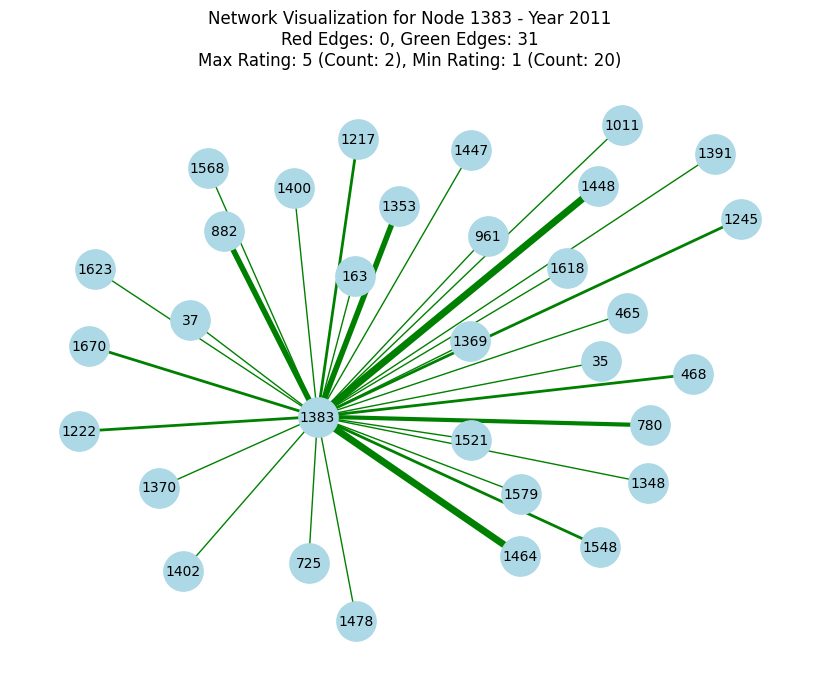

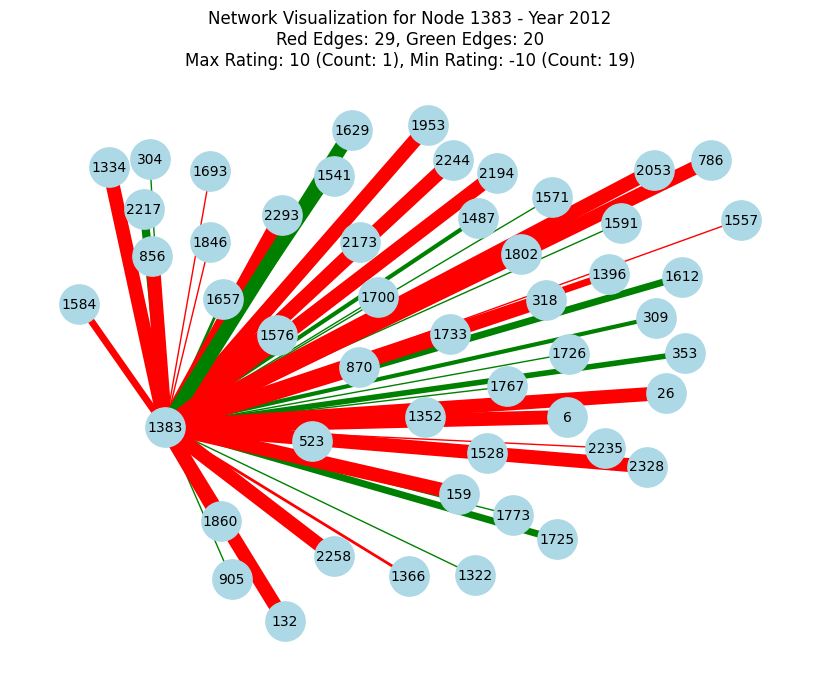

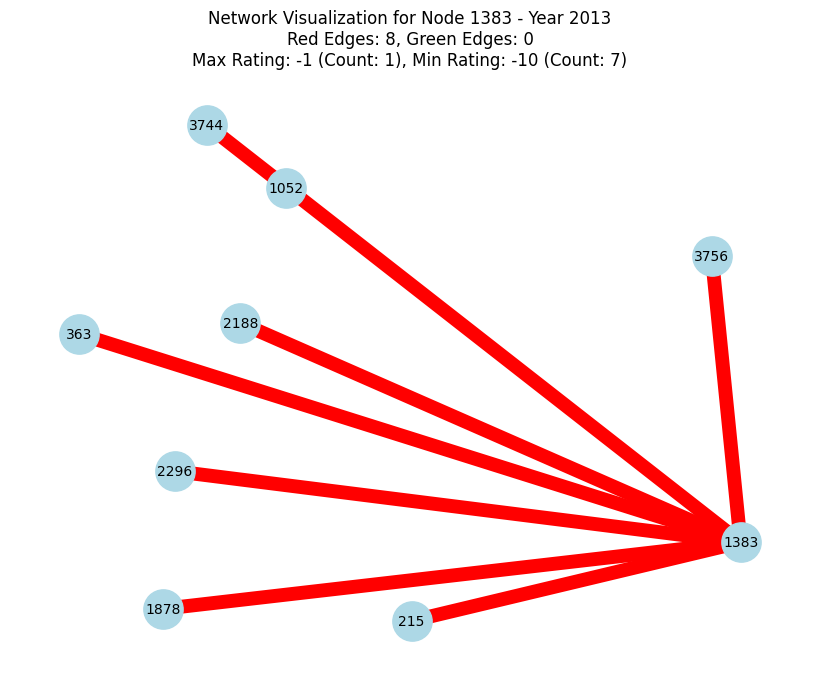

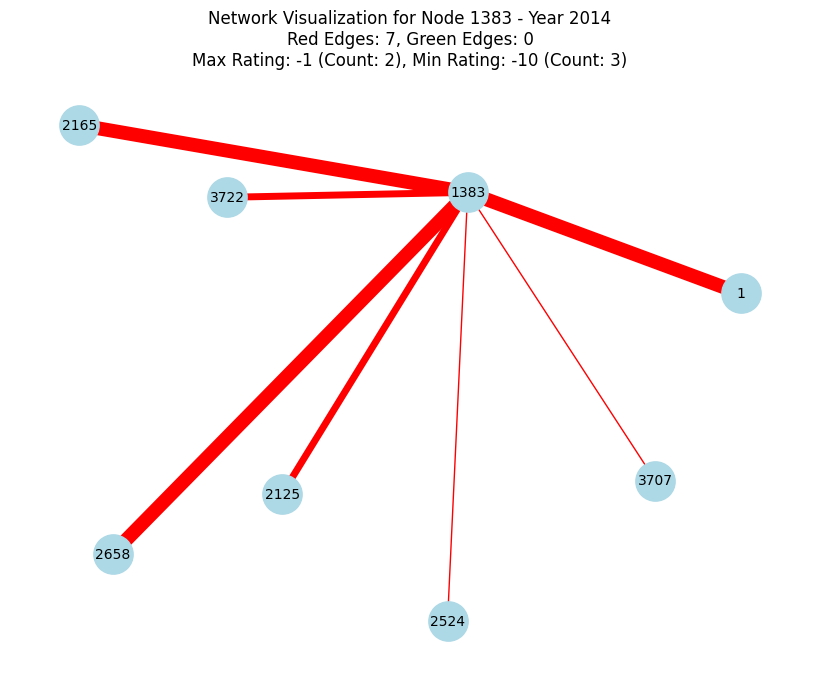

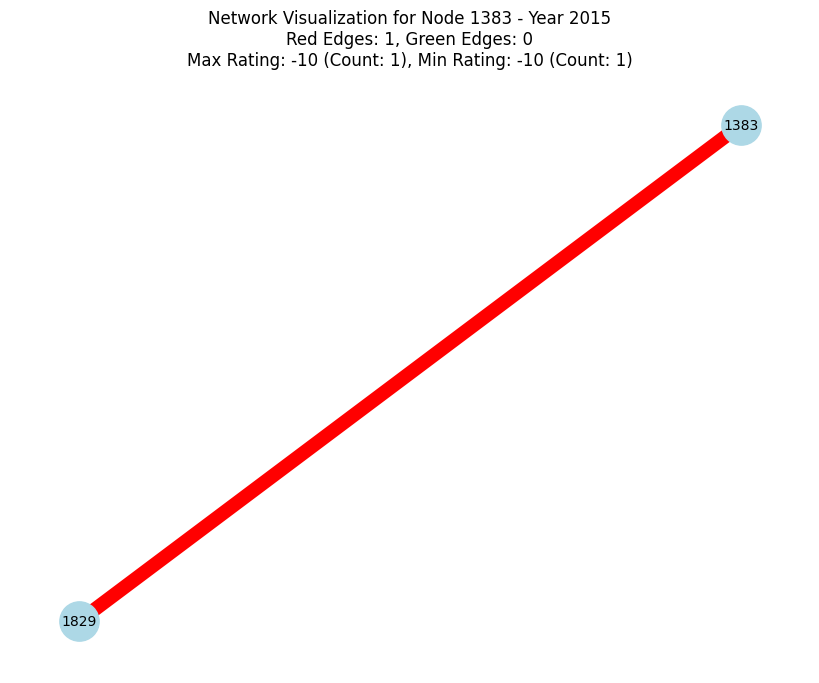

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 1383) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Count red and green edges
    count_red_edges = edge_colors.count('red')
    count_green_edges = edge_colors.count('green')

    # Calculate the maximum and minimum ratings and their counts
    max_rating = subgraph_df_year['Rating'].max()
    min_rating = subgraph_df_year['Rating'].min()
    count_max_rating = (subgraph_df_year['Rating'] == max_rating).sum()
    count_min_rating = (subgraph_df_year['Rating'] == min_rating).sum()

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)

    # Add count of red and green edges, max and min ratings, and their counts to the title
    plt.title(f'Network Visualization for Node 1383 - Year {year}\nRed Edges: {count_red_edges}, Green Edges: {count_green_edges}\nMax Rating: {max_rating} (Count: {count_max_rating}), Min Rating: {min_rating} (Count: {count_min_rating})')

    plt.show()


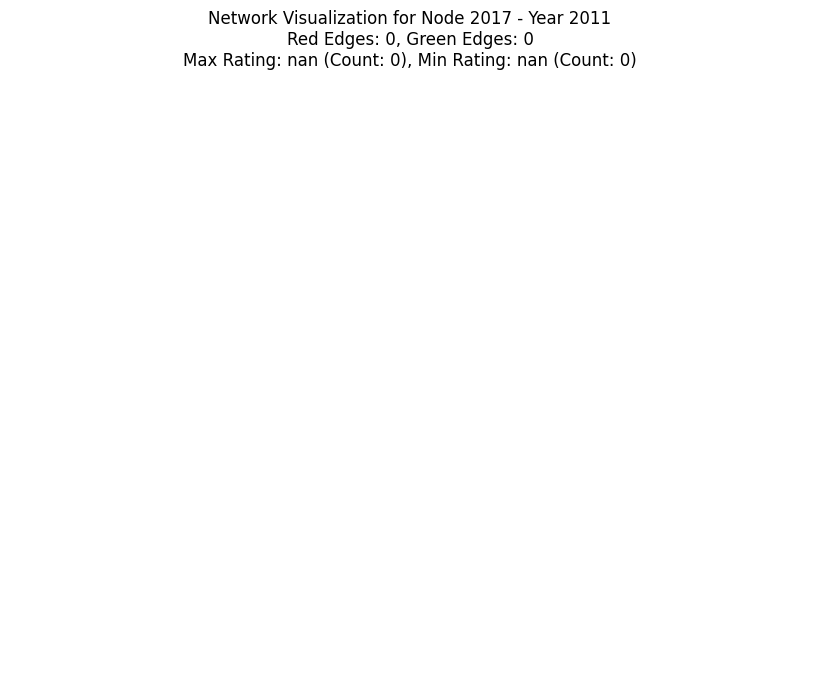

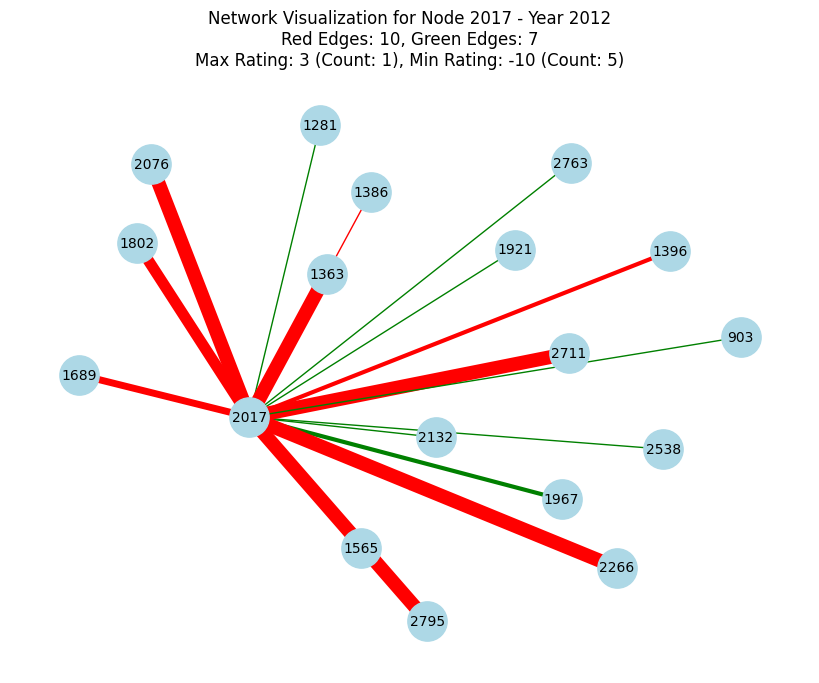

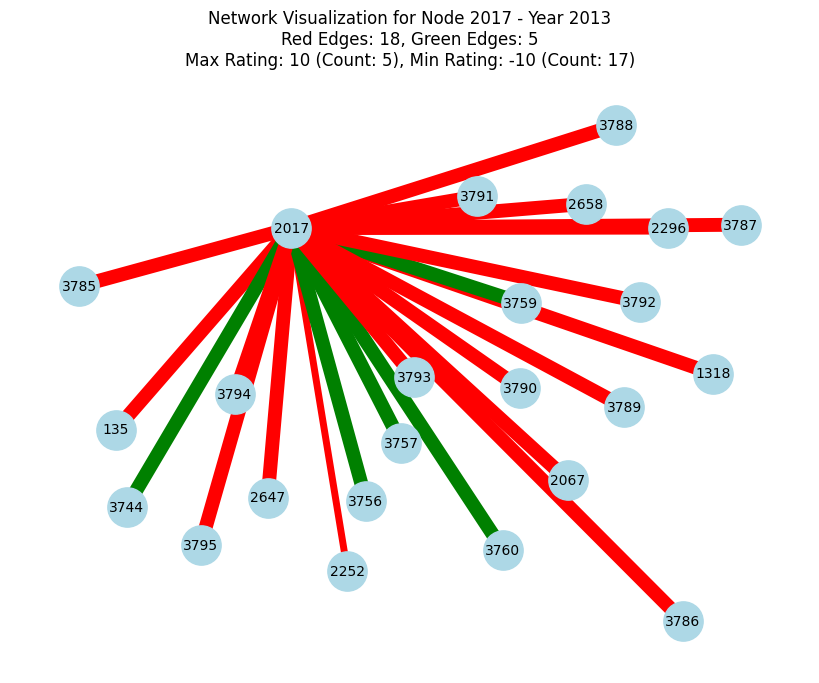

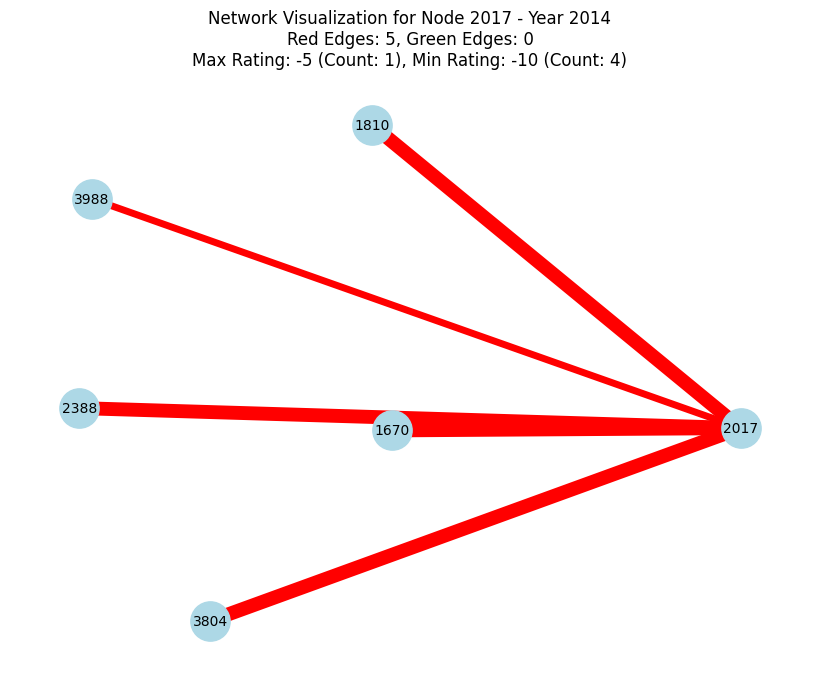

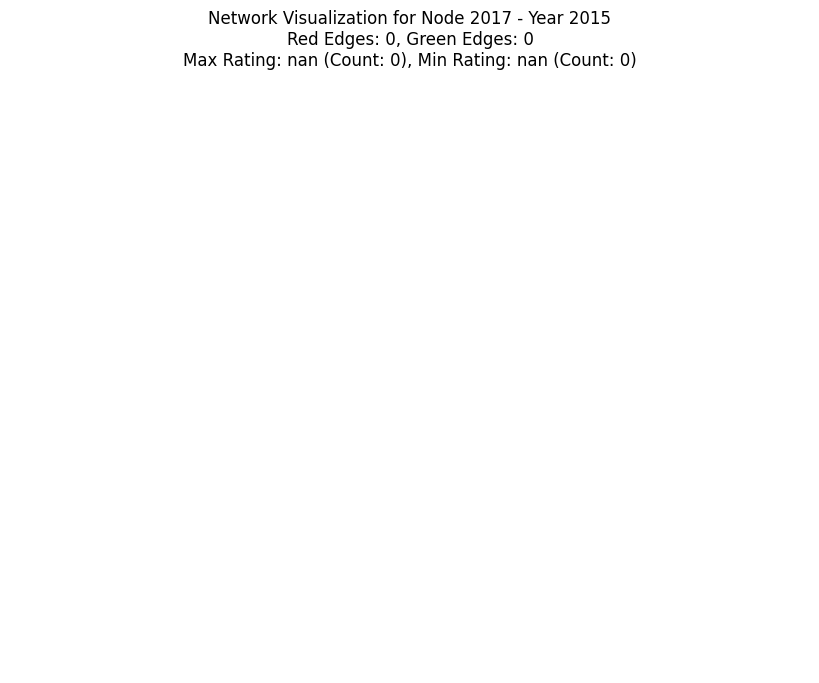

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 2017) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Count red and green edges
    count_red_edges = edge_colors.count('red')
    count_green_edges = edge_colors.count('green')

    # Calculate the maximum and minimum ratings and their counts
    max_rating = subgraph_df_year['Rating'].max()
    min_rating = subgraph_df_year['Rating'].min()
    count_max_rating = (subgraph_df_year['Rating'] == max_rating).sum()
    count_min_rating = (subgraph_df_year['Rating'] == min_rating).sum()

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)

    # Add count of red and green edges, max and min ratings, and their counts to the title
    plt.title(f'Network Visualization for Node 2017 - Year {year}\nRed Edges: {count_red_edges}, Green Edges: {count_green_edges}\nMax Rating: {max_rating} (Count: {count_max_rating}), Min Rating: {min_rating} (Count: {count_min_rating})')

    plt.show()


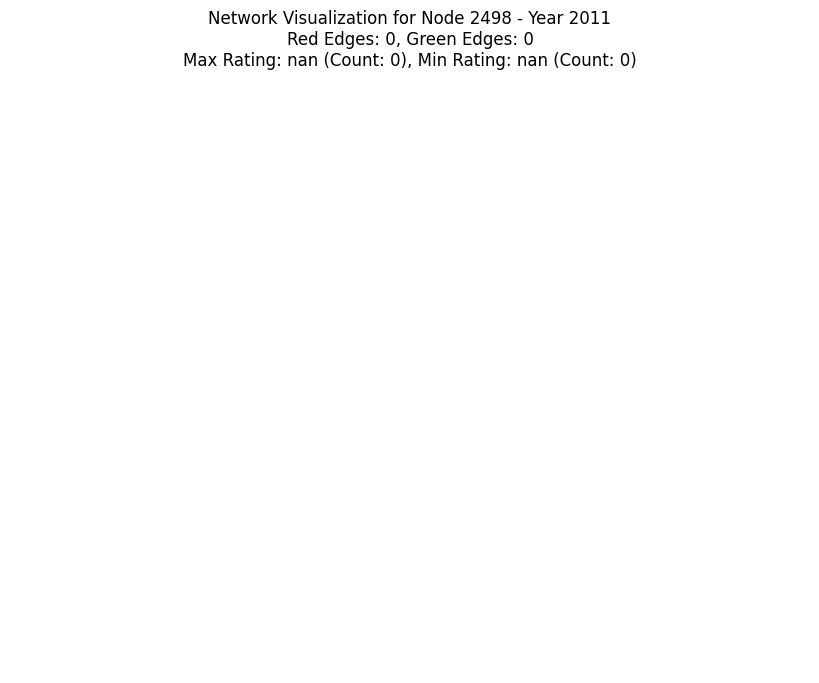

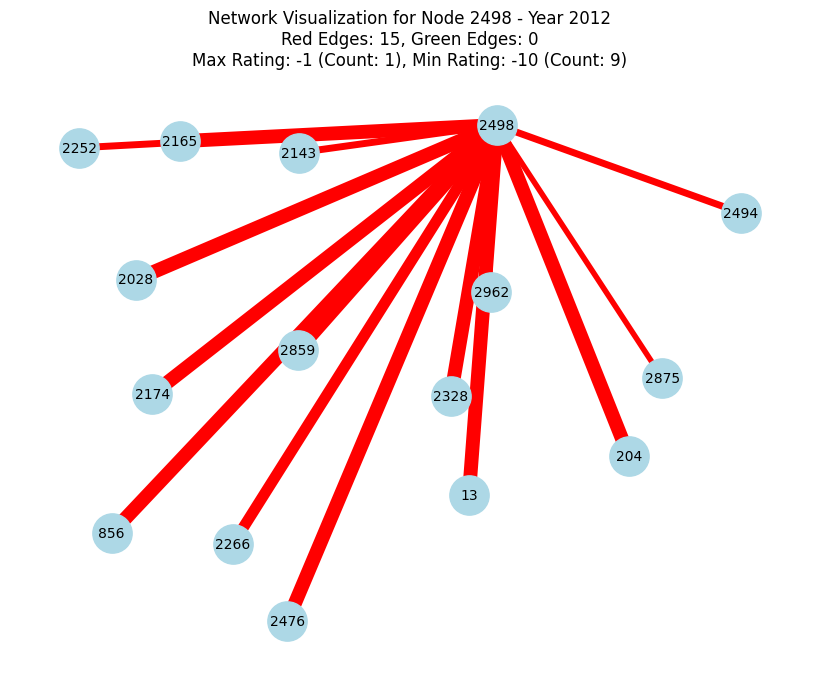

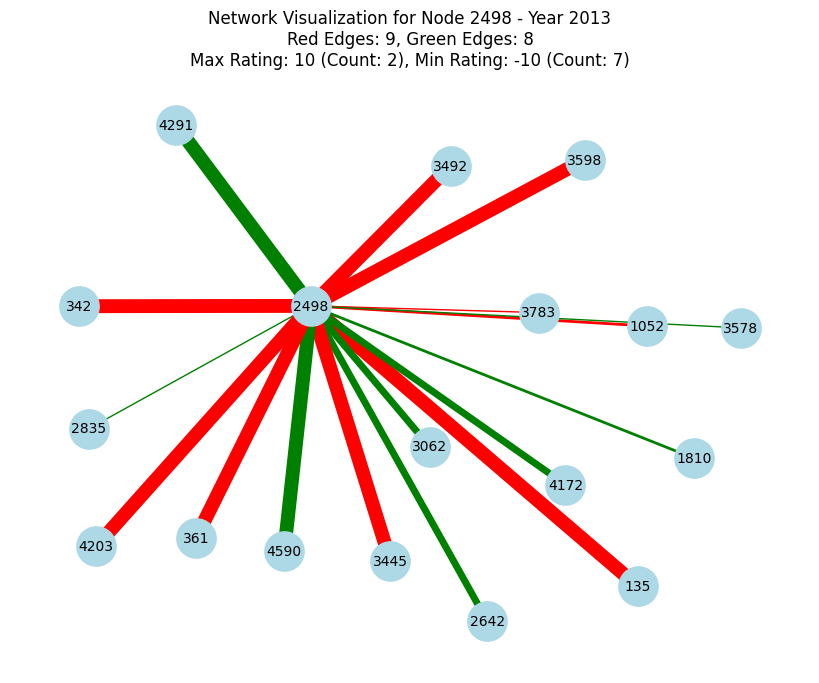

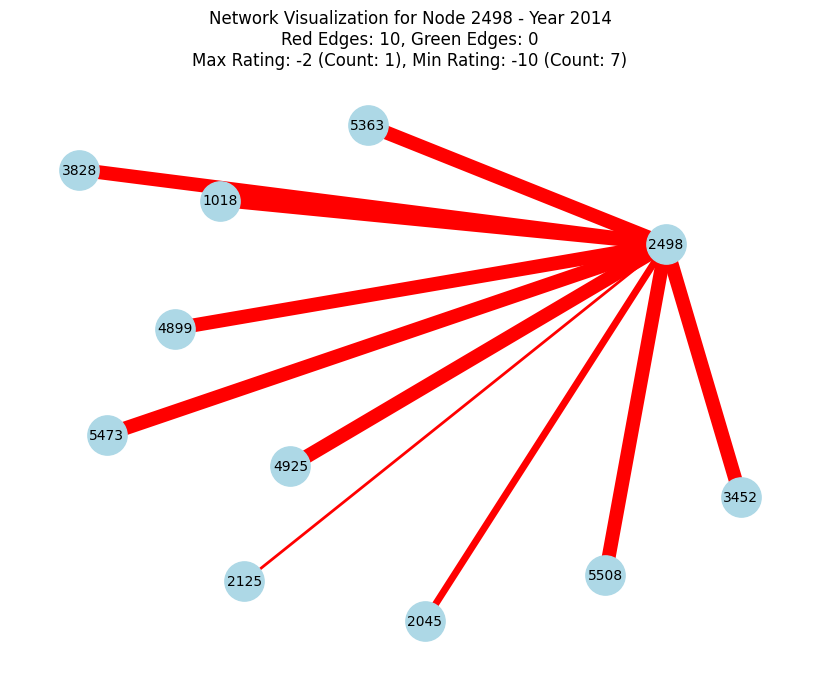

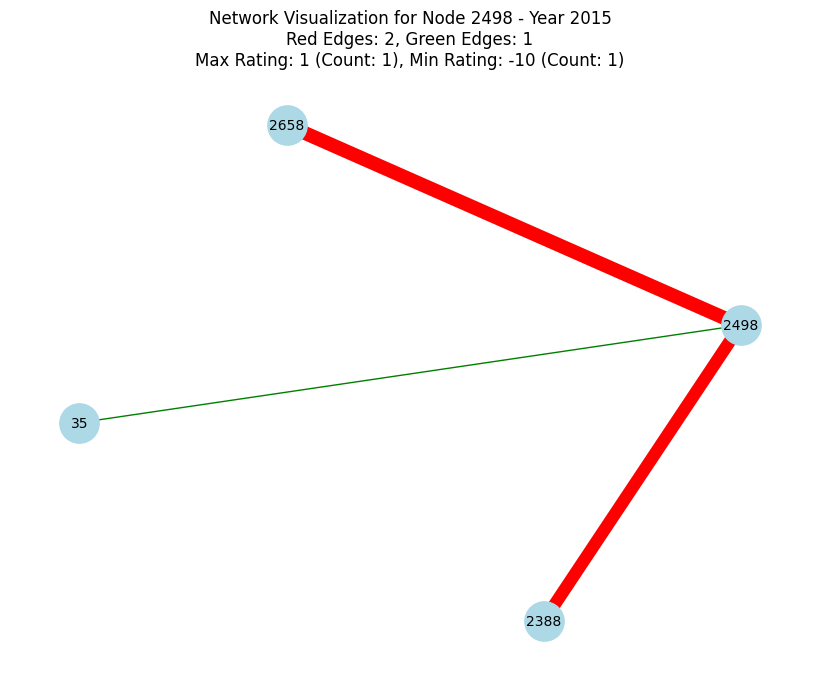

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 2498) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Count red and green edges
    count_red_edges = edge_colors.count('red')
    count_green_edges = edge_colors.count('green')

    # Calculate the maximum and minimum ratings and their counts
    max_rating = subgraph_df_year['Rating'].max()
    min_rating = subgraph_df_year['Rating'].min()
    count_max_rating = (subgraph_df_year['Rating'] == max_rating).sum()
    count_min_rating = (subgraph_df_year['Rating'] == min_rating).sum()

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)

    # Add count of red and green edges, max and min ratings, and their counts to the title
    plt.title(f'Network Visualization for Node 2498 - Year {year}\nRed Edges: {count_red_edges}, Green Edges: {count_green_edges}\nMax Rating: {max_rating} (Count: {count_max_rating}), Min Rating: {min_rating} (Count: {count_min_rating})')

    plt.show()


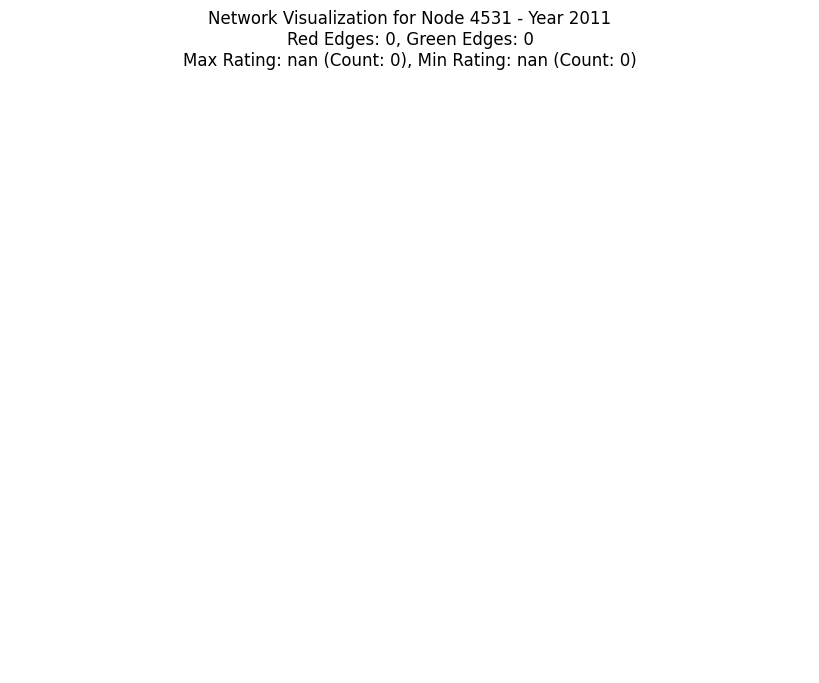

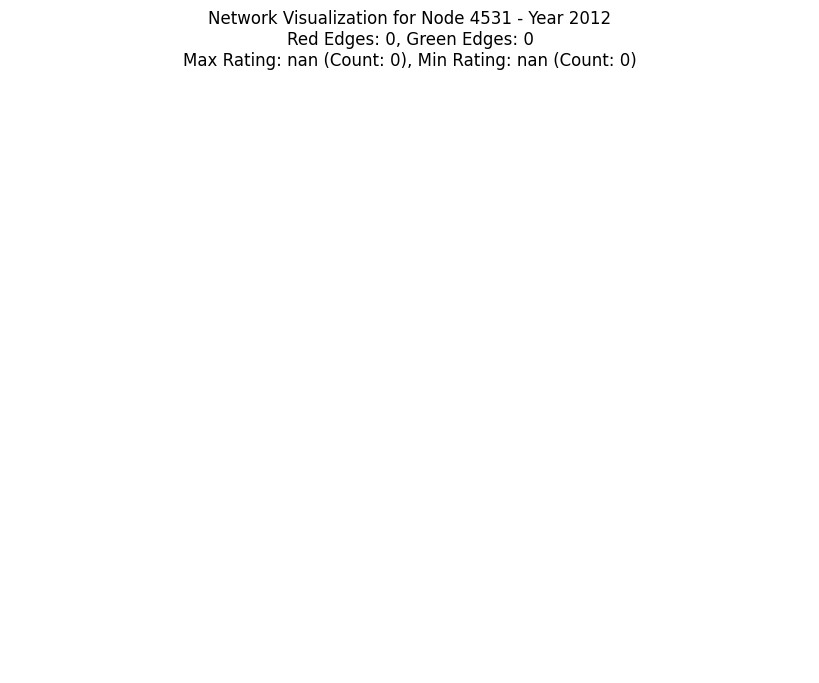

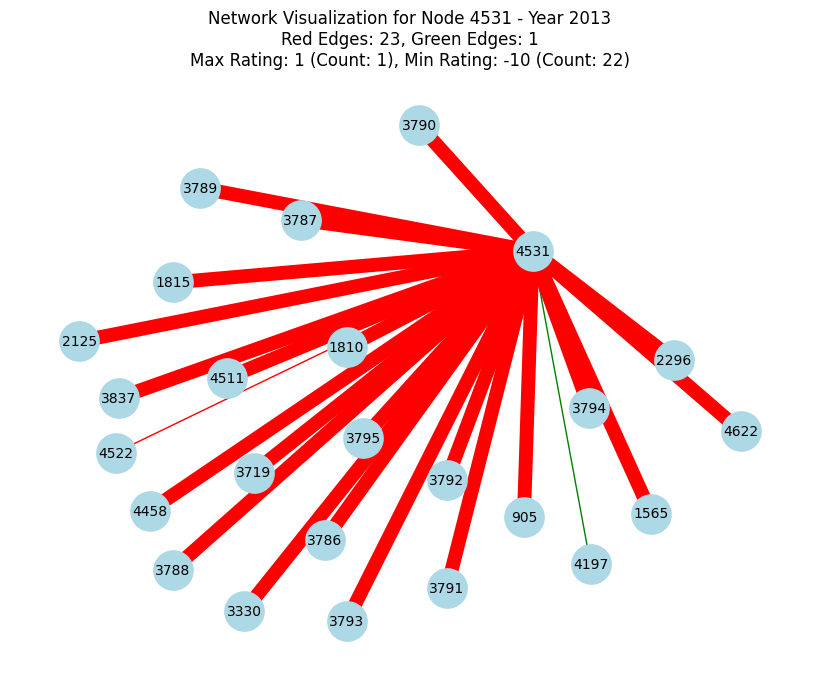

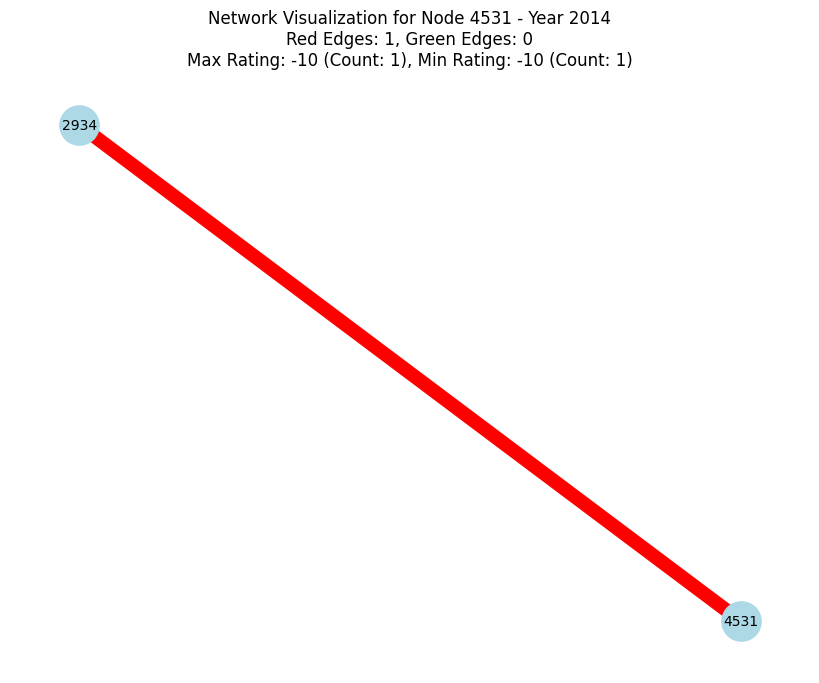

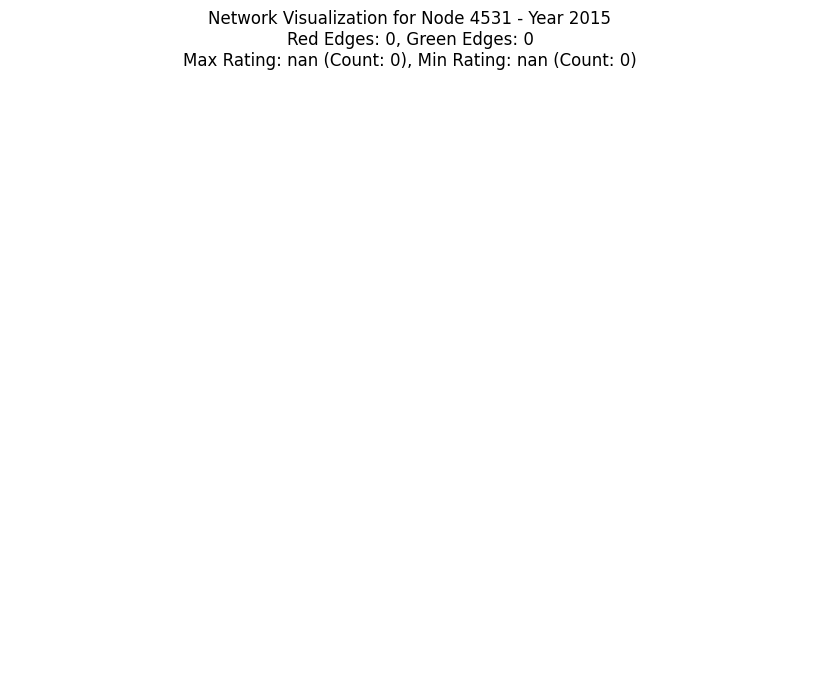

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 4531) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Count red and green edges
    count_red_edges = edge_colors.count('red')
    count_green_edges = edge_colors.count('green')

    # Calculate the maximum and minimum ratings and their counts
    max_rating = subgraph_df_year['Rating'].max()
    min_rating = subgraph_df_year['Rating'].min()
    count_max_rating = (subgraph_df_year['Rating'] == max_rating).sum()
    count_min_rating = (subgraph_df_year['Rating'] == min_rating).sum()

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)

    # Add count of red and green edges, max and min ratings, and their counts to the title
    plt.title(f'Network Visualization for Node 4531 - Year {year}\nRed Edges: {count_red_edges}, Green Edges: {count_green_edges}\nMax Rating: {max_rating} (Count: {count_max_rating}), Min Rating: {min_rating} (Count: {count_min_rating})')

    plt.show()


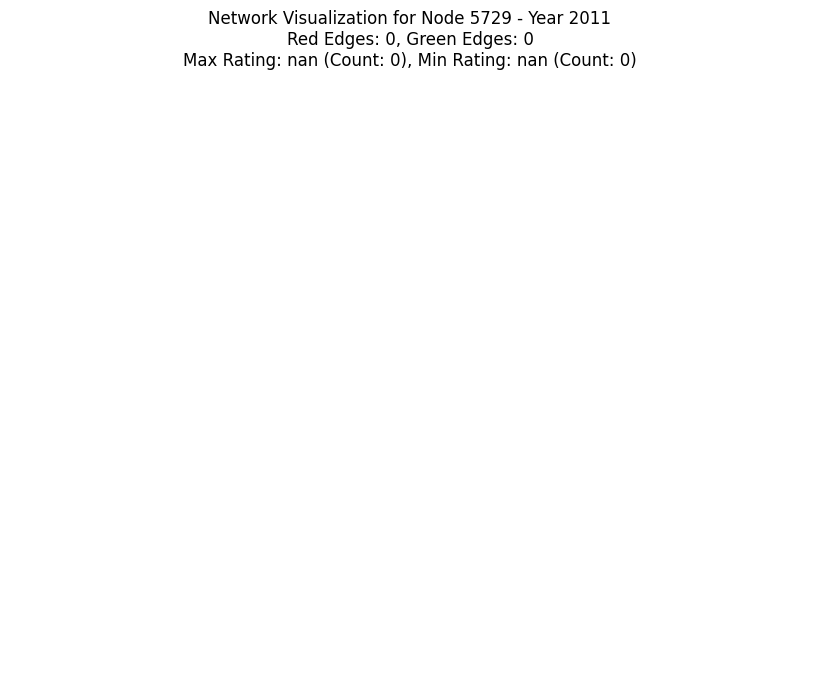

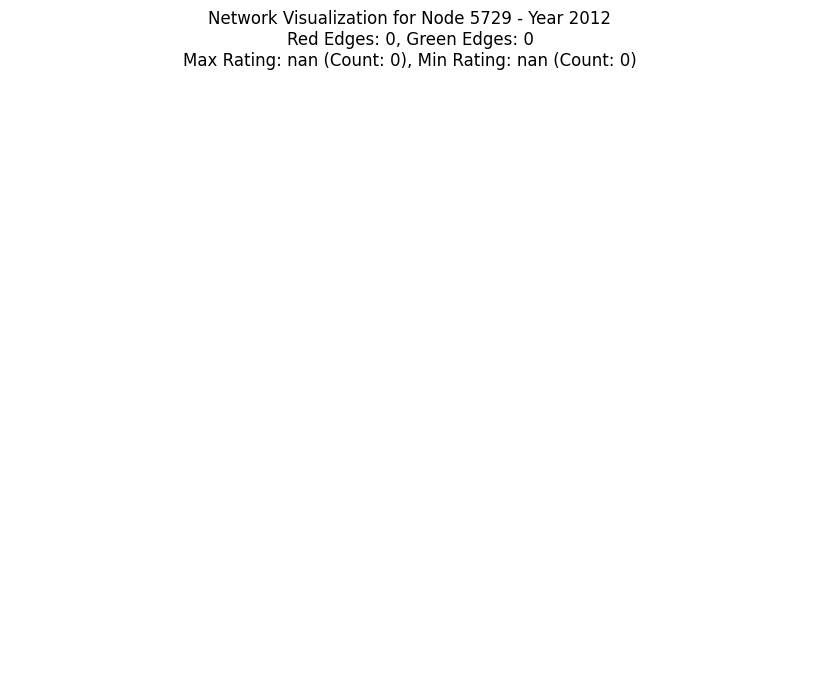

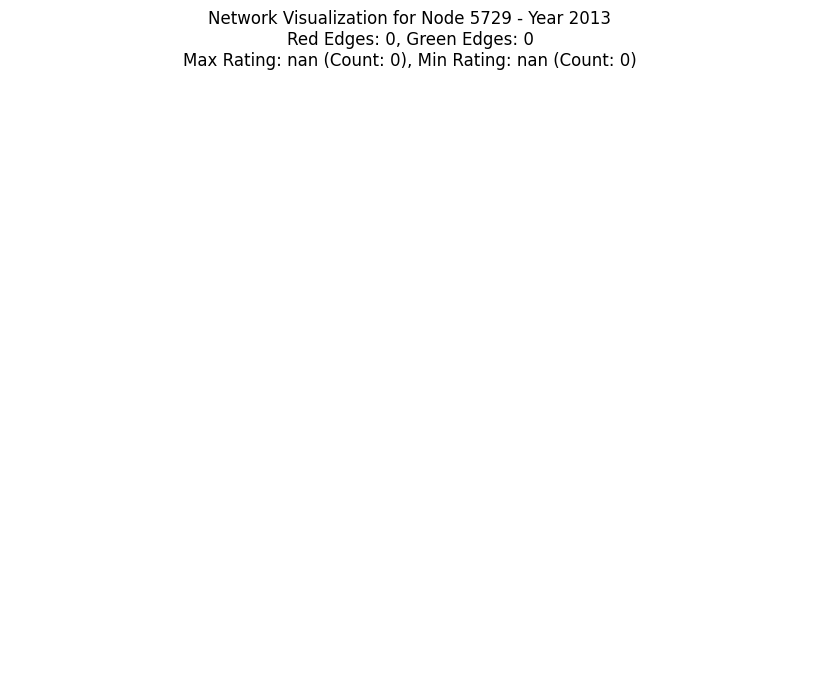

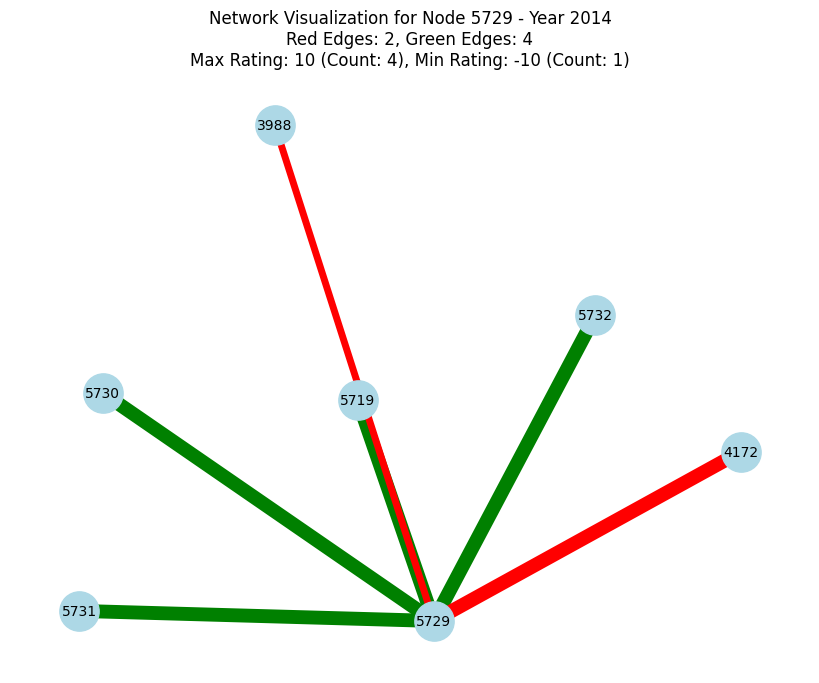

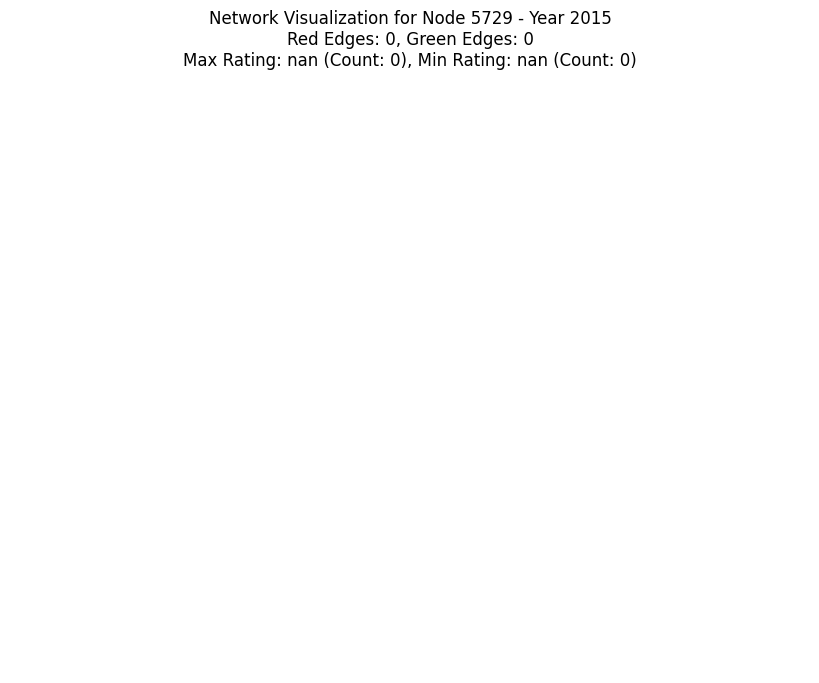

In [ ]:

import networkx as nx
import matplotlib.pyplot as plt

# Convert 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Plot the network for each year from 2011 to 2015
for year in range(2011, 2016):
    # Filter the DataFrame to include only the edges connected to node 25 for the current year
    subgraph_df_year = df[(df['Target'] == 5729) & (df['Time'].dt.year == year)]

    # Create a directed graph
    G = nx.from_pandas_edgelist(subgraph_df_year, 'Source', 'Target', 'Rating', create_using=nx.DiGraph())

    # Assign edge colors and thickness based on the sign and magnitude of the rating
    edge_colors = ['green' if r > 0 else 'red' for u, v, r in G.edges(data='Rating')]
    edge_widths = [abs(r) for u, v, r in G.edges(data='Rating')]

    # Count red and green edges
    count_red_edges = edge_colors.count('red')
    count_green_edges = edge_colors.count('green')

    # Calculate the maximum and minimum ratings and their counts
    max_rating = subgraph_df_year['Rating'].max()
    min_rating = subgraph_df_year['Rating'].min()
    count_max_rating = (subgraph_df_year['Rating'] == max_rating).sum()
    count_min_rating = (subgraph_df_year['Rating'] == min_rating).sum()

    # Plot the network for the current year
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Layout for the nodes
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, edge_color=edge_colors, width=edge_widths, arrows=False)

    # Add count of red and green edges, max and min ratings, and their counts to the title
    plt.title(f'Network Visualization for Node 5729 - Year {year}\nRed Edges: {count_red_edges}, Green Edges: {count_green_edges}\nMax Rating: {max_rating} (Count: {count_max_rating}), Min Rating: {min_rating} (Count: {count_min_rating})')

    plt.show()


In [ ]:
# Create a list of top 5 nodes for both negative and positive ratings
top_5_nodes_negative_ratings = [3744, 1383, 2017, 2498, 4531]
top_5_nodes_positive_ratings = [25, 5729, 1669, 2305, 2377]

# Iterate through each top node and check if it exists in the graph
for node in top_5_nodes_negative_ratings + top_5_nodes_positive_ratings:
    if G.has_node(node):
        print(f"Node {node} exists in the graph.")
    else:
        print(f"Node {node} does not exist in the graph.")


Node 3744 exists in the graph.
Node 1383 exists in the graph.
Node 2017 exists in the graph.
Node 2498 exists in the graph.
Node 4531 exists in the graph.
Node 25 exists in the graph.
Node 5729 exists in the graph.
Node 1669 exists in the graph.
Node 2305 exists in the graph.
Node 2377 exists in the graph.


In [ ]:
# Create a directed graph
G = nx.DiGraph()

# Add nodes and edges from the DataFrame
for index, row in df.iterrows():
    G.add_edge(row['Source'], row['Target'], weight=row['Rating'])




In [ ]:
# Create a directed graph
G = nx.DiGraph()

# Add nodes and edges from the DataFrame
for index, row in df.iterrows():
    G.add_edge(row['Source'], row['Target'], weight=row['Rating'])

# Add 'Ratings' attribute to each node based on the edge weights
for node in G.nodes():
    # Calculate the average rating received by the node based on its incoming edges
    # If the node has no incoming edges, set the rating to None
    ratings = [G.edges[edge]['weight'] for edge in G.in_edges(node)]
    if ratings:
        average_rating = sum(ratings) / len(ratings)
    else:
        average_rating = None
    G.nodes[node]['Ratings'] = average_rating


In [ ]:
import networkx as nx

# Define a function to calculate homophily
def calculate_homophily(G):
    # Get the total number of edges in the graph
    total_edges = G.number_of_edges()

    # Check if there are any edges in the graph
    if total_edges == 0:
        return 0.0  # Return 0 if there are no edges

    # Get the number of edges between nodes with the same attribute value
    same_attribute_edges = sum(1 for u, v in G.edges() if G.nodes[u]['Ratings'] == G.nodes[v]['Ratings'])

    # Calculate homophily
    homophily = same_attribute_edges / total_edges
    return homophily

# Create a directed graph
G = nx.DiGraph()

# Add nodes and edges from the DataFrame
for index, row in df.iterrows():
    G.add_edge(row['Source'], row['Target'], weight=row['Rating'])

# Add 'Ratings' attribute to each node based on the edge weights
for node in G.nodes():
    # Calculate the average rating received by the node based on its incoming edges
    # If the node has no incoming edges, set the rating to None
    ratings = [G.edges[edge]['weight'] for edge in G.in_edges(node)]
    if ratings:
        average_rating = sum(ratings) / len(ratings)
    else:
        average_rating = None
    G.nodes[node]['Ratings'] = average_rating

# Extract subgraphs for nodes 25 and 3744
subgraph_25 = nx.subgraph(G, [25] + list(G.neighbors(25)))
subgraph_3744 = nx.subgraph(G, [3744] + list(G.neighbors(3744)))
subgraph_25 = nx.subgraph(G, [25] + list(G.neighbors(25)))
subgraph_3744 = nx.subgraph(G, [3744] + list(G.neighbors(3744)))
subgraph_25 = nx.subgraph(G, [25] + list(G.neighbors(25)))
subgraph_3744 = nx.subgraph(G, [3744] + list(G.neighbors(3744)))
# Calculate homophily for each subgraph
homophily_25 = calculate_homophily(subgraph_25)
homophily_3744 = calculate_homophily(subgraph_3744)

print("Homophily for network containing node 25:", homophily_25)
print("Homophily for network containing node 3744:", homophily_3744)


Homophily for network containing node 25: 0.0
Homophily for network containing node 3744: 0.011049723756906077


In [ ]:
import networkx as nx

# Define a function to calculate homophily
def calculate_homophily(G):
    # Get the total number of edges in the graph
    total_edges = G.number_of_edges()

    # Check if there are any edges in the graph
    if total_edges == 0:
        return 0.0  # Return 0 if there are no edges

    # Get the number of edges between nodes with the same attribute value
    same_attribute_edges = sum(1 for u, v in G.edges() if G.nodes[u]['Ratings'] == G.nodes[v]['Ratings'])

    # Calculate homophily
    homophily = same_attribute_edges / total_edges
    return homophily

# Create a directed graph
G = nx.DiGraph()

# Add nodes and edges from the DataFrame
for index, row in df.iterrows():
    G.add_edge(row['Source'], row['Target'], weight=row['Rating'])

# Add 'Ratings' attribute to each node based on the edge weights
for node in G.nodes():
    # Calculate the average rating received by the node based on its incoming edges
    # If the node has no incoming edges, set the rating to None
    ratings = [G.edges[edge]['weight'] for edge in G.in_edges(node)]
    if ratings:
        average_rating = sum(ratings) / len(ratings)
    else:
        average_rating = None
    G.nodes[node]['Ratings'] = average_rating

# Define the list of nodes
nodes_to_analyze = [25, 3744, 1383, 2017, 2498, 4531, 5729, 1669, 2305, 2377]

# Iterate over each node and calculate homophily
for node in nodes_to_analyze:
    # Extract subgraph for the current node
    subgraph = nx.subgraph(G, [node] + list(G.neighbors(node)))

    # Calculate homophily
    homophily = calculate_homophily(subgraph)

    print(f"Homophily for network containing node {node}: {homophily}")


Homophily for network containing node 25: 0.0
Homophily for network containing node 3744: 0.011049723756906077
Homophily for network containing node 1383: 0.0
Homophily for network containing node 2017: 0.0
Homophily for network containing node 2498: 0.0
Homophily for network containing node 4531: 0.0
Homophily for network containing node 5729: 0.0
Homophily for network containing node 1669: 0.0
Homophily for network containing node 2305: 0.0
Homophily for network containing node 2377: 0.0


Metrics for network containing node 25:
Number of nodes in the subgraph: 1


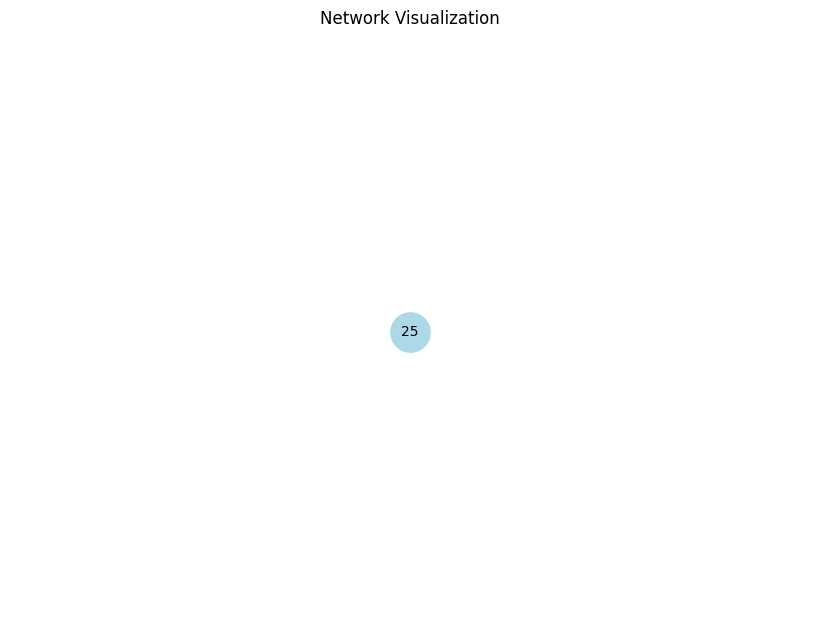

Degree Centrality: {25: 1}
Closeness Centrality: {25: 0.0}
Betweenness Centrality: {25: 0.0}
Eigenvector Centrality: {25: 1.0}
Clustering Coefficient: 0.0
Assortativity: 0.0

Metrics for network containing node 3744:
Number of nodes in the subgraph: 33


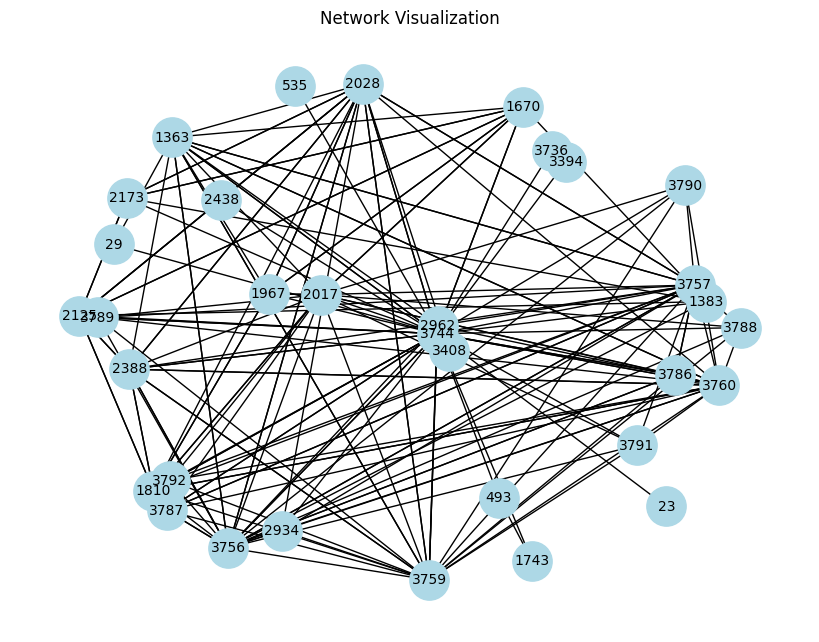

Degree Centrality: {1670: 0.375, 2438: 0.15625, 2962: 0.21875, 1810: 0.5, 535: 0.03125, 23: 0.03125, 3736: 0.09375, 29: 0.0625, 3744: 1.40625, 3756: 0.8125, 3757: 0.71875, 1967: 0.3125, 3759: 0.6875, 3760: 0.6875, 3394: 0.09375, 3786: 0.28125, 3787: 0.28125, 3788: 0.1875, 2125: 0.40625, 3789: 0.21875, 1743: 0.0625, 3408: 0.09375, 3790: 0.1875, 3791: 0.1875, 1363: 0.53125, 2388: 0.53125, 3792: 0.1875, 2017: 0.625, 1383: 0.15625, 2028: 0.6875, 493: 0.0625, 2934: 0.1875, 2173: 0.25}
Closeness Centrality: {1670: 0.41860465116279066, 2438: 0.3333333333333333, 2962: 0.32727272727272727, 1810: 0.44999999999999996, 535: 0.30517578125, 23: 0.30517578125, 3736: 0.325, 29: 0.3201844262295082, 3744: 0.46153846153846156, 3756: 0.375, 3757: 0.375, 1967: 0.41860465116279066, 3759: 0.34615384615384615, 3760: 0.3529411764705882, 3394: 0.325, 3786: 0.3157894736842105, 3787: 0.3157894736842105, 3788: 0.32727272727272727, 2125: 0.4, 3789: 0.3157894736842105, 1743: 0.325, 3408: 0.3214285714285714, 3790: 0.

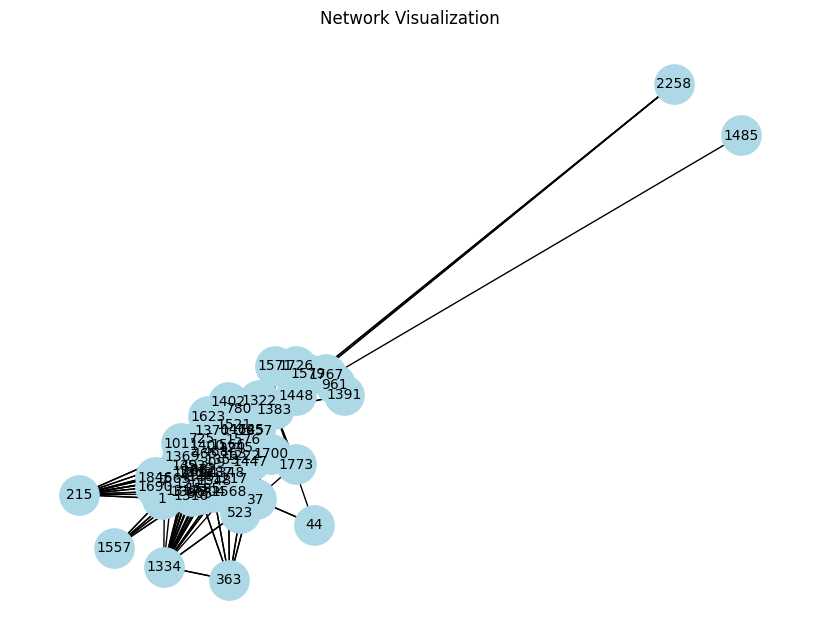

Degree Centrality: {1: 0.7575757575757576, 7: 0.48484848484848486, 905: 0.6818181818181819, 523: 0.16666666666666669, 1548: 0.18181818181818182, 780: 0.06060606060606061, 149: 0.16666666666666669, 1557: 0.12121212121212122, 1562: 0.19696969696969696, 1690: 0.21212121212121213, 1565: 0.42424242424242425, 1566: 0.696969696969697, 1568: 0.15151515151515152, 163: 0.09090909090909091, 35: 0.5151515151515151, 37: 0.09090909090909091, 1571: 0.030303030303030304, 1447: 0.09090909090909091, 1448: 0.030303030303030304, 41: 0.42424242424242425, 1322: 0.06060606060606061, 1579: 0.030303030303030304, 44: 0.045454545454545456, 1576: 0.15151515151515152, 425: 0.30303030303030304, 304: 0.4090909090909091, 1201: 0.4545454545454546, 1585: 0.5454545454545454, 309: 0.30303030303030304, 1846: 0.21212121212121213, 1334: 0.4696969696969697, 1464: 0.06060606060606061, 1725: 0.09090909090909091, 1726: 0.030303030303030304, 961: 0.030303030303030304, 1217: 0.24242424242424243, 1348: 0.30303030303030304, 1222: 0

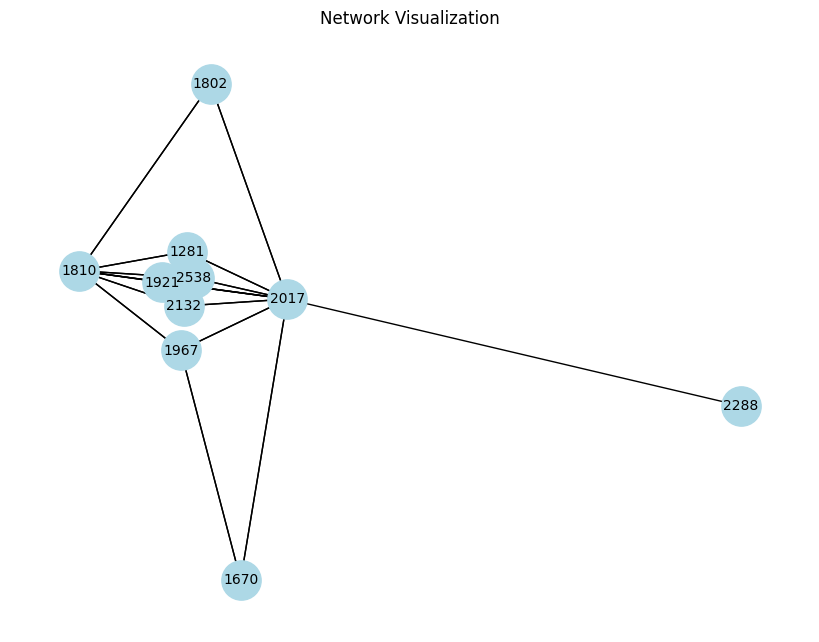

Degree Centrality: {2017: 1.8888888888888888, 1921: 0.4444444444444444, 1281: 0.4444444444444444, 1670: 0.4444444444444444, 2538: 0.4444444444444444, 1802: 0.4444444444444444, 1967: 0.6666666666666666, 2288: 0.1111111111111111, 1810: 1.5555555555555554, 2132: 0.4444444444444444}
Closeness Centrality: {2017: 0.8888888888888888, 1921: 0.5079365079365079, 1281: 0.5079365079365079, 1670: 0.5079365079365079, 2538: 0.5079365079365079, 1802: 0.5079365079365079, 1967: 0.5470085470085471, 2288: 0.5294117647058824, 1810: 0.7901234567901234, 2132: 0.5079365079365079}
Betweenness Centrality: {2017: 0.4722222222222222, 1921: 0.0, 1281: 0.0, 1670: 0.0, 2538: 0.0, 1802: 0.0, 1967: 0.013888888888888888, 2288: 0.0, 1810: 0.20833333333333331, 2132: 0.0}
Eigenvector Centrality: {2017: 0.5397221754217358, 1921: 0.2497492959209303, 1281: 0.2497492959209303, 1670: 0.20107501372906816, 2538: 0.2497492959209303, 1802: 0.2497492959209303, 1967: 0.298011816245552, 2288: 0.12954557852132675, 1810: 0.500801516182

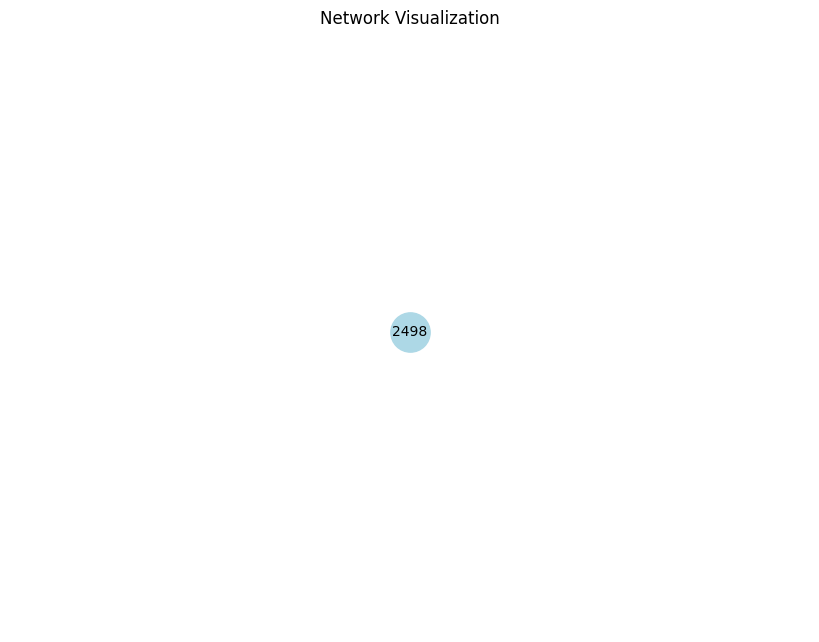

Degree Centrality: {2498: 1}
Closeness Centrality: {2498: 0.0}
Betweenness Centrality: {2498: 0.0}
Eigenvector Centrality: {2498: 1.0}
Clustering Coefficient: 0.0
Assortativity: 0.0

Metrics for network containing node 4531:
Number of nodes in the subgraph: 23


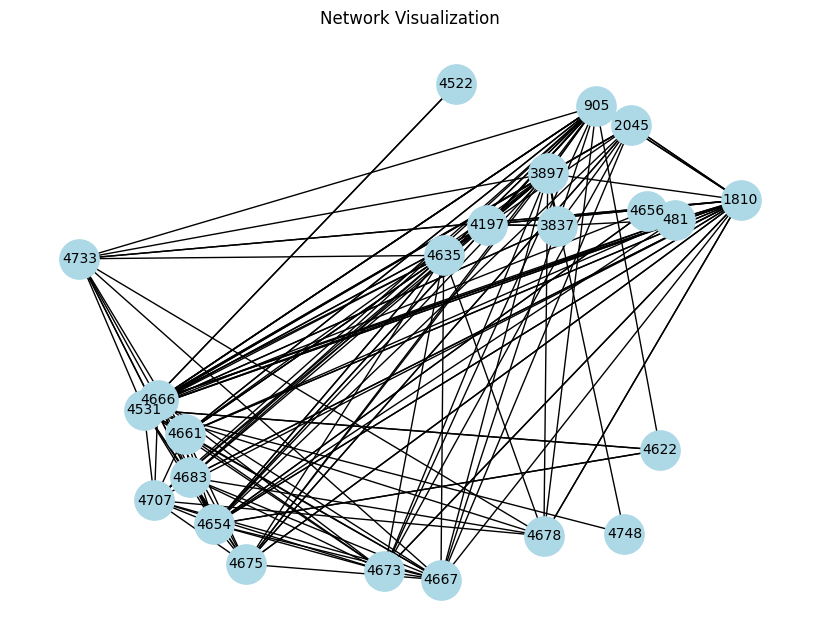

Degree Centrality: {905: 1.1818181818181819, 4748: 0.09090909090909091, 4622: 0.2272727272727273, 1810: 1.3181818181818181, 4635: 0.8636363636363636, 4522: 0.09090909090909091, 4654: 1.0, 4656: 0.13636363636363635, 2045: 0.6363636363636364, 4531: 1.2727272727272727, 4661: 0.8181818181818182, 3897: 1.0, 4666: 0.7727272727272727, 4667: 0.6363636363636364, 4673: 0.5909090909090909, 4675: 0.6363636363636364, 4678: 0.4090909090909091, 4683: 0.6363636363636364, 481: 0.3181818181818182, 4707: 0.5454545454545454, 4197: 0.5454545454545454, 3837: 0.36363636363636365, 4733: 0.5454545454545454}
Closeness Centrality: {905: 0.7586206896551724, 4748: 0.3728813559322034, 4622: 0.5, 1810: 0.7096774193548387, 4635: 0.7096774193548387, 4522: 0.36065573770491804, 4654: 0.5641025641025641, 4656: 0.39285714285714285, 2045: 0.5945945945945946, 4531: 0.55, 4661: 0.55, 3897: 0.8461538461538461, 4666: 0.55, 4667: 0.43137254901960786, 4673: 0.5365853658536586, 4675: 0.5365853658536586, 4678: 0.4583333333333333, 

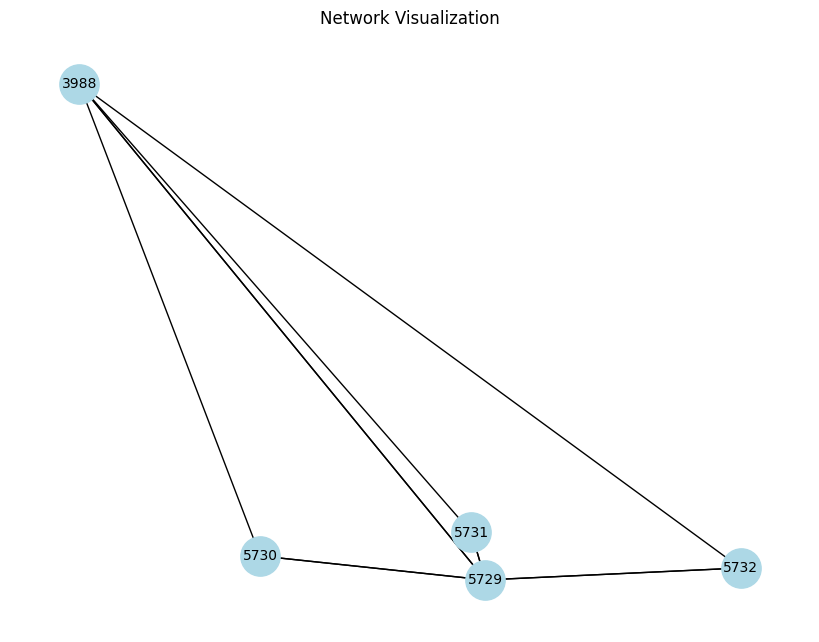

Degree Centrality: {5729: 2.0, 5730: 0.75, 5731: 0.75, 5732: 0.75, 3988: 1.25}
Closeness Centrality: {5729: 1.0, 5730: 0.6666666666666666, 5731: 0.6666666666666666, 5732: 0.6666666666666666, 3988: 0.5714285714285714}
Betweenness Centrality: {5729: 0.75, 5730: 0.0, 5731: 0.0, 5732: 0.0, 3988: 0.0}
Eigenvector Centrality: {5729: 0.6519998493359734, 5730: 0.4060910533580263, 5731: 0.4060910533580263, 5732: 0.4060910533580263, 3988: 0.28313665536905286}
Clustering Coefficient: 0.7833333333333333
Assortativity: -0.3296703296703297

Metrics for network containing node 1669:
Number of nodes in the subgraph: 3


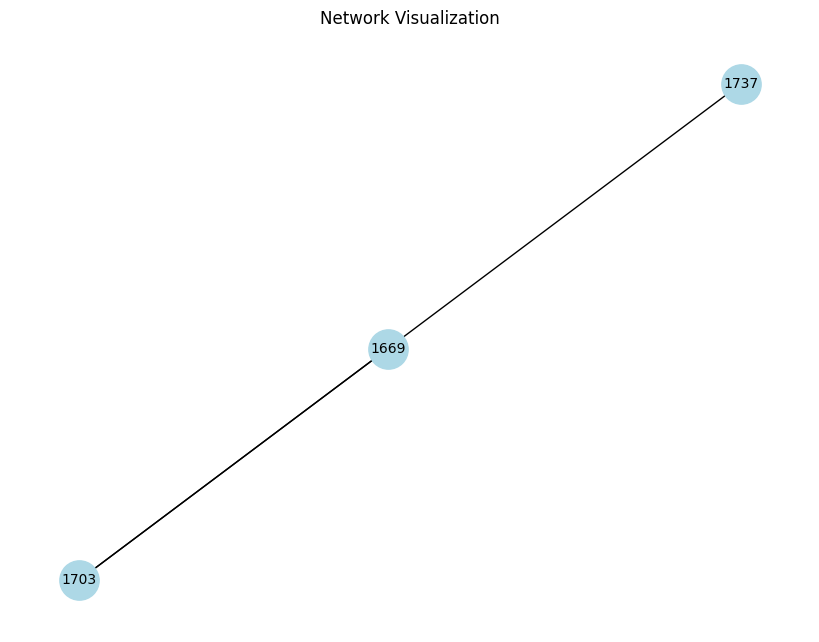

Degree Centrality: {1737: 0.5, 1669: 1.5, 1703: 1.0}
Closeness Centrality: {1737: 0.6666666666666666, 1669: 0.5, 1703: 0.5}
Betweenness Centrality: {1737: 0.0, 1669: 0.5, 1703: 0.0}
Eigenvector Centrality: {1737: 0.5773502691896258, 1669: 0.5773502691896258, 1703: 0.5773502691896258}
Clustering Coefficient: 0.0
Assortativity: -0.49999999999999994

Metrics for network containing node 2305:
Number of nodes in the subgraph: 7


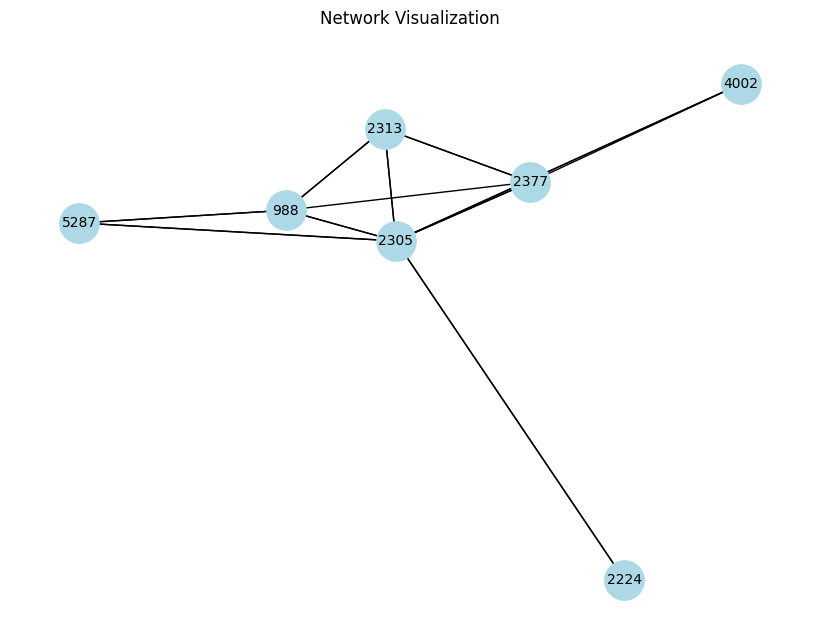

Degree Centrality: {2305: 2.0, 4002: 0.5, 5287: 0.6666666666666666, 2377: 1.0, 2313: 1.0, 2224: 0.3333333333333333, 988: 1.1666666666666665}
Closeness Centrality: {2305: 1.0, 4002: 0.5454545454545454, 5287: 0.6, 2377: 0.75, 2313: 0.6666666666666666, 2224: 0.5454545454545454, 988: 0.6666666666666666}
Betweenness Centrality: {2305: 0.65, 4002: 0.0, 5287: 0.0, 2377: 0.016666666666666666, 2313: 0.016666666666666666, 2224: 0.0, 988: 0.05}
Eigenvector Centrality: {2305: 0.567374154027951, 4002: 0.17006831038177866, 5287: 0.2846514562761665, 2377: 0.46250716423332006, 2313: 0.4232860794178014, 2224: 0.17006831038177866, 988: 0.3822691138356043}
Clustering Coefficient: 0.647985347985348
Assortativity: -0.2195121951219513

Metrics for network containing node 2377:
Number of nodes in the subgraph: 3


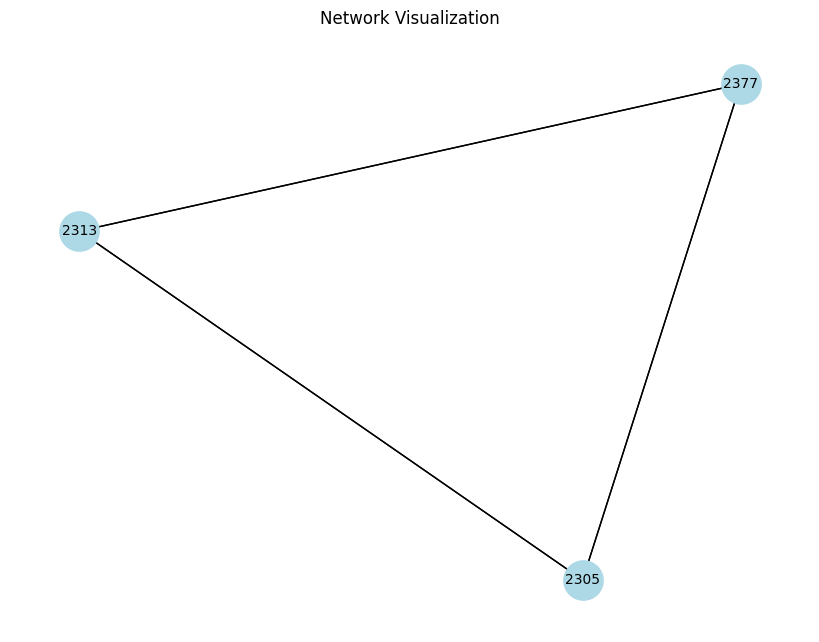

Degree Centrality: {2377: 2.0, 2305: 2.0, 2313: 2.0}
Closeness Centrality: {2377: 1.0, 2305: 1.0, 2313: 1.0}
Betweenness Centrality: {2377: 0.0, 2305: 0.0, 2313: 0.0}
Eigenvector Centrality: {2377: 0.5773502691896258, 2305: 0.5773502691896258, 2313: 0.5773502691896258}
Clustering Coefficient: 1.0
Assortativity: -0.5000000000000001



In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Define a function to plot the network
def plot_network(subgraph):
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(subgraph)  # Layout for the nodes
    nx.draw(subgraph, pos, with_labels=True, node_color='lightblue', node_size=800, font_size=10, arrows=False)
    plt.title('Network Visualization')
    plt.show()

# Create a directed graph
G = nx.DiGraph()

# Add nodes and edges from the DataFrame
for index, row in df.iterrows():
    G.add_edge(row['Source'], row['Target'], weight=row['Rating'])

# Add 'Ratings' attribute to each node based on the edge weights
for node in G.nodes():
    # Calculate the average rating received by the node based on its incoming edges
    # If the node has no incoming edges, set the rating to None
    ratings = [G.edges[edge]['weight'] for edge in G.in_edges(node)]
    if ratings:
        average_rating = sum(ratings) / len(ratings)
    else:
        average_rating = None
    G.nodes[node]['Ratings'] = average_rating

# Define the list of nodes
nodes_to_analyze = [25, 3744, 1383, 2017, 2498, 4531, 5729, 1669, 2305, 2377]

# Iterate over each node and calculate network metrics
for node in nodes_to_analyze:
    print(f"Metrics for network containing node {node}:")

    # Extract subgraph for the current node
    subgraph = nx.subgraph(G, [node] + list(G.neighbors(node)))

    # Calculate number of nodes in the subgraph
    num_nodes = subgraph.number_of_nodes()
    print("Number of nodes in the subgraph:", num_nodes)

    # Plot the network
    plot_network(subgraph)

    # Calculate network metrics
    degree_centrality = nx.degree_centrality(subgraph)
    closeness_centrality = nx.closeness_centrality(subgraph)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    eigenvector_centrality = nx.eigenvector_centrality(subgraph)
    clustering_coefficient = nx.average_clustering(subgraph)
    assortativity = nx.attribute_assortativity_coefficient(subgraph, 'Ratings')

    # Print network metrics
    print("Degree Centrality:", degree_centrality)
    print("Closeness Centrality:", closeness_centrality)
    print("Betweenness Centrality:", betweenness_centrality)
    print("Eigenvector Centrality:", eigenvector_centrality)
    print("Clustering Coefficient:", clustering_coefficient)
    print("Assortativity:", assortativity)
    print()


#Node 2305


Interpretation for node 2305:
Degree Centrality:

Node 2305 has the highest degree centrality with a value of 2.0, indicating that it is directly connected to two other nodes in the network.
Node 4002 has a degree centrality of 0.5, meaning it is connected to only one other node.
Nodes 5287, 2377, 2313, and 988 have moderate degree centrality values ranging from 0.333 to 1.167.
Closeness Centrality:

Node 2305 has the highest closeness centrality, indicating that it is the most central node in terms of closeness to all other nodes.
Node 4002 has a relatively lower closeness centrality compared to node 2305.
Nodes 5287, 2377, 2313, 2224, and 988 have closeness centrality values ranging from 0.545 to 1.0.
Betweenness Centrality:

Node 2305 has the highest betweenness centrality, indicating that it lies on many shortest paths between other nodes in the network.
Nodes 2377, 2313, and 988 also have non-zero betweenness centrality, suggesting they act as bridges between different parts of the network.
Eigenvector Centrality:

Node 2305 has the highest eigenvector centrality, indicating that it is connected to other nodes that are also well-connected.
Node 4002 has the lowest eigenvector centrality among the nodes listed.
Clustering Coefficient:

The clustering coefficient of 0.648 indicates that the network has relatively high clustering, meaning that nodes tend to form tightly-knit clusters.
Assortativity:

The negative assortativity value (-0.22) suggests that there is a tendency for nodes to connect to nodes with different attributes. This indicates disassortative mixing, where nodes with high degree tend to connect to nodes with low degree and vice versa.

#Node 3744


Degree Centrality:

Node 3744 has the highest degree centrality with a value of 1.40625, indicating it has the highest number of connections in the network.
Nodes 1810, 1363, 2388, and 2017 also have relatively high degree centrality values.
Closeness Centrality:

Node 3744 has the highest closeness centrality, indicating it is the closest to all other nodes in terms of shortest path length.
Nodes 2017, 1383, and 2305 also have relatively high closeness centrality values.
Betweenness Centrality:

Node 3744 has the highest betweenness centrality, indicating it lies on the most shortest paths between other nodes in the network.
Nodes 2305, 1363, and 2017 also have non-zero betweenness centrality values.
Eigenvector Centrality:

Node 3744 has the highest eigenvector centrality, indicating it is connected to other nodes that are also well-connected.
Nodes 2017, 1383, 2305, and 1363 also have relatively high eigenvector centrality values.
Clustering Coefficient:

The clustering coefficient of 0.52 indicates that the network has a moderate level of clustering, meaning nodes tend to form clusters or groups.
Assortativity:

The assortativity value of -0.058 suggests a slight tendency for nodes to connect to nodes with different attributes. This indicates a weak disassortative mixing pattern in the network.

In [ ]:
# Plot the network graph
pos = nx.spring_layout(G)  # You can use other layout algorithms
labels = nx.get_edge_attributes(G, 'weight')
nx.draw(G, pos, with_labels=True, font_weight='bold', node_color='skyblue', node_size=700, font_size=8)
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)

plt.show()

KeyboardInterrupt: 

In [ ]:
degree_centrality = nx.degree_centrality(G)
top_20_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
print("Top 20 nodes by degree centrality:", top_20_degree)

Top 20 nodes by degree centrality: [(35, 0.22074829931972786), (2642, 0.1391156462585034), (1810, 0.12159863945578231), (2125, 0.09812925170068026), (2028, 0.09727891156462584), (905, 0.08979591836734693), (4172, 0.08265306122448979), (7, 0.07619047619047618), (1, 0.075), (4197, 0.06887755102040816), (13, 0.06819727891156462), (1018, 0.06496598639455782), (2296, 0.0586734693877551), (1953, 0.05680272108843537), (2388, 0.05663265306122449), (4291, 0.05612244897959183), (1334, 0.055782312925170066), (546, 0.05289115646258503), (1386, 0.05204081632653061), (3988, 0.05187074829931972)]


In [ ]:
betweenness_centrality = nx.betweenness_centrality(G)
top_20_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
print("Top 20 nodes by betweenness centrality:", top_20_betweenness)


Top 20 nodes by betweenness centrality: [(35, 0.14211022254570446), (2642, 0.06220168253637525), (1810, 0.049533487572168064), (905, 0.048142532048893405), (1, 0.044997192103169), (4172, 0.04189794211378277), (2125, 0.04163270169885217), (7, 0.03982175327702963), (2028, 0.0387828896318293), (1953, 0.032305227236014686), (13, 0.03223521837548451), (2388, 0.025361292868165086), (1018, 0.022438773575925337), (2067, 0.021577510719149668), (546, 0.020631656982740786), (1334, 0.019519413199267914), (3988, 0.01897457266935395), (1352, 0.018696586115981587), (2296, 0.01837800256748982), (4197, 0.018155159172410403)]


In [ ]:
isolated_nodes = [node for node in G.nodes() if G.degree(node) == 0]
isolated_nodes_count = len(isolated_nodes)
isolated_nodes_count

0

In [ ]:
closeness_centrality = nx.closeness_centrality(G)
top_20_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
print("Top 20 nodes by closeness centrality:", top_20_closeness)


Top 20 nodes by closeness centrality: [(905, 0.3393980425132191), (35, 0.331224398123012), (1, 0.3309941813389126), (2642, 0.32729751092877013), (13, 0.32073943653905407), (2388, 0.31838066414933014), (1810, 0.3171614241767303), (1334, 0.31652899860509176), (353, 0.31563736762310557), (4172, 0.3138949515704774), (2028, 0.31312098522321724), (1832, 0.3130952520719004), (4291, 0.3125558312585843), (2067, 0.31120266518631634), (7, 0.31018914079228826), (1018, 0.3099872276005602), (2125, 0.30915710680929026), (57, 0.3083064681727672), (1565, 0.30805717047067877), (304, 0.3064218633645045)]


In [ ]:
import pandas as pd

# Convert the results to DataFrames
df_degree = pd.DataFrame(top_20_degree, columns=['Node', 'Degree Centrality'])
df_betweenness = pd.DataFrame(top_20_betweenness, columns=['Node', 'Betweenness Centrality'])
df_closeness = pd.DataFrame(top_20_closeness, columns=['Node', 'Closeness Centrality'])

# Merge DataFrames on the 'Node' column
result_df = pd.merge(df_degree, df_betweenness, on='Node').merge(df_closeness, on='Node')

print(result_df)


    Node  Degree Centrality  Betweenness Centrality  Closeness Centrality
0     35           0.220748                0.142110              0.331224
1   2642           0.139116                0.062202              0.327298
2   1810           0.121599                0.049533              0.317161
3   2125           0.098129                0.041633              0.309157
4   2028           0.097279                0.038783              0.313121
5    905           0.089796                0.048143              0.339398
6   4172           0.082653                0.041898              0.313895
7      7           0.076190                0.039822              0.310189
8      1           0.075000                0.044997              0.330994
9     13           0.068197                0.032235              0.320739
10  1018           0.064966                0.022439              0.309987
11  2388           0.056633                0.025361              0.318381
12  1334           0.055782           

In [ ]:

G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Rating'])

# Add 'Rating' attribute to nodes
for node in G.nodes():
    matching_rows = df[df['Source'] == node]
    if not matching_rows.empty:
        rating = matching_rows['Rating'].iloc[0]  # Get the 'Rating' for the node
        G.nodes[node]['Rating'] = rating

# Add a new attribute 'Homophily' to each edge
for edge in G.edges(data=True):
    source_rating = G.nodes[edge[0]].get('Rating', None)
    target_rating = G.nodes[edge[1]].get('Rating', None)

    # Check if both nodes have 'Rating' attribute
    if source_rating is not None and target_rating is not None:
        edge[2]['Homophily'] = int(source_rating == target_rating)
    else:
        edge[2]['Homophily'] = None  # or any other default value

# Calculate homophily measure
homophily_edges = sum(edge[2]['Homophily'] for edge in G.edges(data=True) if edge[2]['Homophily'] is not None)
total_edges = len(G.edges())
homophily_measure = homophily_edges / total_edges

print(f"Homophily Measure: {homophily_measure}")



Homophily Measure: 0.43625535082821515


In [ ]:
import networkx as nx
import pandas as pd


G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Rating'])

# Add 'Rating' attribute to nodes
for node in G.nodes():
    matching_rows = df[df['Source'] == node]
    if not matching_rows.empty:
        rating = matching_rows['Rating'].iloc[0]  # Get the 'Rating' for the node
        G.nodes[node]['Rating'] = rating

# Calculate homophily measure for each node
homophily_values = {}
for node in G.nodes():
    neighbors = list(G.neighbors(node))
    if neighbors:
        matching_neighbors = [neighbor for neighbor in neighbors if 'Rating' in G.nodes[neighbor]]
        homophily_values[node] = sum(G.nodes.get(neighbor, {}).get('Rating') == G.nodes.get(node, {}).get('Rating') for neighbor in matching_neighbors) / len(matching_neighbors) if matching_neighbors else None
    else:
        homophily_values[node] = None

# Sort nodes based on homophily in descending order
nodes_sorted_by_homophily = sorted(homophily_values.items(), key=lambda x: x[1] if x[1] is not None else float('-inf'), reverse=True)

# Extract top 100 nodes with highest homophily
top_nodes_homophily = nodes_sorted_by_homophily[:1000]

# Display the top 100 nodes with their homophily values
top_nodes_df = pd.DataFrame(top_nodes_homophily, columns=['Node', 'Homophily'])
print("Top 100 Nodes with Highest Homophily:")
print(top_nodes_df)


Top 100 Nodes with Highest Homophily:
     Node  Homophily
0      44        1.0
1      46        1.0
2      55        1.0
3      65        1.0
4      74        1.0
..    ...        ...
995  4982        1.0
996  4984        1.0
997  4985        1.0
998  4989        1.0
999  4991        1.0

[1000 rows x 2 columns]


In [ ]:
# Count nodes with homophily measure > 0.9
count_high_homophily = sum(1 for node, homophily in homophily_values.items() if homophily is not None and homophily > 0.5)

print(f"Number of Nodes with Homophily > 0.5: {count_high_homophily}")


Number of Nodes with Homophily < 0.5: 3181


In [ ]:
# Count total nodes
total_nodes = len(G.nodes())

# Count nodes with 'None' homophily value
count_none_homophily = sum(1 for node, homophily in homophily_values.items() if homophily is None)

print(f"Total Number of Nodes: {total_nodes}")
print(f"Number of Nodes with 'None' Homophily Value: {count_none_homophily}")


Total Number of Nodes: 5881
Number of Nodes with 'None' Homophily Value: 2


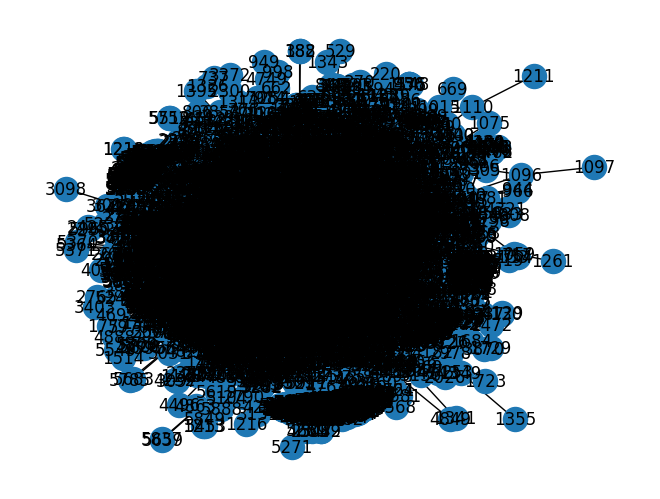

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms import community

# Detect communities using Louvain algorithm
communities = list(community.label_propagation_communities(G))

# Choose a community of interest (first community in this case)
target_community = communities[0]

# Create a subgraph with nodes from the target community
subset_graph = G.subgraph(target_community)

# Visualize the subset graph (optional)
pos = nx.spring_layout(subset_graph)
nx.draw(subset_graph, pos, with_labels=True)
plt.show()


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Detect communities using Louvain algorithm
communities = list(community.label_propagation_communities(G))

# Choose a community of interest (first community in this case)
target_community = communities[0]

# Create a subgraph with nodes from the target community
subset_graph = G.subgraph(target_community)

# Get positions using the Fruchterman-Reingold layout
pos = nx.spring_layout(subset_graph)

# Extract node positions for Plotly
node_x = [pos[node][0] for node in subset_graph.nodes]
node_y = [pos[node][1] for node in subset_graph.nodes]

# Create edges
edge_x = []
edge_y = []
for edge in subset_graph.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x += [x0, x1, None]
    edge_y += [y0, y1, None]

# Create nodes
node_trace = go.Scatter(
    x=node_x,
    y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        )
    )
)

# Create edges
edge_trace = go.Scatter(
    x=edge_x,
    y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                showlegend=False,
                hovermode='closest',
                margin=dict(b=0, l=0, r=0, t=0),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

# Show the plot
fig.show()


In [ ]:

oldest_timestamp = df['Time'].min()
newest_timestamp = df['Time'].max()

print("Oldest Timestamp:", oldest_timestamp)
print("Newest Timestamp:", newest_timestamp)


Oldest Timestamp: 2010-11-08 18:45:12
Newest Timestamp: 2016-01-25 01:12:04


Incomplete 2016 data and 2010 data and hence focus should be only on 2012 to 2015 data

In [ ]:
df.dtypes

Source                int64
Target                int64
Rating                int64
Time         datetime64[ns]
Homophily            object
dtype: object

In [ ]:
# Convert 'Time' to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Create a graph from the DataFrame
G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Rating', 'Time'])

# Print nodes and their attributes for debugging
print("Nodes and Attributes:")
for node, attributes in G.nodes(data=True):
    print(f"Node {node}: {attributes}")

# Count leaf nodes per year
leaf_nodes_per_year = {}
for node in G.nodes():
    neighbors = list(G.neighbors(node))
    if not neighbors:  # Node is a leaf
        year = G.nodes[node]['Time'].year
        leaf_nodes_per_year[year] = leaf_nodes_per_year.get(year, 0) + 1

print("\nLeaf Nodes Per Year:")
for year, count in leaf_nodes_per_year.items():
    print(f"Year {year}: {count} leaf nodes")


In [ ]:
node_degrees = dict(G.degree())

# Find the minimum degree in the network
min_degree = min(node_degrees.values())

# Find nodes with the minimum degree
nodes_with_min_degree = [node for node, degree in node_degrees.items() if degree == min_degree]

# Print the count and list of nodes with the minimum degree
print(f"Count of nodes with the least neighbors ({min_degree}): {len(nodes_with_min_degree)}")
print("Nodes with the least neighbors:", nodes_with_min_degree)

Count of nodes with the least neighbors (1): 2260
Nodes with the least neighbors: [16, 46, 52, 55, 65, 66, 71, 74, 79, 83, 86, 94, 99, 103, 106, 116, 131, 140, 145, 154, 168, 170, 172, 175, 182, 187, 190, 195, 196, 205, 210, 213, 220, 232, 237, 247, 252, 253, 267, 281, 287, 290, 291, 294, 302, 303, 305, 306, 311, 323, 326, 327, 329, 334, 338, 289, 349, 336, 354, 355, 367, 368, 370, 379, 382, 385, 388, 391, 400, 403, 333, 341, 429, 430, 434, 442, 445, 450, 456, 471, 473, 369, 376, 373, 420, 398, 482, 483, 485, 504, 505, 511, 422, 337, 381, 362, 524, 364, 413, 529, 531, 541, 335, 543, 426, 552, 565, 575, 474, 528, 580, 584, 343, 596, 599, 600, 601, 602, 603, 604, 607, 609, 611, 612, 613, 615, 618, 622, 624, 631, 636, 344, 648, 662, 668, 671, 675, 679, 682, 684, 693, 694, 683, 646, 698, 706, 704, 711, 712, 717, 719, 721, 723, 731, 736, 737, 738, 739, 740, 745, 746, 747, 749, 750, 752, 754, 758, 759, 761, 657, 765, 766, 772, 783, 785, 789, 796, 797, 800, 803, 806, 808, 809, 810, 813, 814, 

In [ ]:
df['Time'] = pd.to_datetime(df['Time'])

# Create a graph from the DataFrame
G = nx.from_pandas_edgelist(df, 'Source', 'Target', create_using=nx.Graph())

# Group nodes by year
nodes_per_year = df.groupby(df['Time'].dt.year)['Source'].unique().apply(set)

# Calculate the count of nodes with the least neighbors for each year
for year, nodes in nodes_per_year.items():
    subgraph = G.subgraph(nodes)
    node_degrees = dict(subgraph.degree())
    min_degree = min(node_degrees.values())
    nodes_with_min_degree = [node for node, degree in node_degrees.items() if degree == min_degree]

    print(f"Year {year}: Count of nodes with the least neighbors ({min_degree}): {len(nodes_with_min_degree)}")
    print(f"Nodes with the least neighbors: {nodes_with_min_degree}\n")


Year 2010: Count of nodes with the least neighbors (1): 7
Nodes with the least neighbors: [46, 52, 55, 65, 66, 71, 74]

Year 2011: Count of nodes with the least neighbors (0): 1
Nodes with the least neighbors: [1684]

Year 2012: Count of nodes with the least neighbors (0): 5
Nodes with the least neighbors: [259, 1742, 2347, 2383, 2418]

Year 2013: Count of nodes with the least neighbors (0): 1
Nodes with the least neighbors: [5188]

Year 2014: Count of nodes with the least neighbors (0): 3
Nodes with the least neighbors: [2387, 992, 5739]

Year 2015: Count of nodes with the least neighbors (0): 4
Nodes with the least neighbors: [5688, 5833, 6000, 4997]

Year 2016: Count of nodes with the least neighbors (1): 4
Nodes with the least neighbors: [5688, 3901, 5318, 1128]



In [ ]:
#this approach is probably not correct as even though there is some interaction happened in earlier years with this node ,
#this code will flag it as only 1 interaction at the yearly time stamp

# Create a graph from the DataFrame
G = nx.from_pandas_edgelist(df, 'Source', 'Target', create_using=nx.Graph())

# Group nodes by year
nodes_per_year = df.groupby(df['Time'].dt.year)['Source'].unique().apply(set)

# Initialize an empty dictionary to store cumulative counts
cumulative_counts = {}

# Calculate the cumulative count of nodes with the least neighbors
for year, nodes in nodes_per_year.items():
    subgraph = G.subgraph(nodes)
    node_degrees = dict(subgraph.degree())
    min_degree = min(node_degrees.values())
    nodes_with_min_degree = [node for node, degree in node_degrees.items() if degree == min_degree]

    cumulative_counts[year] = len(nodes_with_min_degree) + cumulative_counts.get(year - 1, 0)

# Print the cumulative counts
for year, count in cumulative_counts.items():
    print(f"Up to year {year}: Count of nodes with the least neighbors: {count}")


Up to year 2010: Count of nodes with the least neighbors: 7
Up to year 2011: Count of nodes with the least neighbors: 8
Up to year 2012: Count of nodes with the least neighbors: 13
Up to year 2013: Count of nodes with the least neighbors: 14
Up to year 2014: Count of nodes with the least neighbors: 17
Up to year 2015: Count of nodes with the least neighbors: 21
Up to year 2016: Count of nodes with the least neighbors: 25


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt


# Create a subgraph with nodes from the target community
subset_graph = G.subgraph(target_community)

# Visualize the primary links of node 5688
node_of_interest = 25
neighbors = list(subset_graph.neighbors(node_of_interest))

# Create a subgraph with primary links
primary_links_graph = subset_graph.subgraph([node_of_interest] + neighbors)

# Visualize the subgraph
pos = nx.spring_layout(primary_links_graph)
nx.draw(primary_links_graph, pos, with_labels=True, font_weight='bold', node_color='skyblue', node_size=800, edge_color='gray', linewidths=1, font_size=8)
plt.title(f'Primary Links of Node {node_of_interest} in the Cluster')
plt.show()


NameError: name 'target_community' is not defined

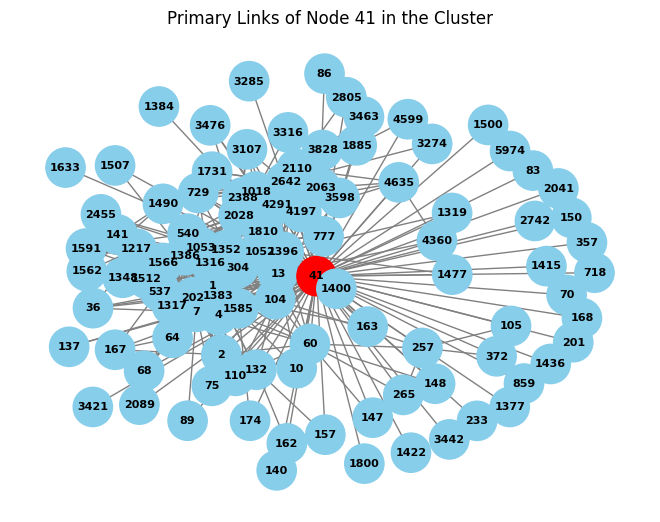

In [ ]:
# Create a subgraph with nodes from the target community
subset_graph = G.subgraph(target_community)

# Visualize the primary links of node 35
node_of_interest = 41
neighbors = list(subset_graph.neighbors(node_of_interest))

# Create a subgraph with primary links
primary_links_graph = subset_graph.subgraph([node_of_interest] + neighbors)

# Visualize the subgraph
pos = nx.spring_layout(primary_links_graph)
node_colors = ['red' if node == node_of_interest else 'skyblue' for node in primary_links_graph.nodes()]
nx.draw(primary_links_graph, pos, with_labels=True, font_weight='bold', node_color=node_colors, node_size=800, edge_color='gray', linewidths=1, font_size=8)
plt.title(f'Primary Links of Node {node_of_interest} in the Cluster')
plt.show()


In [ ]:
import networkx as nx
import plotly.graph_objects as go
import pandas as pd
from ipywidgets import widgets
from IPython.display import display

df['Time'] = pd.to_datetime(df['Time'])
G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Rating', 'Time'])

# Print some information for debugging
print("Nodes:", G.nodes())
print("Edges:", G.edges())

# Create an interactive graph
def plot_interactive_graph(year, selected_node):
    # Filter the graph based on the selected year
    filtered_graph = G.copy()  # Create a copy to avoid modifying the original graph
    edges_to_remove = [(source, target) for source, target, data in G.edges(data=True) if data['Time'].year != year]
    filtered_graph.remove_edges_from(edges_to_remove)

    # Print some information for debugging
    print("Filtered Edges:", filtered_graph.edges())

    # Create a Plotly figure
    fig = go.Figure()

    # Add edges to the figure
    for edge in filtered_graph.edges(data=True):
        fig.add_trace(go.Scatter(
            x=[edge[2]['Time']],
            y=[edge[2]['Rating']],
            mode='lines',
            line=dict(width=1, color='blue'),
            hoverinfo='text',
            text=f'Source: {edge[0]}, Target: {edge[1]}',
        ))

    # Add nodes to the figure
    for node in filtered_graph.nodes(data=True):
        rating = G.nodes[node[0]].get('Rating', None)
        if rating is not None:
            fig.add_trace(go.Scatter(
                x=[df.loc[(df['Source'] == node[0]) | (df['Target'] == node[0]), 'Time'].max()],
                y=[rating],
                mode='markers',
                marker=dict(size=10, color='red'),
                text=f'Node {node[0]}',
            ))

    fig.update_layout(
        showlegend=False,
        xaxis=dict(title='Time'),
        yaxis=dict(title='Rating'),
    )

    return fig

# Create dropdown widgets for selecting the year and node
years = sorted(set(df['Time'].dt.year))
year_dropdown = widgets.Dropdown(
    options=years,
    value=years[0],
    description='Select Year:',
)

nodes = sorted(set(df['Source'].unique()) | set(df['Target'].unique()))
node_dropdown = widgets.Dropdown(
    options=nodes,
    value=nodes[0],
    description='Select Node:',
)

# Create an output widget for displaying the interactive graph
output_graph = widgets.Output()

# Define a function to update the graph when the year or node changes
def update_graph(change):
    with output_graph:
        output_graph.clear_output()
        year = year_dropdown.value
        selected_node = node_dropdown.value
        fig = plot_interactive_graph(year, selected_node)
        fig.show()

# Attach the update_graph function to the observe events
year_dropdown.observe(update_graph, names='value')
node_dropdown.observe(update_graph, names='value')

# Display the dropdown and output widgets
display(year_dropdown)
display(node_dropdown)
display(output_graph)

# Initial graph display
update_graph(None)


Nodes: [6, 2, 5, 1, 15, 4, 3, 13, 16, 10, 7, 21, 20, 8, 17, 23, 25, 26, 28, 29, 31, 32, 34, 35, 36, 37, 44, 39, 45, 19, 46, 47, 51, 52, 53, 54, 41, 55, 57, 61, 65, 56, 66, 69, 70, 71, 72, 74, 75, 68, 64, 76, 77, 78, 60, 79, 80, 81, 62, 83, 104, 86, 87, 89, 94, 95, 96, 97, 99, 88, 101, 100, 103, 105, 106, 107, 108, 109, 110, 111, 112, 115, 114, 119, 122, 127, 129, 116, 131, 132, 133, 113, 125, 135, 134, 137, 138, 140, 141, 139, 142, 143, 144, 145, 146, 147, 148, 93, 149, 150, 152, 153, 154, 155, 156, 157, 158, 160, 161, 162, 163, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 159, 182, 183, 184, 185, 186, 187, 33, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 209, 210, 120, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 223, 224, 225, 227, 228, 230, 231, 232, 233, 208, 234, 235, 222, 236, 237, 238, 239, 240, 241, 242, 244, 164, 245, 246, 247, 248, 250, 251, 249, 243, 252, 253, 255, 256, 257, 258, 2

Dropdown(description='Select Year:', options=(2010, 2011, 2012, 2013, 2014, 2015, 2016), value=2010)

Dropdown(description='Select Node:', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 15, 16, 17, 19, 20, 21, 23, 2…

Output()

In [ ]:

import matplotlib.pyplot as plt
from ipywidgets import widgets
from IPython.display import display

df['Time'] = pd.to_datetime(df['Time'])
G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Rating', 'Time'])

# Create an interactive graph
def plot_interactive_graph(year, selected_node):
    # Filter the graph based on the selected year
    filtered_graph = G.copy()  # Create a copy to avoid modifying the original graph
    edges_to_remove = [(source, target) for source, target, data in G.edges(data=True) if data['Time'].year != year]
    filtered_graph.remove_edges_from(edges_to_remove)

    # Create a subplot
    plt.figure(figsize=(10, 6))

    # Draw nodes with labels
    pos = nx.spring_layout(filtered_graph)
    nx.draw(filtered_graph, pos, with_labels=True, font_weight='bold', node_size=800, node_color='skyblue')

    # Draw edges
    nx.draw_networkx_edges(filtered_graph, pos, edgelist=filtered_graph.edges(), edge_color='blue')

    # Highlight selected node
    if selected_node in filtered_graph.nodes():
        nx.draw_networkx_nodes(filtered_graph, pos, nodelist=[selected_node], node_color='red', node_size=800)

    plt.title(f'Interactive Graph for Year {year} and Node {selected_node}')
    plt.show()

# Create dropdown widgets for selecting the year and node
years = sorted(set(df['Time'].dt.year))
year_dropdown = widgets.Dropdown(
    options=years,
    value=years[0],
    description='Select Year:',
)

nodes = sorted(set(df['Source'].unique()) | set(df['Target'].unique()))
node_dropdown = widgets.Dropdown(
    options=nodes,
    value=nodes[0],
    description='Select Node:',
)

# Define an output widget for displaying the graph
output_graph = widgets.Output()

# Define a function to update the graph when the year or node changes
def update_graph(change):
    with output_graph:
        output_graph.clear_output()
        year = year_dropdown.value
        selected_node = node_dropdown.value
        plot_interactive_graph(year, selected_node)

# Attach the update_graph function to the observe events
year_dropdown.observe(update_graph, names='value')
node_dropdown.observe(update_graph, names='value')

# Display the dropdown and output widgets
display(year_dropdown)
display(node_dropdown)
display(output_graph)

# Initial graph display
update_graph(None)


Dropdown(description='Select Year:', options=(2010, 2011, 2012, 2013, 2014, 2015, 2016), value=2010)

Dropdown(description='Select Node:', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 15, 16, 17, 19, 20, 21, 23, 2…

Output()

#Group Level Analysis

In [ ]:
#Understanding the structure

#Count of nodes

# Count total nodes
total_nodes = len(G.nodes())

# Count nodes with 'None' homophily value
count_none_homophily = sum(1 for node, homophily in homophily_values.items() if homophily is None)

print(f"Total Number of Nodes: {total_nodes}")
print(f"Number of Nodes with 'None' Homophily Value: {count_none_homophily}")


Total Number of Nodes: 5881
Number of Nodes with 'None' Homophily Value: 2


In [ ]:

df['Year'] = pd.to_datetime(df['Time']).dt.year


# Count total nodes
total_nodes = len(G.nodes())

# Year-over-Year (YoY) count of nodes
yoy_node_counts = {}

# Extract unique years from the 'Year' column
unique_years = df['Year'].unique()

for year in unique_years:
    # Filter nodes based on the current year
    nodes_in_year = df[df['Year'] == year]['Source'].unique()

    # Count nodes in the current year
    yoy_node_counts[year] = len(nodes_in_year)

# Print the YoY node counts
for year, node_count in yoy_node_counts.items():
    print(f"Year {year}: {node_count} nodes")

# Calculate additional metrics if needed
count_none_homophily = sum(1 for node, homophily in homophily_values.items() if homophily is None)

print(f"Total Number of Nodes (2010-2016): {total_nodes}")



Year 2010: 43 nodes
Year 2011: 1473 nodes
Year 2012: 1580 nodes
Year 2013: 2075 nodes
Year 2014: 714 nodes
Year 2015: 231 nodes
Year 2016: 31 nodes
Total Number of Nodes: 5881
Number of Nodes with 'None' Homophily: 2


In [ ]:
df['Year'] = pd.to_datetime(df['Time']).dt.year

# Assuming you have a Graph named G created from the DataFrame
G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Rating'])

# Calculate total number of links/interactions
total_links = len(G.edges())

# Year-over-Year (YoY) count of links/interactions
yoy_link_counts = {}

# Extract unique years from the 'Year' column
unique_years = df['Year'].unique()

for year in unique_years:
    # Filter edges based on the current year
    edges_in_year = df[df['Year'] == year][['Source', 'Target']]

    # Count edges in the current year
    yoy_link_counts[year] = len(edges_in_year)

# Print the YoY link counts
for year, link_count in yoy_link_counts.items():
    print(f"Year {year}: {link_count} links")

# Print the total number of links
print(f"Total Number of Links (2010-2016): {total_links}")


Year 2010: 142 links
Year 2011: 7758 links
Year 2012: 9432 links
Year 2013: 12982 links
Year 2014: 4225 links
Year 2015: 1011 links
Year 2016: 42 links
Total Number of Links: 21492


The total count will not add up as it talks about total active nodes in that specific year

In [ ]:
G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Rating'])

# Add 'Rating' attribute to nodes
for node in G.nodes():
    matching_rows = df[df['Source'] == node]
    if not matching_rows.empty:
        rating = matching_rows['Rating'].iloc[0]  # Get the 'Rating' for the node
        G.nodes[node]['Rating'] = rating

# Add a new attribute 'Homophily' to each edge
for edge in G.edges(data=True):
    source_rating = G.nodes[edge[0]].get('Rating', None)
    target_rating = G.nodes[edge[1]].get('Rating', None)

    # Check if both nodes have 'Rating' attribute
    if source_rating is not None and target_rating is not None:
        edge[2]['Homophily'] = int(source_rating == target_rating)
    else:
        edge[2]['Homophily'] = None  # or any other default value

# Create a dictionary to map nodes to their 'Homophily' values
homophily_dict = {node: G.nodes[node].get('Homophily', None) for node in G.nodes()}

# Add 'Homophily' column to DataFrame
df['Homophily'] = df['Source'].map(homophily_dict)

# Calculate homophily measure
homophily_edges = sum(edge[2]['Homophily'] for edge in G.edges(data=True) if edge[2]['Homophily'] is not None)
total_edges = len(G.edges())
homophily_measure = homophily_edges / total_edges

print(f"Homophily Measure: {homophily_measure}")


Homophily Measure: 0.43625535082821515


In [ ]:
df['Year'] = pd.to_datetime(df['Time']).dt.year

# Initialize a dictionary to store homophily scores for each year
homophily_scores_per_year = {}

# Loop through unique years in the DataFrame
for year in df['Year'].unique():
    # Filter edges based on the current year
    edges_in_year = df[df['Year'] == year][['Source', 'Target', 'Rating']]

    # Create a graph for the current year
    G_year = nx.from_pandas_edgelist(edges_in_year, 'Source', 'Target', ['Rating'])

    # Add 'Rating' attribute to nodes in the current year
    for node in G_year.nodes():
        matching_rows = edges_in_year[edges_in_year['Source'] == node]
        if not matching_rows.empty:
            rating = matching_rows['Rating'].iloc[0]
            G_year.nodes[node]['Rating'] = rating

    # Add a new attribute 'Homophily' to each edge in the current year
    for edge in G_year.edges(data=True):
        source_rating = G_year.nodes[edge[0]].get('Rating', None)
        target_rating = G_year.nodes[edge[1]].get('Rating', None)

        # Check if both nodes have 'Rating' attribute
        if source_rating is not None and target_rating is not None:
            edge[2]['Homophily'] = int(source_rating == target_rating)
        else:
            edge[2]['Homophily'] = None  # or any other default value

    # Calculate homophily measure for the current year
    homophily_edges = sum(edge[2]['Homophily'] for edge in G_year.edges(data=True) if edge[2]['Homophily'] is not None)
    total_edges = len(G_year.edges())
    homophily_measure_year = homophily_edges / total_edges

    # Store homophily score for the current year in the dictionary
    homophily_scores_per_year[year] = homophily_measure_year

# Print homophily scores for each year
for year, homophily_score in homophily_scores_per_year.items():
    print(f"Year {year}: Homophily Score = {homophily_score}")


Year 2010: Homophily Score = 0.24175824175824176
Year 2011: Homophily Score = 0.47013046463721675
Year 2012: Homophily Score = 0.4145460797799175
Year 2013: Homophily Score = 0.36806906614785995
Year 2014: Homophily Score = 0.3386703793943613
Year 2015: Homophily Score = 0.2474074074074074
Year 2016: Homophily Score = 0.37037037037037035


Year 2015-- more diverse interactions happened --actually YoY the score is just decreasing

In [ ]:
unique_years = df['Year'].unique()

for year in unique_years:
    # Create a subgraph for the current year
    subgraph = G.subgraph(df[df['Year'] == year]['Source'].tolist() + df[df['Year'] == year]['Target'].tolist())

    # Calculate degree centrality for the current year
    degree_centrality = nx.degree_centrality(subgraph)

    # Calculate betweenness centrality for the current year
    betweenness_centrality = nx.betweenness_centrality(subgraph)

    # Calculate closeness centrality for the current year
    closeness_centrality = nx.closeness_centrality(subgraph)

    # Calculate the mean or sum of centrality values
    mean_degree_centrality = sum(degree_centrality.values()) / len(degree_centrality)
    mean_betweenness_centrality = sum(betweenness_centrality.values()) / len(betweenness_centrality)
    mean_closeness_centrality = sum(closeness_centrality.values()) / len(closeness_centrality)

    # Print results for the current year
    print(f"\nCentrality Metrics for Year {year}:")
    print(f"Mean Degree Centrality: {mean_degree_centrality}")
    print(f"Mean Betweenness Centrality: {mean_betweenness_centrality}")
    print(f"Mean Closeness Centrality: {mean_closeness_centrality}")



Centrality Metrics for Year 2010:
Mean Degree Centrality: 0.1212121212121212
Mean Betweenness Centrality: 0.022247633568388284
Mean Closeness Centrality: 0.4709956132110663

Centrality Metrics for Year 2011:
Mean Degree Centrality: 0.0040818491852975
Mean Betweenness Centrality: 0.0016045623062003983
Mean Closeness Centrality: 0.2837861399388907

Centrality Metrics for Year 2012:
Mean Degree Centrality: 0.004621920135938915
Mean Betweenness Centrality: 0.0011285907547589787
Mean Closeness Centrality: 0.3191064618234033

Centrality Metrics for Year 2013:
Mean Degree Centrality: 0.003522453835244058
Mean Betweenness Centrality: 0.0008329178875504505
Mean Closeness Centrality: 0.3118595260107865

Centrality Metrics for Year 2014:
Mean Degree Centrality: 0.00954591260268121
Mean Betweenness Centrality: 0.001840332071051046
Mean Closeness Centrality: 0.3288118338757577

Centrality Metrics for Year 2015:
Mean Degree Centrality: 0.03219931521818304
Mean Betweenness Centrality: 0.004873547533

Very low mean numbers maybe because of totoal number of nodes

In [ ]:
import networkx as nx
from networkx.algorithms import community


# Detect communities using the Girvan-Newman algorithm
communities_generator = community.girvan_newman(G)

# Choose the desired number of communities
num_communities = 2

# Get the communities after running the algorithm
communities = tuple(sorted(c) for c in next(communities_generator))

# Print the detected communities
for i, community_nodes in enumerate(communities):
    print(f"Community {i + 1}: {community_nodes}")


KeyboardInterrupt: 

In [ ]:


# Detect communities using the Louvain algorithm
print("Running Louvain algorithm to detect communities...")

partition = community.best_partition(G)

# Get the communities
communities = {}
for node, community_id in partition.items():
    if community_id not in communities:
        communities[community_id] = [node]
    else:
        communities[community_id].append(node)

# Print intermediate outputs
print("Louvain algorithm completed. Now printing detected communities:")

# Print the detected communities
for i, community_nodes in communities.items():
    print(f"Community {i + 1}: {community_nodes}")

print("Community detection process completed.")



Running Louvain algorithm to detect communities...


AttributeError: module 'community' has no attribute 'best_partition'

In [ ]:
pip install --upgrade networkx


In [ ]:
# Detect communities using the Louvain algorithm
print("Running Louvain algorithm to detect communities...")

communities = list(greedy_modularity_communities(G))

# Print intermediate outputs
print("Louvain algorithm completed. Now printing detected communities:")

# Print the detected communities
for i, community_nodes in enumerate(communities):
    print(f"Community {i + 1}: {list(community_nodes)}")

print("Community detection process completed.")


Running Louvain algorithm to detect communities...
Louvain algorithm completed. Now printing detected communities:
Community 1: [4096, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 15, 16, 17, 19, 20, 21, 23, 25, 4123, 28, 29, 31, 32, 34, 36, 37, 39, 41, 44, 45, 46, 47, 4144, 52, 53, 4150, 54, 55, 4153, 56, 57, 60, 4157, 61, 62, 64, 5710, 66, 68, 69, 71, 72, 74, 75, 76, 77, 78, 80, 81, 83, 86, 87, 88, 89, 93, 4190, 94, 4192, 97, 99, 100, 104, 108, 109, 4205, 111, 110, 112, 114, 113, 116, 115, 119, 120, 122, 125, 127, 4224, 129, 131, 132, 134, 135, 4232, 137, 138, 139, 140, 141, 142, 143, 144, 145, 4243, 147, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 170, 171, 172, 173, 174, 175, 176, 177, 178, 4275, 179, 181, 183, 184, 185, 186, 187, 189, 4286, 190, 191, 192, 193, 194, 196, 195, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 217, 219, 220, 4317, 221, 222, 223, 225, 227, 228, 231, 232, 4329, 233, 235, 2

In [ ]:
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities

# Detect communities using the Louvain algorithm
print("Running Louvain algorithm to detect communities...")

communities = list(greedy_modularity_communities(G))

# Print intermediate outputs
print("Louvain algorithm completed. Now printing detected communities:")

# Print the detected communities and count of nodes
for i, community_nodes in enumerate(communities):
    community_size = len(community_nodes)
    print(f"Community {i + 1} (Size: {community_size}): {list(community_nodes)}")

print("Community detection process completed.")


Running Louvain algorithm to detect communities...
Louvain algorithm completed. Now printing detected communities:
Community 1 (Size: 2022): [4096, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 15, 16, 17, 19, 20, 21, 23, 25, 4123, 28, 29, 31, 32, 34, 36, 37, 39, 41, 44, 45, 46, 47, 4144, 52, 53, 4150, 54, 55, 4153, 56, 57, 60, 4157, 61, 62, 64, 5710, 66, 68, 69, 71, 72, 74, 75, 76, 77, 78, 80, 81, 83, 86, 87, 88, 89, 93, 4190, 94, 4192, 97, 99, 100, 104, 108, 109, 4205, 111, 110, 112, 114, 113, 116, 115, 119, 120, 122, 125, 127, 4224, 129, 131, 132, 134, 135, 4232, 137, 138, 139, 140, 141, 142, 143, 144, 145, 4243, 147, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 170, 171, 172, 173, 174, 175, 176, 177, 178, 4275, 179, 181, 183, 184, 185, 186, 187, 189, 4286, 190, 191, 192, 193, 194, 196, 195, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 217, 219, 220, 4317, 221, 222, 223, 225, 227, 228, 231, 232, 4329

In [ ]:
from community import community_louvain




In [ ]:
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Example graph creation (replace this with your actual graph)
G = nx.karate_club_graph()

# Detect communities
partition = community_louvain.best_partition(G)
# Organize nodes into communities
communities = {}
for node, community_id in partition.items():
    communities.setdefault(community_id, []).append(node)

# 1. Analyze Community Properties
for community_id, nodes in communities.items():
    subgraph = G.subgraph(nodes)
    density = nx.density(subgraph)
    print(f"Community {community_id + 1} (Size: {len(nodes)}): Density: {density}")

# Criteria for filtering (example: communities with density > 0.2)
valuable_communities = {cid: nodes for cid, nodes in communities.items() if nx.density(G.subgraph(nodes)) > 0.2}

# 2. Filter and Visualize Communities
# Assuming you're interested in visualizing the 'valuable' communities
pos = nx.spring_layout(G)  # Position nodes using the spring layout
plt.figure(figsize=(12, 8))

# Draw the entire network with a light grey color
nx.draw_networkx_nodes(G, pos, node_color='lightgrey', node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.2)

colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # Extend this list if you have more communities
for i, (community_id, nodes) in enumerate(valuable_communities.items()):
    nx.draw_networkx_nodes(G, pos, nodelist=nodes, node_color=colors[i % len(colors)], label=f"Community {community_id + 1}", node_size=100)

nx.draw_networkx_labels(G, pos, labels={node: str(node) for node in G.nodes()}, font_size=8, alpha=0.8)
plt.title("Network with Valuable Communities Highlighted")
plt.legend(scatterpoints=1)
plt.show()


AttributeError: module 'community' has no attribute 'best_partition'

In [ ]:
import networkx as nx
from networkx.algorithms.community import asyn_fluidc

# Assume G is your pre-defined graph
# For demonstration, let's create a simple graph
G = nx.karate_club_graph()

# Number of communities to find
num_communities = 3

# Detect communities using the asyn_fluidc algorithm
communities = list(asyn_fluidc(G, k=num_communities))

# Print the detected communities
for i, community in enumerate(communities):
    nodes = list(community)
    print(f"Community {i + 1} (Size: {len(nodes)}): {nodes}")


Community 1 (Size: 13): [32, 33, 8, 9, 14, 15, 18, 19, 20, 22, 26, 29, 30]
Community 2 (Size: 6): [23, 24, 25, 27, 28, 31]
Community 3 (Size: 15): [0, 1, 2, 3, 4, 5, 6, 7, 10, 11, 12, 13, 16, 17, 21]


In [ ]:
import networkx as nx

def calculate_conductance(G, community):
    """
    Calculate the conductance for a community within the graph G.
    Conductance is the fraction of total edge volume that points outside the community.
    """
    # Edges within the community
    internal_edges = G.subgraph(community).number_of_edges()
    # Edges leaving the community
    boundary_edges = sum(1 for edge in G.edges(community) if edge[1] not in community)

    total_edges = internal_edges + boundary_edges
    if total_edges == 0:  # Prevent division by zero
        return 0
    conductance = boundary_edges / total_edges
    return conductance

def calculate_cut_ratio(G, community):
    """
    Calculate the cut ratio for a community within the graph G.
    Cut ratio is the fraction of all possible edges leaving the community
    to the rest of the network.
    """
    # Nodes outside the community
    non_community_nodes = set(G.nodes()) - set(community)
    # Possible edges from community to non-community nodes
    possible_outgoing_edges = len(community) * len(non_community_nodes)

    # Actual edges leaving the community
    actual_outgoing_edges = sum(1 for edge in G.edges(community) if edge[1] not in community)

    if possible_outgoing_edges == 0:  # Prevent division by zero
        return 0
    cut_ratio = actual_outgoing_edges / possible_outgoing_edges
    return cut_ratio

# Example usage:
G = nx.karate_club_graph()  # Example graph
community = list(next(nx.community.girvan_newman(G))[0])  # Assuming you're using a community from Girvan-Newman as example

conductance = calculate_conductance(G, community)
cut_ratio = calculate_cut_ratio(G, community)

print(f"Conductance: {conductance}")
print(f"Cut Ratio: {cut_ratio}")


Conductance: 0.2631578947368421
Cut Ratio: 0.03508771929824561


In [ ]:
import networkx as nx
from networkx.algorithms.community import modularity

# Assuming `communities` is a list of sets, where each set contains the nodes in a community
# And `G` is your networkx graph

modularity_score = modularity(G, communities)
print(f"Modularity: {modularity_score}")


Modularity: 0.40360000749611136


Running greedy modularity algorithm to detect communities...
Greedy modularity algorithm completed. Now printing detected communities:
Community 1 (Size: 2022): [4096, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 13, 15, 16, 17, 19, 20, 21, 23, 25, 4123, 28, 29, 31, 32, 34, 36, 37, 39, 41, 44, 45, 46, 47, 4144, 52, 53, 4150, 54, 55, 4153, 56, 57, 60, 4157, 61, 62, 64, 5710, 66, 68, 69, 71, 72, 74, 75, 76, 77, 78, 80, 81, 83, 86, 87, 88, 89, 93, 4190, 94, 4192, 97, 99, 100, 104, 108, 109, 4205, 111, 110, 112, 114, 113, 116, 115, 119, 120, 122, 125, 127, 4224, 129, 131, 132, 134, 135, 4232, 137, 138, 139, 140, 141, 142, 143, 144, 145, 4243, 147, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 170, 171, 172, 173, 174, 175, 176, 177, 178, 4275, 179, 181, 183, 184, 185, 186, 187, 189, 4286, 190, 191, 192, 193, 194, 196, 195, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 217, 219, 220, 4317, 221, 222, 223, 225, 227,

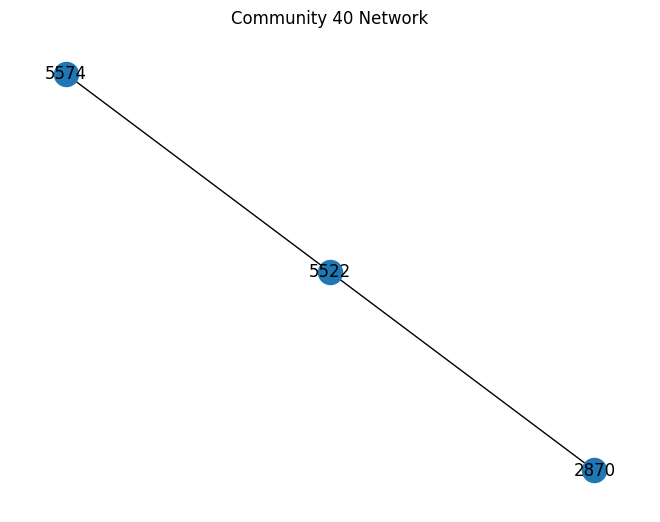

In [ ]:
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
import matplotlib.pyplot as plt

# Assuming you have a graph G

# Detect communities using the greedy modularity algorithm
print("Running greedy modularity algorithm to detect communities...")

communities = list(greedy_modularity_communities(G))

# Print intermediate outputs
print("Greedy modularity algorithm completed. Now printing detected communities:")

# Print the detected communities and count of nodes
for i, community_nodes in enumerate(communities):
    community_size = len(community_nodes)
    print(f"Community {i + 1} (Size: {community_size}): {list(community_nodes)}")

print("Community detection process completed.")

# Choose a specific community to plot
chosen_community_number = 40  # Change this to the desired community number
if 0 <= chosen_community_number < len(communities):
    community_nodes = communities[chosen_community_number]
    community_graph = G.subgraph(community_nodes)

    # Plot the community
    pos = nx.spring_layout(community_graph)
    nx.draw(community_graph, pos, with_labels=True)
    plt.title(f'Community {chosen_community_number} Network')
    plt.show()
else:
    print(f"Community {chosen_community_number} not found.")


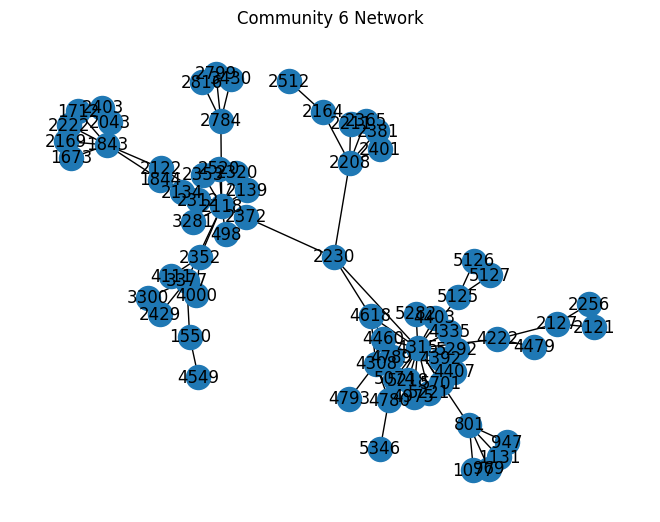

In [ ]:
# Choose a specific community to plot
chosen_community_number = 6  # Change this to the desired community number
if 0 <= chosen_community_number < len(communities):
    community_nodes = communities[chosen_community_number]
    community_graph = G.subgraph(community_nodes)

    # Plot the community
    pos = nx.spring_layout(community_graph)
    nx.draw(community_graph, pos, with_labels=True)
    plt.title(f'Community {chosen_community_number} Network')
    plt.show()
else:
    print(f"Community {chosen_community_number} not found.")

In [ ]:
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
import numpy as np

# Assuming you have a graph G and a DataFrame df with a 'Time' column
# Assuming df is sorted by time

# Get unique time points from the 'Time' column
unique_time_points = df['Time'].unique()

# Initialize variables to store information about the community with maximum centrality change
max_change_community = None
max_change_value = -np.inf

# Iterate over consecutive pairs of time points
for i in range(len(unique_time_points) - 1):
    t1 = unique_time_points[i]
    t2 = unique_time_points[i + 1]

    # Get nodes at time t1 and t2
    nodes_at_t1 = df[df['Time'] == t1]['Source'].tolist() + df[df['Time'] == t1]['Target'].tolist()
    nodes_at_t2 = df[df['Time'] == t2]['Source'].tolist() + df[df['Time'] == t2]['Target'].tolist()

    # Compute degree centrality for each node at time t1
    centrality_t1 = nx.degree_centrality(G.subgraph(nodes_at_t1))

    # Compute degree centrality for each node at time t2
    centrality_t2 = nx.degree_centrality(G.subgraph(nodes_at_t2))

    # Calculate the change in degree centrality for each node
    centrality_change = {node: centrality_t2.get(node, 0) - centrality_t1.get(node, 0) for node in G.nodes()}

    # Assign nodes to communities using the Louvain algorithm at time t1
    communities_t1 = list(greedy_modularity_communities(G.subgraph(nodes_at_t1)))

    # Iterate over communities at time t1
    for j, community_nodes in enumerate(communities_t1):
        # Calculate the total centrality change for the community
        community_change = sum(centrality_change[node] for node in community_nodes)

        # Update max_change_community if the current community has a higher total change
        if community_change > max_change_value:
            max_change_community = community_nodes
            max_change_value = community_change

# Display information about the community with the maximum centrality change
print(f"Community with Maximum Centrality Change:")
print(f"Size: {len(max_change_community)}")
print(f"Number of Nodes: {len(G.subgraph(max_change_community))}")
print(f"Community Structure Before Change: {list(max_change_community)}")

# Identify nodes added and removed from the community between t1 and t2
nodes_added = [node for node in max_change_community if centrality_change[node] > 0]
nodes_removed = [node for node in max_change_community if centrality_change[node] < 0]

print(f"Nodes Added: {nodes_added}")
print(f"Nodes Removed: {nodes_removed}")

# Display the community structure after the change (at time t2)
community_t2 = [node for node in max_change_community if node not in nodes_removed] + nodes_added
print(f"Community Structure After Change: {community_t2}")


Community with Maximum Centrality Change:
Size: 2
Number of Nodes: 2
Community Structure Before Change: [3365, 2125]
Nodes Added: []
Nodes Removed: []
Community Structure After Change: [3365, 2125]


In [ ]:
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
import pandas as pd

# Assuming you have a graph G and a DataFrame df with a 'Time' column
# Assuming df is sorted by time

# Get unique years from the 'Time' column
df['Year'] = pd.to_datetime(df['Time']).dt.year
unique_years = df['Year'].unique()

# Initialize a list to store information about communities and their centrality changes
community_changes = []

# Iterate over consecutive pairs of years
for i in range(len(unique_years) - 1):
    year1 = unique_years[i]
    year2 = unique_years[i + 1]

    # Get nodes at year1 and year2
    nodes_at_year1 = df[df['Year'] == year1]['Source'].tolist() + df[df['Year'] == year1]['Target'].tolist()
    nodes_at_year2 = df[df['Year'] == year2]['Source'].tolist() + df[df['Year'] == year2]['Target'].tolist()

    # Compute degree centrality for each node at year1
    centrality_year1 = nx.degree_centrality(G.subgraph(nodes_at_year1))

    # Compute degree centrality for each node at year2
    centrality_year2 = nx.degree_centrality(G.subgraph(nodes_at_year2))

    # Calculate the change in degree centrality for each node
    centrality_change = {node: centrality_year2.get(node, 0) - centrality_year1.get(node, 0) for node in G.nodes()}

    # Assign nodes to communities using the Louvain algorithm at year1
    communities_year1 = list(greedy_modularity_communities(G.subgraph(nodes_at_year1)))

    # Iterate over communities at year1
    for j, community_nodes in enumerate(communities_year1):
        # Calculate the total centrality change for the community
        community_change = sum(centrality_change[node] for node in community_nodes)

        # Append information about the community and its centrality change to the list
        community_changes.append({
            'Year1': year1,
            'Year2': year2,
            'Community': community_nodes,
            'CentralityChange': community_change,
        })

# Sort the list of community changes based on centrality change in descending order
community_changes = sorted(community_changes, key=lambda x: x['CentralityChange'], reverse=True)

# Display information about the top 10 communities with the maximum centrality change
print("Top 10 Communities with Maximum Centrality Change:")
for i in range(min(10, len(community_changes))):
    community_info = community_changes[i]
    print(f"Community {i + 1}:")
    print(f"Year1: {community_info['Year1']}, Year2: {community_info['Year2']}")
    print(f"Size: {len(community_info['Community'])}")
    print(f"Number of Nodes: {len(G.subgraph(community_info['Community']))}")
    print(f"Centrality Change: {community_info['CentralityChange']}")
    print(f"Community Structure: {list(community_info['Community'])}\n")


Top 10 Communities with Maximum Centrality Change:
Community 1:
Year1: 2014, Year2: 2015
Size: 345
Number of Nodes: 345
Centrality Change: 0.5512615762615765
Community Structure: [2056, 2063, 4114, 2067, 4118, 5146, 4125, 33, 4131, 3107, 4136, 51, 5175, 57, 2110, 4172, 2131, 5212, 4189, 96, 3172, 4197, 104, 5227, 5228, 5231, 4209, 5234, 4213, 4217, 3194, 5249, 5251, 5253, 5255, 4235, 5259, 5267, 5272, 4251, 4253, 3229, 5279, 160, 5280, 5284, 4267, 5293, 5294, 5296, 5297, 5298, 5300, 5304, 5306, 5307, 5308, 5309, 5311, 5315, 4291, 5316, 3270, 3272, 5322, 3278, 4304, 2262, 4320, 5345, 5347, 5355, 5362, 1267, 5363, 5365, 3317, 5368, 5372, 3327, 5383, 4361, 4365, 3345, 2322, 5396, 5397, 5398, 280, 5403, 4382, 5409, 5410, 4389, 5419, 5425, 5426, 3380, 3384, 5434, 5437, 4418, 5442, 5444, 5443, 5445, 4419, 5446, 5448, 4424, 5449, 5451, 5452, 5457, 5459, 5460, 2388, 5462, 5463, 4439, 5465, 5466, 2396, 5469, 5470, 2397, 5472, 3427, 5476, 5477, 4452, 3429, 5480, 5481, 361, 1394, 5494, 5497, 1403

In [ ]:

for i in range(min(2, len(community_changes))):
    community_info = community_changes[i]
    print(f"Top Community {i + 1}:")
    print(f"Year1: {community_info['Year1']}, Year2: {community_info['Year2']}")
    print(f"Size: {len(community_info['Community'])}")
    print(f"Number of Nodes: {len(G.subgraph(community_info['Community']))}")
    print(f"Centrality Change: {community_info['CentralityChange']}")
    print(f"Community Structure: {list(community_info['Community'])}\n")

    # Identify the central nodes and their centrality changes
    centrality_change_per_node = {node: centrality_year2.get(node, 0) - centrality_year1.get(node, 0) for node in community_info['Community']}
    central_nodes = sorted(centrality_change_per_node, key=lambda x: centrality_change_per_node[x], reverse=True)

    # Display information about central nodes
    print("Central Nodes and Their Centrality Changes:")
    for j, central_node in enumerate(central_nodes[:5]):  # Display information for the top 5 central nodes
        centrality_change = centrality_change_per_node[central_node]
        centrality_pre = centrality_year1.get(central_node, 0)
        centrality_post = centrality_year2.get(central_node, 0)
        print(f"{j + 1}. Node {central_node}:")
        print(f"   Centrality (Pre): {centrality_pre}")
        print(f"   Centrality (Post): {centrality_post}")
        print(f"   Centrality Change: {centrality_change}")
        print("\n")


Top Community 1:
Year1: 2014, Year2: 2015
Size: 345
Number of Nodes: 345
Centrality Change: 0.5512615762615765
Community Structure: [2056, 2063, 4114, 2067, 4118, 5146, 4125, 33, 4131, 3107, 4136, 51, 5175, 57, 2110, 4172, 2131, 5212, 4189, 96, 3172, 4197, 104, 5227, 5228, 5231, 4209, 5234, 4213, 4217, 3194, 5249, 5251, 5253, 5255, 4235, 5259, 5267, 5272, 4251, 4253, 3229, 5279, 160, 5280, 5284, 4267, 5293, 5294, 5296, 5297, 5298, 5300, 5304, 5306, 5307, 5308, 5309, 5311, 5315, 4291, 5316, 3270, 3272, 5322, 3278, 4304, 2262, 4320, 5345, 5347, 5355, 5362, 1267, 5363, 5365, 3317, 5368, 5372, 3327, 5383, 4361, 4365, 3345, 2322, 5396, 5397, 5398, 280, 5403, 4382, 5409, 5410, 4389, 5419, 5425, 5426, 3380, 3384, 5434, 5437, 4418, 5442, 5444, 5443, 5445, 4419, 5446, 5448, 4424, 5449, 5451, 5452, 5457, 5459, 5460, 2388, 5462, 5463, 4439, 5465, 5466, 2396, 5469, 5470, 2397, 5472, 3427, 5476, 5477, 4452, 3429, 5480, 5481, 361, 1394, 5494, 5497, 1403, 5500, 3451, 3452, 5504, 5512, 3465, 5517, 551

In [ ]:
def print_structure(graph, community_nodes):
    structure = []
    for node in community_nodes:
        neighbors = list(graph.neighbors(node))
        structure.append(f"Node {node}: Connected to {neighbors}")
    print("\n".join(structure))

In [ ]:
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities

# Function to calculate betweenness centrality
def calculate_betweenness_centrality(graph):
    return nx.betweenness_centrality(graph)

# Function to find communities with the maximum change in betweenness centrality
def find_max_change_communities(graph, df):
    # Extract unique years from the 'Time' column
    unique_years = df['Time'].dt.year.unique()

    # Dictionary to store community details
    community_details = {}

    # Loop through each pair of consecutive years
    for t1, t2 in zip(unique_years[:-1], unique_years[1:]):
        # Create subgraphs for each time point
        subgraph_t1 = graph.subgraph(df[df['Time'].dt.year == t1]['Source'].unique())
        subgraph_t2 = graph.subgraph(df[df['Time'].dt.year == t2]['Source'].unique())

        # Calculate betweenness centrality for each time point
        betweenness_t1 = calculate_betweenness_centrality(subgraph_t1)
        betweenness_t2 = calculate_betweenness_centrality(subgraph_t2)

        # Calculate the change in betweenness centrality for each node
        betweenness_change = {
            node: betweenness_t2[node] - betweenness_t1[node] if node in betweenness_t1 and node in betweenness_t2 else None
            for node in set(betweenness_t1) | set(betweenness_t2)
        }

        # Filter out None values
        betweenness_change_filtered = {node: change for node, change in betweenness_change.items() if change is not None}

        # Find the top node with maximum change in betweenness centrality
        max_change_node = max(betweenness_change_filtered, key=betweenness_change_filtered.get)

        # Find the community of the node at time t2
        community_t2 = next(community for community in greedy_modularity_communities(subgraph_t2) if max_change_node in community)

        # Find the nodes added and removed from the community
        nodes_added = [node for node in community_t2 if node not in subgraph_t1.nodes()]
        nodes_removed = [node for node in subgraph_t1.nodes() if node not in community_t2]

        # Store the details in the dictionary
        community_details[(t1, t2)] = {
            'Size': len(community_t2),
            'Number of Nodes': len(subgraph_t2.nodes()),
            'Community Structure Before Change': list(subgraph_t1.nodes()),
            'Nodes Added': nodes_added,
            'Nodes Removed': nodes_removed,
            'Community Structure After Change': list(community_t2),
            'Max Change Node': max_change_node,
            'Betweenness Centrality Before': betweenness_t1.get(max_change_node, None),
            'Betweenness Centrality After': betweenness_t2.get(max_change_node, None),
            'Betweenness Centrality Change': betweenness_change.get(max_change_node, None),
        }

    return community_details

# Example usage
community_details = find_max_change_communities(G, df)


# Print the results
for (t1, t2), details in community_details.items():
    print(f"\nCommunity with Maximum Betweenness Centrality Change between {t1} and {t2}:")
    print(f"Size: {details['Size']}")
    print(f"Number of Nodes: {details['Number of Nodes']}")

    # Create subgraph for time t1
    subgraph_t1 = G.subgraph(details['Community Structure Before Change'])

    print("Community Structure Before Change:")
    print_structure(subgraph_t1, details['Community Structure Before Change'])


    print(f"Max Change Node: {details['Max Change Node']}")
    print(f"Betweenness Centrality Before: {details['Betweenness Centrality Before']}")
    print(f"Betweenness Centrality After: {details['Betweenness Centrality After']}")
    print(f"Betweenness Centrality Change: {details['Betweenness Centrality Change']}")
    print("\n---\n")



Community Structure Before Change:

Community Structure After Change:


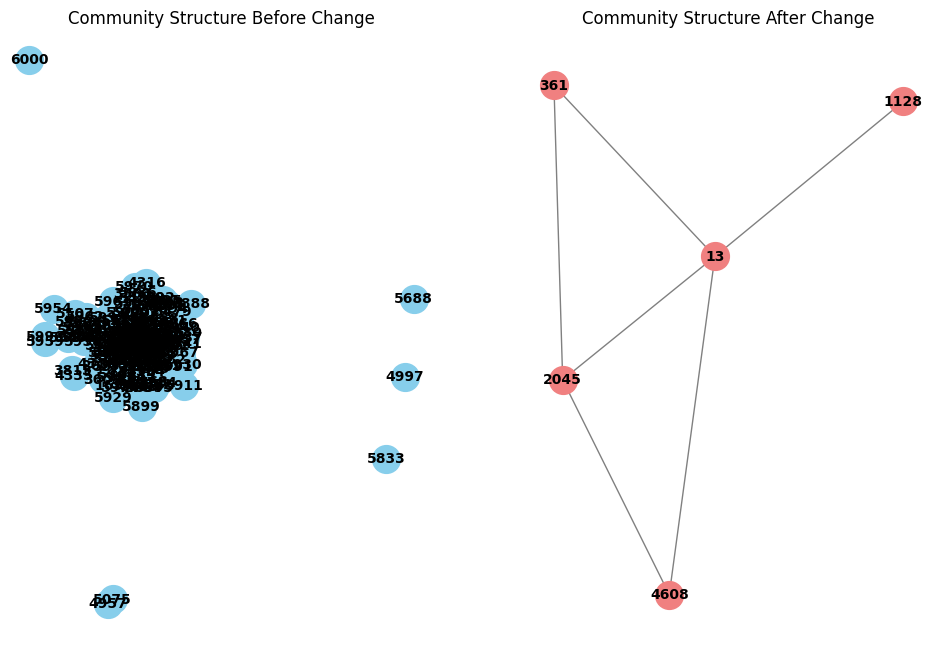

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt


# Print the community structure before and after the change
print("Community Structure Before Change:")
#print_structure(subgraph_t1, details['Community Structure Before Change'])

print("\nCommunity Structure After Change:")
#print_structure(subgraph_t2, details['Community Structure After Change'])

# Create a graph from the community structure before the change
community_nodes_before_change = details['Community Structure Before Change']
community_graph_before_change = G.subgraph(community_nodes_before_change)

# Create a graph from the community structure after the change
community_nodes_after_change = details['Community Structure After Change']
community_graph_after_change = G.subgraph(community_nodes_after_change)

# Plot the community structure before the change
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
pos_before_change = nx.spring_layout(community_graph_before_change)
nx.draw(community_graph_before_change, pos_before_change, with_labels=True, font_size=10, node_size=400, node_color='skyblue', edge_color='gray', font_color='black', font_weight='bold')
plt.title("Community Structure Before Change")

# Plot the community structure after the change
plt.subplot(1, 2, 2)
pos_after_change = nx.spring_layout(community_graph_after_change)
nx.draw(community_graph_after_change, pos_after_change, with_labels=True, font_size=10, node_size=400, node_color='lightcoral', edge_color='gray', font_color='black', font_weight='bold')
plt.title("Community Structure After Change")

plt.show()

